<a href="https://colab.research.google.com/github/marciosferreira/variational_auto_encoder/blob/main/mnist.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from torchvision import datasets

# Carregar o conjunto de dados sem transformações
train_set = datasets.FashionMNIST(root='./data', train=True, download=True, transform=None)


100%|██████████| 26421880/26421880 [00:02<00:00, 11776866.47it/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 201039.15it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:01<00:00, 3672729.48it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 22329138.56it/s]


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
tensor_images, labels = train_set.data[:5000], train_set.targets[:5000]


# Variational autoencoder and its extensions


---

This notebook demonstrates application of different variational autoencoders (VAEs) to rotated images. Specifically, we discuss rotationally invariant version of VAE (rVAE) and class-conditioned VAE and rVAE.

Prepared by Maxim Ziatdinov  (Feb 2021)

E-mail: maxim.ziatdinov@ai4microscopy.com

---



## Installation/Imports/Utility functions

*Make sure to click "Play" button for the next 4 cells ("Installation and Imports", "Load neural networks for VAE", etc.) to load all the necessary modules and functions!*

#@title Installation and Imports


In [4]:
#@title Installation and Imports

!pip install -qq pyro-ppl

from typing import Optional, Tuple, Type, Union

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pyro
import pyro.distributions as dist
import pyro.infer as infer
import pyro.optim as optim
import torch
import torch.nn as nn
from torch import Tensor as tt
from scipy.stats import norm
from torchvision import datasets, transforms
from torchvision.utils import make_grid

import warnings
warnings.filterwarnings("ignore", module="torchvision.datasets")

from torchvision.transforms import ToPILImage


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.8/732.8 kB 9.5 MB/s eta 0:00:00


In [5]:
#@title Load functions for working with image coordinates and labels { form-width: "25%" }

def to_onehot(idx: torch.Tensor, n: int) -> torch.Tensor:


    """
    One-hot encoding of a label
    """
    #print("onehot")
    #print(idx)
    if torch.max(idx).item() >= n:
        raise AssertionError(
            "Labelling must start from 0 and "
            "maximum label value must be less than total number of classes")
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    if idx.dim() == 1:
        idx = idx.unsqueeze(1).long()
    onehot = torch.zeros(idx.size(0), n, device=device)
    #return onehot.scatter_(1, idx.to(device), 1)
    return onehot.scatter_(1, idx.long().to(device), 1)



def grid2xy(X1: torch.Tensor, X2: torch.Tensor) -> torch.Tensor:
    X = torch.cat((X1[None], X2[None]), 0)
    d0, d1 = X.shape[0], X.shape[1] * X.shape[2]
    X = X.reshape(d0, d1).T
    return X


def imcoordgrid(im_dim: Tuple) -> torch.Tensor:
    xx = torch.linspace(-1, 1, im_dim[0])
    yy = torch.linspace(1, -1, im_dim[1])
    x0, x1 = torch.meshgrid(xx, yy)
    return grid2xy(x0, x1)


def transform_coordinates(coord: torch.Tensor,
                          phi: Union[torch.Tensor, float] = 0,
                          coord_dx: Union[torch.Tensor, float] = 0,
                          ) -> torch.Tensor:

    if torch.sum(phi) == 0:
        phi = coord.new_zeros(coord.shape[0])
    rotmat_r1 = torch.stack([torch.cos(phi), torch.sin(phi)], 1)
    rotmat_r2 = torch.stack([-torch.sin(phi), torch.cos(phi)], 1)
    rotmat = torch.stack([rotmat_r1, rotmat_r2], axis=1)
    coord = torch.bmm(coord, rotmat)




    return coord + coord_dx

In [6]:
#@title Load neural networks for VAE { form-width: "25%" }

def set_deterministic_mode(seed: int) -> None:
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False


def make_fc_layers(in_dim: int,
                   hidden_dim: int = 128,
                   num_layers: int = 2,
                   activation: str = "lrelu"
                   ) -> Type[nn.Module]:
    """
    Generates a module with stacked fully-connected (aka dense) layers
    """
    in_dim=int(in_dim)


    activations = {
    "tanh": nn.Tanh,
    "lrelu": nn.LeakyReLU,
    "softplus": nn.Softplus,
    "linear": nn.Identity
}


    fc_layers = []

    for i in range(num_layers):
        hidden_dim_ = in_dim if i == 0 else hidden_dim
        fc_layers.extend(
            [nn.Linear(hidden_dim_, hidden_dim),
            activations[activation]()])


    fc_layers = nn.Sequential(*fc_layers)
    return fc_layers


class fcEncoderNet(nn.Module):
    """
    Simple fully-connected inference (encoder) network
    """
    def __init__(self,
                 in_dim: Tuple[int],
                 latent_dim: int = 2,
                 hidden_dim:int = 128,
                 num_layers: int = 2,
                 activation: str = 'tanh',
                 softplus_out: bool = False
                 ) -> None:
        """
        Initializes module parameters
        """

        super(fcEncoderNet, self).__init__()


        if len(in_dim) not in [1, 2, 3]:
            raise ValueError("in_dim must be (h, w), (h, w, c), or (h*w*c,)")
        self.in_dim = torch.prod(tt(in_dim)).item()



        self.fc_layers = make_fc_layers(
        self.in_dim, hidden_dim, num_layers, activation)
        self.fc11 = nn.Linear(hidden_dim, latent_dim)
        self.fc12 = nn.Linear(hidden_dim, latent_dim)
        self.activation_out = nn.Softplus() if softplus_out else lambda x: x

    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor]:
        """
        Forward pass
        """

        x = x.view(-1, int(self.in_dim))



        x = self.fc_layers(x)
        mu = self.fc11(x)
        log_sigma = self.activation_out(self.fc12(x))
        return mu, log_sigma


class fcDecoderNet(nn.Module):
    """
    Standard decoder for VAE
    """
    def __init__(self,
                 out_dim: Tuple[int],
                 latent_dim: int = 2,   #change here
                 hidden_dim:int = 128,
                 num_layers: int = 2,
                 activation: str = 'lrelu',
                 sigmoid_out: str = True,
                 ) -> None:
        super(fcDecoderNet, self).__init__()
        if len(out_dim) not in [1, 2, 3]:
            raise ValueError("in_dim must be (h, w), (h, w, c), or (h*w*c,)")


        self.reshape = out_dim
        out_dim = torch.prod(tt(out_dim)).item()
        self.fc_layers = make_fc_layers(
            latent_dim, hidden_dim, num_layers, activation)


        out_dim = int(out_dim)


        self.out = nn.Linear(hidden_dim, out_dim)

        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        x = self.fc_layers(z)
        x = self.activation_out(self.out(x))
        return x.view(-1, *self.reshape)


class rDecoderNet(nn.Module):
    """
    Spatial generator (decoder) network with fully-connected layers
    """
    def __init__(self,
                 out_dim: Tuple[int],
                 latent_dim: int,
                 hidden_dim:int = 2,
                 num_layers: int = 2,
                 activation: str = 'lrelu',
                 sigmoid_out: str = True
                 ) -> None:
        """
        Initializes module parameters
        """

        super(rDecoderNet, self).__init__()
        if len(out_dim) not in [1, 2, 3]:
            raise ValueError("in_dim must be (h, w), (h, w, c), or (h*w*c,)")
        self.reshape = out_dim
        out_dim = torch.prod(tt(out_dim)).item()

        self.coord_latent = coord_latent(latent_dim, hidden_dim)
        self.fc_layers = make_fc_layers(
            hidden_dim, hidden_dim, num_layers, activation)

        self.out = nn.Linear(hidden_dim, 1) # need to generalize to multi-channel (c > 1)
        self.activation_out = nn.Sigmoid() if sigmoid_out else lambda x: x

    def forward(self, x_coord: torch.Tensor, z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        x = self.coord_latent(x_coord, z)
        x = self.fc_layers(x)
        x = self.activation_out(self.out(x))
        return x.view(-1, *self.reshape)


class coord_latent(nn.Module):
    """
    The "spatial" part of the rVAE's decoder that allows for translational
    and rotational invariance (based on https://arxiv.org/abs/1909.11663)
    """
    def __init__(self,
                 latent_dim: int,
                 out_dim: int,
                 activation_out: bool = True) -> None:
        """
        Iniitalizes modules parameters
        """
        super(coord_latent, self).__init__()
        self.fc_coord = nn.Linear(2, out_dim)
        print("the latent dim")
        print(latent_dim)
        self.fc_latent = nn.Linear(latent_dim, out_dim, bias=False)
        self.activation = nn.Tanh() if activation_out else None

    def forward(self,
                x_coord: torch.Tensor,
                z: torch.Tensor) -> torch.Tensor:
        """
        Forward pass
        """
        batch_dim, n = x_coord.size()[:2]
        x_coord = x_coord.reshape(batch_dim * n, -1)
        h_x = self.fc_coord(x_coord)
        h_x = h_x.reshape(batch_dim, n, -1)
        h_z = self.fc_latent(z)
        h = h_x.add(h_z.unsqueeze(1))
        h = h.reshape(batch_dim * n, -1)
        if self.activation is not None:
            h = self.activation(h)
        return h

In [7]:
import torch

images_per_class = 10

def create_image_array(original_images):

    # Verifica se o tensor original_images não está vazio e tem pelo menos 4 imagens
    if original_images.size(0) < 10:
        raise ValueError("O tensor de imagens original deve conter pelo menos 4 imagens.")

    first_images = original_images[:500]

    new_images = torch.cat([img.unsqueeze(0).repeat(images_per_class, 1, 1) for img in first_images], dim=0)

    # Cria um tensor de índices que representa as classes
    num_classes = new_images.size(0) // images_per_class
    indices = torch.arange(num_classes).repeat_interleave(images_per_class)

    return new_images, indices

new_images, indices = create_image_array(tensor_images) # commented just for tests



## Define model and trainer

Next, we define our rVAE as a probabilistic model. To do this, first, we define our generative model (aka decoder) whose goal is to reconstruct observations (images) from the latent "code". Then we write an appropriate *guide* function (aka encoder) whose job is to ‘guess’ good values for the latent random variables. We are also going to add some helper functions to the rVAE class for the encoding of images and visualization of the learned latent manifold so that we do not have to write them over and over again.

In [8]:
train_data = new_images
originl_data = train_data.clone()
train_labels = indices


In [9]:
from PIL import Image, ImageDraw
from torchvision.transforms import ToTensor
import torch
from typing import Tuple, Type
import torch.utils.data
import random

def add_noise_to_image(image: Image.Image, noise_intensity: float) -> Image.Image:
    width, height = image.size
    draw = ImageDraw.Draw(image)

    for x in range(width):
        for y in range(height):
            if random.random() < noise_intensity:
                draw.point((x, y), fill=0)  # Preencha o ponto com preto

    return image

def get_rotated_mnist(rotation_range: Tuple[int], noise_intensity: float = 0.0) -> Tuple[torch.Tensor]:
    imstack_train_r = torch.zeros_like(train_data, dtype=torch.float32)
    labels, angles = [], []

    for i, (im, lbl) in enumerate(zip(train_data, train_labels)):
        im = ToPILImage()(im)

        if noise_intensity > 0.0:
            im = add_noise_to_image(im, noise_intensity)

        # Define theta como 0 se o intervalo de rotação for [0, 0]
        if rotation_range[0] == rotation_range[1]:
            theta = torch.tensor([0.0])
        else:
            theta = torch.randint(*rotation_range, (1,)).float()

        im = im.rotate(theta.item(), resample=Image.BICUBIC, fillcolor="white")

        imstack_train_r[i] = ToTensor()(im)
        labels.append(lbl)
        angles.append(torch.deg2rad(theta))

    imstack_train_r /= imstack_train_r.max()
    return imstack_train_r, tt(labels), tt(angles)


def get_rotated_mnist_sequential_groups(num_images_per_group: int, rotation_range: Tuple[int], noise_intensity: float = 0.0) -> Tuple[torch.Tensor]:
    imstack_train_r = torch.zeros_like(train_data, dtype=torch.float32)
    labels, angles = [], []
    import math


    # Calcular ângulo de rotação para cada imagem no grupo em graus
    rotation_angle_degrees = 180 / num_images_per_group

    for i, (im, lbl) in enumerate(zip(train_data, train_labels)):
        im = ToPILImage()(im)

        if noise_intensity > 0.0:
            im = add_noise_to_image(im, noise_intensity)

        # Calcular o ângulo de rotação para a imagem atual em graus
        current_angle_degrees = (i % num_images_per_group + 1) * rotation_angle_degrees

        # Rotacionar a imagem
        im = im.rotate(current_angle_degrees, resample=Image.BICUBIC, fillcolor="black")
        imstack_train_r[i] = ToTensor()(im)
        labels.append(lbl)

        converted = math.radians(current_angle_degrees)

        # Converter o ângulo de graus para radianos e armazenar
        angles.append((converted - 6) if converted > 3 else converted)
        #angles.append(converted)

    imstack_train_r /= imstack_train_r.max()
    return imstack_train_r, torch.tensor(labels), torch.tensor(angles)



def init_dataloader(*args: torch.Tensor, **kwargs: int
                    ) -> Type[torch.utils.data.DataLoader]:

    batch_size = kwargs.get("batch_size", 100)
    tensor_set = torch.utils.data.dataset.TensorDataset(*args)
    data_loader = torch.utils.data.DataLoader(
        dataset=tensor_set, batch_size=batch_size, shuffle=True)
    return data_loader

In [10]:
#train_labels
#train_labels = train_labels.to(dtype=torch.int64)


In [11]:

train_data, train_labels, angles = get_rotated_mnist_sequential_groups(10, rotation_range=[-60, 61], noise_intensity=0.0)  #a have added option to add noise, just to test


train_loader = init_dataloader(train_data, batch_size=100)

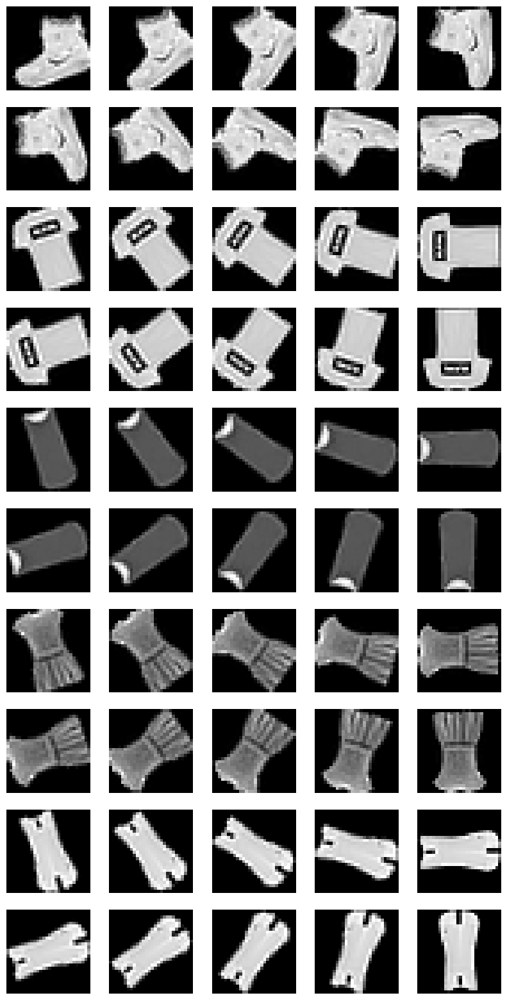

In [12]:
import matplotlib.pyplot as plt

def plot_images(tensor, num_images=50):
    # Define o número de colunas para exibir as imagens
    cols = 5

    # Calcula o número necessário de linhas para exibir num_images imagens
    rows = num_images // cols + int(num_images % cols > 0)

    # Cria uma figura com subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

    for i in range(num_images):
        ax = axes[i // cols, i % cols]
        # tensor[i] acessa a i-ésima imagem; .numpy() converte para um array numpy
        ax.imshow(tensor[i].numpy().squeeze(), cmap='gray')  # Supondo que as imagens são em escala de cinza
        ax.axis('off')

    # Esconde subplots extras se houver
    for j in range(i + 1, rows * cols):
        axes[j // cols, j % cols].axis('off')

    plt.show()

# Chama a função passando o tensor train_data
plot_images(train_data)


In [13]:
import torch
from torch import Tensor as tt

tensor_val = tt(torch.Size([28, 28]))
prod_val = torch.prod(tensor_val)


In [14]:
class rVAE(nn.Module):
    """
    Variational autoencoder with rotational and/or transaltional invariance
    """
    def __init__(self,
                 in_dim: Tuple[int],
                 latent_dim: int = 3, #change here
                 coord: int = 3,
                 num_classes: int = 0,
                 hidden_dim_e: int = 128,
                 hidden_dim_d: int = 128,
                 num_layers_e: int = 2,
                 num_layers_d: int = 2,
                 activation: str = "lrelu",
                 softplus_sd: bool = True,
                 sigmoid_out: bool = True,
                 seed: int = 1,
                 **kwargs
                 ) -> None:
        """
        Initializes rVAE's modules and parameters
        """

        super(rVAE, self).__init__()
        pyro.clear_param_store()
        set_deterministic_mode(seed)
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'


        self.encoder_net = fcEncoderNet(
            in_dim, latent_dim+coord, hidden_dim_e,
            num_layers_e, activation, softplus_sd)
        if coord not in [0, 1, 2, 3]:
            raise ValueError("'coord' argument must be 0, 1, 2 or 3")
        dnet = rDecoderNet if coord in [1, 2, 3] else fcDecoderNet


        self.decoder_net = dnet(
            in_dim, latent_dim+num_classes, hidden_dim_d,
            num_layers_d, activation, sigmoid_out)
        self.z_dim = latent_dim + coord
        self.coord = coord
        self.num_classes = num_classes
        self.grid = imcoordgrid(in_dim).to(self.device)

        #self.dx_prior = tt(kwargs.get("dx_prior", 0.1)).to(self.device)
        self.dx_prior = tt([kwargs.get("dx_prior", 0.1)]).to(self.device)



        self.to(self.device)


    def model(self,
              x: torch.Tensor,
              y: Optional[torch.Tensor] = None,
              **kwargs: float) -> torch.Tensor:
        """
        Defines the model p(x|z)p(z)
        """
        # register PyTorch module `decoder_net` with Pyro
        pyro.module("decoder_net", self.decoder_net)
        # KLD scale factor (see e.g. https://openreview.net/pdf?id=Sy2fzU9gl)
        beta = kwargs.get("scale_factor", 2)
        #reshape_ = torch.prod(tt(x.shape[1:])).item()
        #reshape_ = torch.prod(tt(torch.Size([56, 56])))
        reshape_ = x.shape[1:][0] * x.shape[1:][1]

        ####################################################

        with pyro.plate("data", x.shape[0]):
            # setup hyperparameters for prior p(z)
            z_loc = x.new_zeros(torch.Size((x.shape[0], self.z_dim)))
            z_scale = x.new_ones(torch.Size((x.shape[0], self.z_dim)))
            # sample from prior (value will be sampled by guide when computing the ELBO)
            with pyro.poutine.scale(scale=beta):
                z = pyro.sample("latent", dist.Normal(z_loc, z_scale).to_event(1))
            if self.coord > 0:  # rotationally- and/or translationaly-invariant mode
                # Split latent variable into parts for rotation
                # and/or translation and image content
                phi, dx, z = self.split_latent(z)
                if torch.sum(dx) != 0:
                    dx = (dx * self.dx_prior).unsqueeze(1)
                # transform coordinate grid
                grid = self.grid.expand(x.shape[0], *self.grid.shape)
                x_coord_prime = transform_coordinates(grid, phi, dx)
            # Add class label (if any)
            if y is not None:
                y = to_onehot(y, self.num_classes)
                z = torch.cat([z, y], dim=-1)
            # decode the latent code z together with the transformed coordiantes (if any)
            dec_args = (x_coord_prime, z) if self.coord else (z,)
            loc_img = self.decoder_net(*dec_args)
            # score against actual images ("binary cross-entropy loss")

            pyro.sample(
                "obs", dist.Bernoulli(loc_img.view(-1, int(reshape_)), validate_args=False).to_event(1),
                obs=x.view(-1, reshape_))

    def guide(self,
              x: torch.Tensor,
              y: Optional[torch.Tensor] = None,
              **kwargs: float) -> torch.Tensor:
        """
        Defines the guide q(z|x)
        """
        # register PyTorch module `encoder_net` with Pyro
        pyro.module("encoder_net", self.encoder_net)
        # KLD scale factor (see e.g. https://openreview.net/pdf?id=Sy2fzU9gl)
        beta = kwargs.get("scale_factor", 2)
        with pyro.plate("data", x.shape[0]):
            # use the encoder to get the parameters used to define q(z|x)
            z_loc, z_scale = self.encoder_net(x)
            # sample the latent code z
            with pyro.poutine.scale(scale=beta):
                pyro.sample("latent", dist.Normal(z_loc, z_scale).to_event(1))

    def split_latent(self, z: torch.Tensor) -> Tuple[torch.Tensor]:
        """
        Split latent variable into parts for rotation
        and/or translation and image content
        """
        phi = torch.tensor(0.0)
        dx = torch.tensor(0.0)


        # rotation + translation
        if self.coord == 3:
            phi = z[:, 0]  # encoded angle
            dx = z[:, 1:3]  # translation
            z = z[:, 3:]  # image content
        # translation only
        elif self.coord == 2:
            dx = z[:, :2]
            z = z[:, 2:]
        # rotation only
        elif self.coord == 1:
            phi = z[:, 0]
            z = z[:, 1:]
        return phi, dx, z

    def _encode(self, x_new: torch.Tensor, **kwargs: int) -> torch.Tensor:
        """
        Encodes data using a trained inference (encoder) network
        in a batch-by-batch fashion
        """
        def inference() -> np.ndarray:
            with torch.no_grad():
                encoded = self.encoder_net(x_i)
            encoded = torch.cat(encoded, -1).cpu()
            return encoded

        x_new = x_new.to(self.device)
        num_batches = kwargs.get("num_batches", 10)
        batch_size = len(x_new) // num_batches
        z_encoded = []
        for i in range(num_batches):
            x_i = x_new[i*batch_size:(i+1)*batch_size]
            z_encoded_i = inference()
            z_encoded.append(z_encoded_i)
        x_i = x_new[(i+1)*batch_size:]
        if len(x_i) > 0:
            z_encoded_i = inference()
            z_encoded.append(z_encoded_i)
        return torch.cat(z_encoded)


    def encode(self, x_new: torch.Tensor, **kwargs: int) -> torch.Tensor:
        """
        Encodes data using a trained inference (encoder) network
        (this is baiscally a wrapper for self._encode)
        """
        if isinstance(x_new, torch.utils.data.DataLoader):
            x_new = train_loader.dataset.tensors[0]
        z = self._encode(x_new)



        z_loc = z[:, :self.z_dim]
        z_scale = z[:, self.z_dim:]
        return z_loc, z_scale

    import torch
    import matplotlib.pyplot as plt
    from torchvision.utils import make_grid

    import torch
    import matplotlib.pyplot as plt
    from torchvision.utils import make_grid

    import torch
    import matplotlib.pyplot as plt
    from torchvision.utils import make_grid

    def bigmanifold2d(self, z_mean, z_sd, d=10, **kwargs):
        """
        Selects and plots images from latent space based on instances with lowest average standard deviation
        """

        # Calcular a média dos desvios padrões para cada instância
        avg_sd = torch.mean(z_sd, dim=1)

        # Selecionar os índices das instâncias com menores médias de desvios padrões
        highest_avg_std_indices = torch.argsort(avg_sd, descending=True)[:d]

        # Usar as médias correspondentes às menores médias de desvios padrões para gerar imagens
        selected_means = z_mean[highest_avg_std_indices]


        images = []
        for z in selected_means:
            z = z.unsqueeze(0).to(self.device)
            img = self.decoder_net(z)
            images.append(img.detach().cpu())

        # Plotting
        grid = make_grid(images, nrow=5, padding=kwargs.get("padding", 2), pad_value=kwargs.get("pad_value", 0))
        plt.figure(figsize=(8, 8))
        plt.imshow(grid.permute(1, 2, 0), cmap=kwargs.get("cmap", "gray"))
        plt.axis('off')
        plt.show()

    def smallmanifold2d(self, z_mean, z_sd, d=10, **kwargs):
            """
            Selects and plots images from latent space based on instances with lowest average standard deviation
            """

            # Calcular a média dos desvios padrões para cada instância
            avg_sd = torch.mean(z_sd, dim=1)

            # Selecionar os índices das instâncias com menores médias de desvios padrões
            lowest_avg_std_indices = torch.argsort(avg_sd)[:d]

            # Usar as médias correspondentes às menores médias de desvios padrões para gerar imagens
            selected_means = z_mean[lowest_avg_std_indices]


            images = []
            for z in selected_means:
                z = z.unsqueeze(0).to(self.device)
                img = self.decoder_net(z)
                images.append(img.detach().cpu())

            # Plotting
            grid = make_grid(images, nrow=5, padding=kwargs.get("padding", 2), pad_value=kwargs.get("pad_value", 0))
            plt.figure(figsize=(8, 8))
            plt.imshow(grid.permute(1, 2, 0), cmap=kwargs.get("cmap", "gray"))
            plt.axis('off')
            plt.show()




    def random_samples_from_latent(self, z_mean, z_sd, d, labels, target_label=None, **kwargs):


        if self.coord > 0:
          z_mean = z_mean[:, 1:]
          z_inv = z_mean[:, -1]
          print(z_inv)


        """
        Selects and plots images from latent space based on random samples
        corresponding to a specific target label or from any label if none is specified.
        """
        print(f"numero de classes: {self.num_classes}")
        if self.num_classes > 0:
            print(f"classes: {self.num_classes}")
            cls = torch.tensor(kwargs.get("label", 0))
            cls = to_onehot(cls.unsqueeze(0), self.num_classes)

        # Filtrar índices baseados no label alvo
        if target_label is not None:
            target_indices = torch.where(labels == target_label)[0]
        elif self.num_classes > 0:
            target_indices = torch.where(labels == kwargs.get("label", 0))[0]
        else:
           target_indices = torch.arange(labels.shape[0])


        # Selecionar d índices de forma aleatória dos índices filtrados
        random.seed(1)
        selected_indices = torch.tensor(random.sample(list(target_indices), d))
        # Usar os índices selecionados para escolher amostras de z_mean
        selected_means = z_mean[selected_indices]
        z_inv_selected = z_inv[selected_indices]

        #print(selected_means)



        if self.num_classes > 0:
            new_z_mean = []
            for z in selected_means:
              cls = cls.to('cuda:0')  # Garantir que cls está no mesmo dispositivo que z_mean
              z = z.view(1, -1)
              z=z.to('cuda:0')
              z = torch.cat([z, cls], dim=-1)
              new_z_mean.append(z)
            selected_means = new_z_mean

        images = []
        for i, z in enumerate(selected_means):

            z = z.unsqueeze(0).to(self.device)
            d_args = (self.grid.unsqueeze(0), z) if self.coord > 0 else (z,)
            img = self.decoder_net(*d_args)
            detached = img.detach().cpu()
            if z_inv_selected[i] < 0:
              detached = torch.flip(detached, [1, 2])

            images.append(detached)

        # Plotting
        grid = make_grid(images, nrow=5, padding=kwargs.get("padding", 2), pad_value=kwargs.get("pad_value", 0))
        plt.figure(figsize=(8, 8))
        plt.imshow(grid.permute(1, 2, 0), cmap=kwargs.get("cmap", "gray"))
        plt.axis('off')
        plt.show()
        #print(the_angles)


    def manifold2d(self, d: int, **kwargs: Union[str, int]) -> torch.Tensor:
        """
        Plots a learned latent manifold in the image space
        """


        print("manifold2d")
        print(print(kwargs))
        print("n classes")
        print(self.num_classes)
        if self.num_classes > 0:
            #cls = tt(kwargs.get("label", 0))
            cls = torch.tensor(kwargs.get("label", 0))



            print("the cls")
            print(cls)
            cls = to_onehot(cls.unsqueeze(0), self.num_classes)
            print(cls)
            print(cls.shape)
        grid_x = norm.ppf(torch.linspace(0.95, 0.05, d))
        grid_y = norm.ppf(torch.linspace(0.05, 0.95, d))
        loc_img_all = []
        for i, xi in enumerate(grid_x):
            for j, yi in enumerate(grid_y):
                z_sample = tt([xi, yi]).float().to(self.device).unsqueeze(0)
                if self.num_classes > 0:
                    print("z_sample")
                    print(z_sample)
                    print(z_sample.shape)

                    z_sample = torch.cat([z_sample, cls], dim=-1)

                d_args = (self.grid.unsqueeze(0), z_sample) if self.coord > 0 else (z_sample,)
                print("d_args")
                print(d_args)
                print(*d_args)
                print(d_args[0].shape)
                print(d_args[1].shape)
                print(d_args[1])
                loc_img = self.decoder_net(*d_args)
                loc_img_all.append(loc_img.detach().cpu())
        loc_img_all = torch.cat(loc_img_all)

        grid = make_grid(loc_img_all[:, None], nrow=d,
                         padding=kwargs.get("padding", 2),
                         pad_value=kwargs.get("pad_value", 0))
        plt.figure(figsize=(8, 8))
        plt.imshow(grid[0], cmap=kwargs.get("cmap", "gnuplot"),
                   origin=kwargs.get("origin", "upper"),
                   extent=[grid_x.min(), grid_x.max(), grid_y.min(), grid_y.max()])
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.xlabel("x", fontsize=18)
        plt.ylabel("y", fontsize=18)
        plt.show()





We also define a stochastic variational inference (SVI) trainer for model training and evaluation:

In [15]:
class SVItrainer:
    """
    Stochastic variational inference (SVI) trainer for
    unsupervised and class-conditioned variational models
    """
    def __init__(self,
                 model: Type[nn.Module],
                 optimizer: Type[optim.PyroOptim] = None,
                 loss: Type[infer.ELBO] = None,
                 seed: int = 1
                 ) -> None:
        """
        Initializes the trainer's parameters
        """

        print("the model")
        print(model)
        print(type(model))
        pyro.clear_param_store()
        set_deterministic_mode(seed)
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        if optimizer is None:
            optimizer = optim.Adam({"lr": 1.0e-3})
        if loss is None:
            loss = infer.Trace_ELBO()
        self.svi = infer.SVI(model.model, model.guide, optimizer, loss=loss)
        self.loss_history = {"training_loss": [], "test_loss": []}
        self.current_epoch = 0

    def set_current_epoch(self, epoch):
        self.current_epoch = epoch

    def train(self,
              train_loader: Type[torch.utils.data.DataLoader],
              **kwargs: float) -> float:
        """
        Trains a single epoch
        """
        # initialize loss accumulator
        epoch_loss = 0.
        # do a training epoch over each mini-batch returned by the data loader
        for data in train_loader:
            if len(data) == 1:  # VAE mode
                x = data[0]
                loss = self.svi.step(x.to(self.device), **kwargs)
            else:  # VED or cVAE mode
                x, y = data
                loss = self.svi.step(
                    x.to(self.device), y.to(self.device), **kwargs)
            # do ELBO gradient and accumulate loss
            epoch_loss += loss

        return epoch_loss / len(train_loader.dataset)

    def evaluate(self,
                 test_loader: Type[torch.utils.data.DataLoader],
                 **kwargs: float) -> float:
        """
        Evaluates current models state on a single epoch
        """
        # initialize loss accumulator
        test_loss = 0.
        # compute the loss over the entire test set
        with torch.no_grad():
            for data in test_loader:
                if len(data) == 1:  # VAE mode
                    x = data[0]
                    loss = self.svi.step(x.to(self.device), **kwargs)
                else:  # VED or cVAE mode
                    x, y = data
                    loss = self.svi.step(
                        x.to(self.device), y.to(self.device), **kwargs)
                test_loss += loss

        return test_loss / len(test_loader.dataset)

    def step(self,
             train_loader: Type[torch.utils.data.DataLoader],
             test_loader: Optional[Type[torch.utils.data.DataLoader]] = None,
             **kwargs: float) -> None:
        """
        Single training and (optionally) evaluation step
        """
        self.loss_history["training_loss"].append(self.train(train_loader,**kwargs))
        if test_loader is not None:
            self.loss_history["test_loss"].append(self.evaluate(test_loader,**kwargs))
        self.current_epoch += 1

    def print_statistics(self) -> None:
        """
        Prints training and test (if any) losses for current epoch
        """
        e = self.current_epoch
        if len(self.loss_history["test_loss"]) > 0:
            template = 'Epoch: {} Training loss: {:.4f}, Test loss: {:.4f}'
            print(template.format(e, self.loss_history["training_loss"][-1],
                                  self.loss_history["test_loss"][-1]))
        else:
            template = 'Epoch: {} Training loss: {:.4f}'
            print(template.format(e, self.loss_history["training_loss"][-1]))



## **Verify original images**

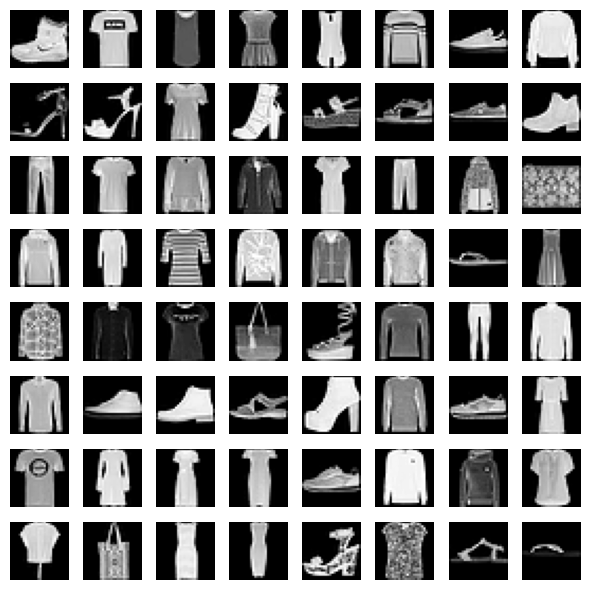

In [16]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def plot_tensor_images(tensor_images, num_images=64):
    """
    Função para plotar imagens a partir de um tensor do PyTorch.

    Argumentos:
    - tensor_images (torch.Tensor): Tensor de imagens no formato [N, H, W].
    - num_images (int): Número de imagens para plotar.

    """
    # Verifica se o tensor_images está no formato adequado
    if len(tensor_images.shape) != 3:
        raise ValueError("O tensor deve ter o formato [N, H, W].")

    N, H, W = tensor_images.shape

    # Cria um grid para exibir as imagens
    grid_size = int(np.sqrt(num_images))
    fig, axs = plt.subplots(grid_size, grid_size, figsize=(6, 6))

    for i in range(grid_size * grid_size):
        ax = axs[i // grid_size, i % grid_size]
        # Transforma o tensor em numpy
        img_np = tensor_images[i].cpu().numpy()
        ax.imshow(img_np, cmap='gray')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Exemplo de uso:
# Cria um tensor fictício de 2808 imagens grayscale 28x28
sample_tensor = torch.randn(2808, 28, 28)

# Plotando as primeiras 64 imagens
plot_tensor_images(tensor_images)

## Train different VAE models

### Train vanilla VAE

In [17]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('runs/vae')



Train VAE model:

In [18]:
%load_ext tensorboard
%tensorboard --logdir runs/vae



<IPython.core.display.Javascript object>

In [19]:

dddd

NameError: name 'dddd' is not defined

### **Train rotationally-invariant VAE (rVAE)**

In [20]:
train_loader = init_dataloader(train_data[0:5000], batch_size=1000)

In [21]:
n = 10 # frequency to save weights
in_dim = (28, 28)
# Inicializar a variável que mantém a última época
last_epoch = 0

# Initialize probabilistic VAE model ->
# (coord=0: vanilla VAE
#  coord=1: rotations only
#  coord=2: translations only
#  coord=3: rotations+translations)
rvae = rVAE(in_dim, latent_dim=3, coord=1, seed=0)

# Initialize SVI trainer
trainer = SVItrainer(rvae)

the latent dim
3


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


the model
rVAE(
  (encoder_net): fcEncoderNet(
    (fc_layers): Sequential(
      (0): Linear(in_features=784, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Linear(in_features=128, out_features=128, bias=True)
      (3): LeakyReLU(negative_slope=0.01)
    )
    (fc11): Linear(in_features=128, out_features=4, bias=True)
    (fc12): Linear(in_features=128, out_features=4, bias=True)
    (activation_out): Softplus(beta=1, threshold=20)
  )
  (decoder_net): rDecoderNet(
    (coord_latent): coord_latent(
      (fc_coord): Linear(in_features=2, out_features=128, bias=True)
      (fc_latent): Linear(in_features=3, out_features=128, bias=False)
      (activation): Tanh()
    )
    (fc_layers): Sequential(
      (0): Linear(in_features=128, out_features=128, bias=True)
      (1): LeakyReLU(negative_slope=0.01)
      (2): Linear(in_features=128, out_features=128, bias=True)
      (3): LeakyReLU(negative_slope=0.01)
    )
    (out): Linear(in_features=128, out_

In [22]:
import os
import torch

# Caminho para o arquivo de modelo salvo
model_path = '/content/drive/My Drive/model_vae.pth'



# Verificar se o arquivo de modelo salvo existe
if os.path.exists(model_path):
    print("arquivo de treino exists")
    # Carregar o estado salvo
    checkpoint = torch.load(model_path)
    rvae.load_state_dict(checkpoint['model_state_dict'])
    trainer.svi.optim.set_state(checkpoint['optimizer_state_dict'])
    last_epoch = checkpoint['epoch']
    trainer.set_current_epoch(last_epoch)
    print(f"Retomando do treinamento na época {last_epoch}")
else:
    last_epoch = 0
    print("Começando da época 0")

Começando da época 0


In [23]:
if os.path.exists(model_path):
  checkpoint = torch.load(model_path)
  last_epoch = checkpoint['epoch']
  print(f"last epoch in file is {last_epoch}")
else:
  last_epoch = 0
  print("starting from epoch 0")
# Train for n epochs:
for e in range(last_epoch + 1, 22000):
    trainer.step(train_loader)
    trainer.print_statistics()
    # Acessar a última perda de treinamento registrada
    current_training_loss = trainer.loss_history["training_loss"][-1]
    writer.add_scalar('Loss/train', current_training_loss, e)
    if (e % n == 0) and (e > 1):  # n é a frequência com que você quer salvar
      print("saving model")
      torch.save({
          'epoch': e,
          'model_state_dict': rvae.state_dict(),
          'optimizer_state_dict': trainer.svi.optim.get_state(),
          'loss': current_training_loss,
          # Salve qualquer outra coisa que você precise
      }, '/content/drive/My Drive/model_vae.pth')

writer.close()

starting from epoch 0
Epoch: 1 Training loss: 514.2396
Epoch: 2 Training loss: 470.0176
Epoch: 3 Training loss: 464.0513
Epoch: 4 Training loss: 451.9449
Epoch: 5 Training loss: 438.8802
Epoch: 6 Training loss: 423.2941
Epoch: 7 Training loss: 408.9339
Epoch: 8 Training loss: 396.1283
Epoch: 9 Training loss: 385.3422
Epoch: 10 Training loss: 378.9147
saving model
Epoch: 11 Training loss: 376.5214
Epoch: 12 Training loss: 375.0459
Epoch: 13 Training loss: 373.4072
Epoch: 14 Training loss: 371.9608
Epoch: 15 Training loss: 370.3294
Epoch: 16 Training loss: 368.7896
Epoch: 17 Training loss: 367.1821
Epoch: 18 Training loss: 365.0043
Epoch: 19 Training loss: 363.0906
Epoch: 20 Training loss: 360.7884
saving model
Epoch: 21 Training loss: 358.3055
Epoch: 22 Training loss: 356.0967
Epoch: 23 Training loss: 353.9673
Epoch: 24 Training loss: 351.6564
Epoch: 25 Training loss: 349.8297
Epoch: 26 Training loss: 346.7179
Epoch: 27 Training loss: 344.4936
Epoch: 28 Training loss: 342.0769
Epoch: 29

KeyboardInterrupt: 

In [24]:
import plotly.express as px

z_mean, z_sd = rvae.encode(train_data[0:5000])

fig = px.scatter_3d(x=z_mean[:, 0], y=z_mean[:, 2], z=z_mean[:, 3], color=train_labels, opacity=0.7, size_max=1)
fig.update_traces(marker=dict(size=3))

fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(scene=dict(xaxis_title="$z_1$", yaxis_title="$z_2$", zaxis_title="$z_3$"))
fig.show()

In [25]:
z_mean, z_sd = rvae.encode(train_data[0:5000])
corrected = z_mean[:, 0]

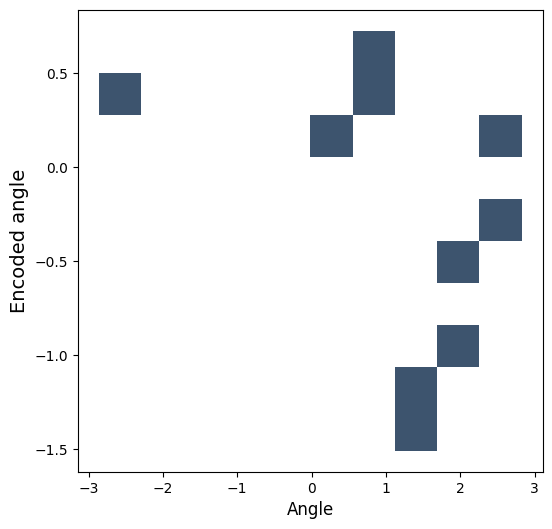

In [26]:
plt.figure(figsize=(6, 6))
plt.xlabel("Angle", fontsize=12)
plt.ylabel("Encoded angle", fontsize=14)
ax = sns.histplot(x=angles[0:10], y=corrected[0:10], bins=10 )  # pthresh=.1

# Adiciona uma linha perfeita entre x e y
# Supondo uma relação linear, você pode usar np.polyfit para isso
#coefficients = np.polyfit(angles, z_mean[:, 0], 1) # Ajusta uma linha (polinômio de grau 1)
#polynomial = np.poly1d(coefficients)
#ys = polynomial(angles)

# Plota a linha no gráfico
#plt.plot(angles, ys, color='red')


# Adiciona a segunda linha que conecta pontos onde x é igual a y
# Determina o menor e o maior valor entre os dados de x e y para o intervalo da linha
min_val = min(min(angles), min(z_mean[:, 0]))
max_val = max(max(angles), max(z_mean[:, 0]))

# Cria uma sequência de pontos para a linha
line_points = np.linspace(min_val, max_val, 100)

# Plota a linha no gráfico
#plt.plot(line_points, line_points, color='blue', linestyle='--')

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


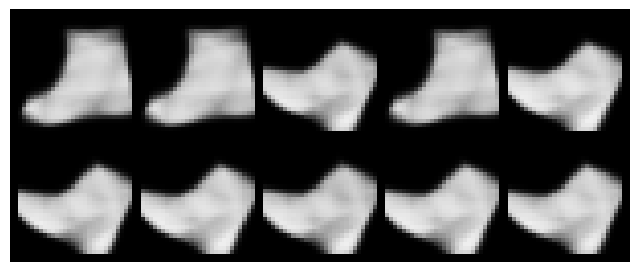

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


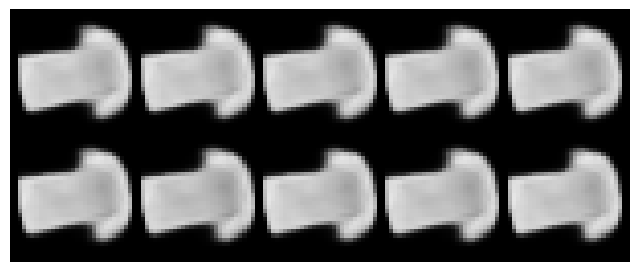

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


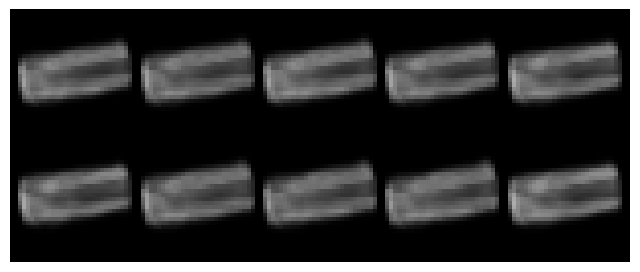

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


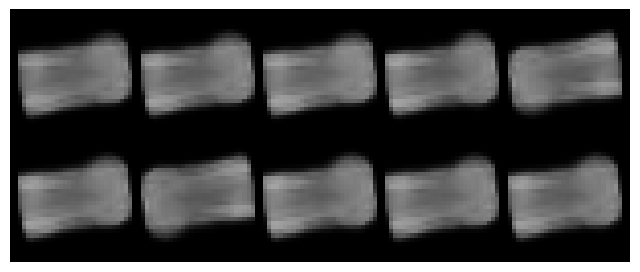

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


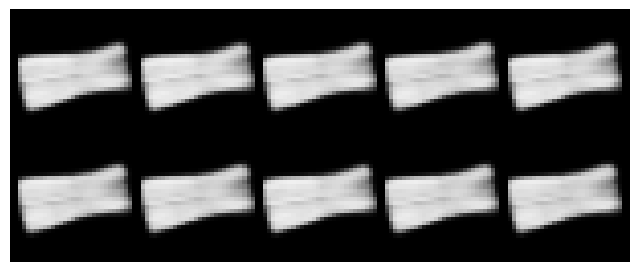

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


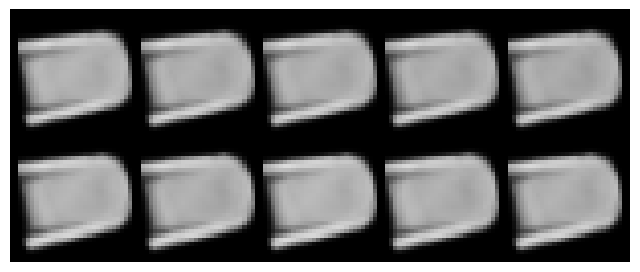

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


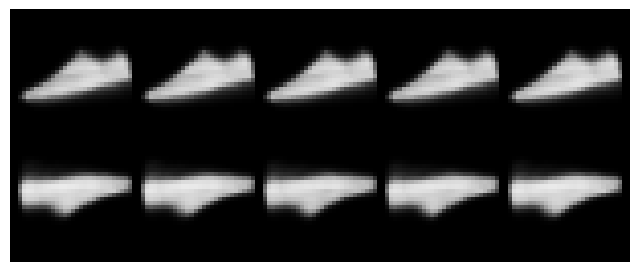

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


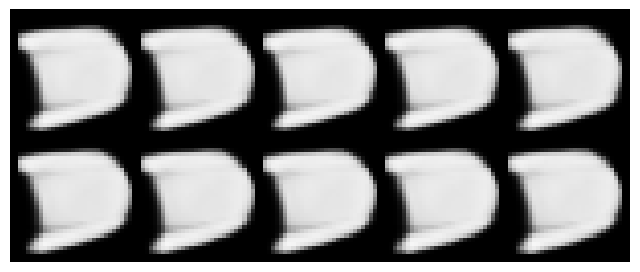

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


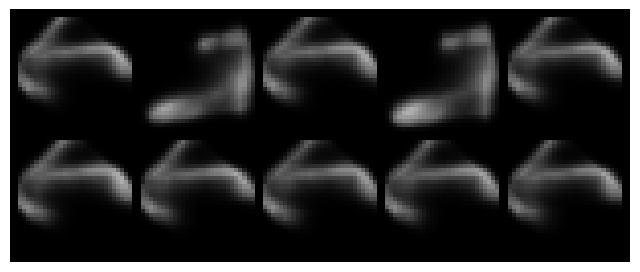

tensor([ 0.2519,  0.2212,  0.2124,  ..., -1.9408, -1.9511, -1.9302])
numero de classes: 0


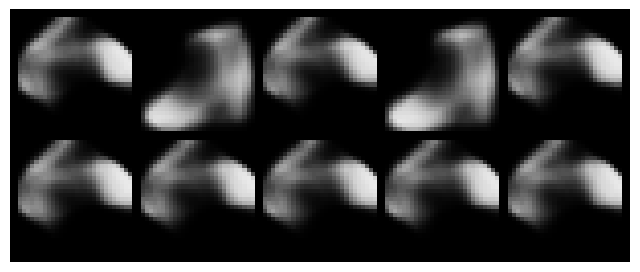

In [27]:
for i in range(0, 10):
  z_mean, z_sd = rvae.encode(train_data)
  rvae.random_samples_from_latent(z_mean, z_sd, 10, train_labels, target_label=i, cmap='gray')

tensor([[ 0.0989, -2.3161, -1.3129,  0.2519],
        [ 0.4153, -2.4189, -1.3211,  0.2212],
        [ 0.7262, -2.3831, -1.3287,  0.2124],
        [-1.5090,  1.0506,  2.4340, -0.3881],
        [-1.1714,  1.0898,  2.2738, -0.3531],
        [-0.8748,  1.1504,  2.3254, -0.3670],
        [-0.5271,  1.1848,  2.3465, -0.3304],
        [-0.2190,  1.1063,  2.4283, -0.3494],
        [ 0.0931,  1.0961,  2.3836, -0.3918],
        [ 0.4191,  1.0170,  2.2945, -0.3495]])
inv
inv
inv
inv
inv
inv
inv


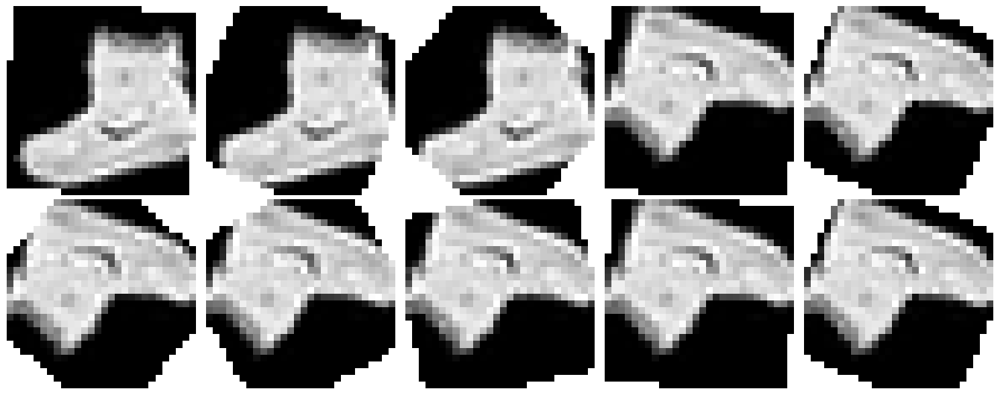

In [28]:
the_label = 0
import matplotlib.pyplot as plt
import torch
from PIL import Image
import numpy as np
# Suponha que 'originals' é o seu tensor de imagens e 'primeiros_valores' é o tensor de ângulos em radianos
n_imagens, altura, largura = train_data.shape[:3]
indices = np.where(train_labels == the_label)[0]
filtered_images = train_data[indices]
z_mean, z_sd = rvae.encode(filtered_images)
z_inv = z_mean[:, -1]
print(z_mean)

# Criar uma figura com subplots (2 linhas, 5 colunas)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()
# Plotar as primeiras 10 imagens com rotação
for index, the_mean in enumerate(filtered_images):
    ax = axes[index]
    imagem = filtered_images[index]
    # Converter a imagem normalizada para a escala de 0 a 255
    imagem = (imagem * 255).byte().numpy()

    # Converter de numpy array para imagem PIL
    pil_imagem = Image.fromarray(imagem)

    # Converter ângulo de radianos para graus e rotacionar
    angulo_graus = np.degrees(corrected[index].item())
    #z_inv
    pil_imagem_rotacionada = pil_imagem.rotate(angulo_graus*-1, fillcolor="white", resample=Image.BICUBIC)
    if z_inv[index] < 0:
      print("inv")
      #pil_imagem_rotacionada = pil_imagem_rotacionada.rotate(180, fillcolor="white", resample=Image.BICUBIC)
    # Plotar a imagem rotacionada
    ax.imshow(pil_imagem_rotacionada, cmap='gray')
    ax.axis('off')

plt.tight_layout()
plt.show()

# **He we apply the same images from training (original in several rotations) to the model**

In [29]:
import torch
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

z_mean, z_sd = rvae.encode(train_data[0:5000])

# Aplicar K-means clustering
#kmeans = KMeans(n_clusters=500, max_iter = 100)  # Escolha o número de clusters que você espera encontrar
#cluster_labels = kmeans.fit_predict(z_mean[:,1:])


import numpy as np
from sklearn.metrics import pairwise_distances

# Supondo que `z_mean[:,1:]` seja o seu conjunto de dados
data = z_mean[:,1:]

# Calcula a matriz de distâncias
distance_matrix = pairwise_distances(data, metric='euclidean')

# Inicializa os rótulos dos clusters
cluster_labels = -np.ones(len(data))

# Contador para o número do cluster atual
current_cluster = 0

for i in range(len(data)):
    if cluster_labels[i] == -1:  # Se o ponto ainda não foi atribuído a um cluster
        # Encontra os 9 pontos mais próximos (excluindo o próprio ponto)
        distances = distance_matrix[i]
        closest_points_idx = np.argsort(distances)[1:10]  # Começa de 1 para excluir o próprio ponto

        # Atribui o ponto atual e seus vizinhos mais próximos ao cluster atual
        cluster_labels[i] = current_cluster
        cluster_labels[closest_points_idx] = current_cluster

        # Atualiza o número do cluster para o próximo
        current_cluster += 1

# Certifique-se de que atribuímos todos os pontos a um cluster
assert not np.any(cluster_labels == -1)

# `cluster_labels` agora contém o número do cluster para cada ponto


print(cluster_labels)


# Aplicar DBSCAN clustering
#dbscan = DBSCAN(eps=0.2, min_samples=2)  # Escolha os hiperparâmetros apropriados
#cluster_labels = dbscan.fit_predict(z_mean[:, 1:])


import plotly.express as px
fig = px.scatter_3d(x=z_mean[:, 1], y=z_mean[:, 2], z=z_mean[:, 3], color=train_labels[0:5000], opacity=0.7, size_max=1)
fig.update_traces(marker=dict(size=3))

fig.update_layout(scene=dict(aspectmode="cube"))
fig.update_layout(scene=dict(xaxis_title="$z_1$", yaxis_title="$z_2$", zaxis_title="$z_3$"))
fig.show()

[  0. 406. 406. ... 725. 725. 725.]


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27,

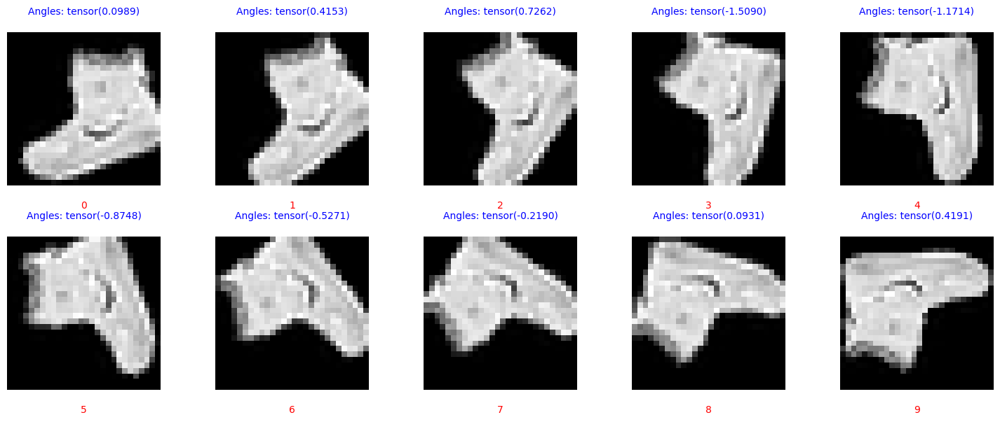

Cluster Label: 1
[10 11 12 13 14 15 16 17 18 19]


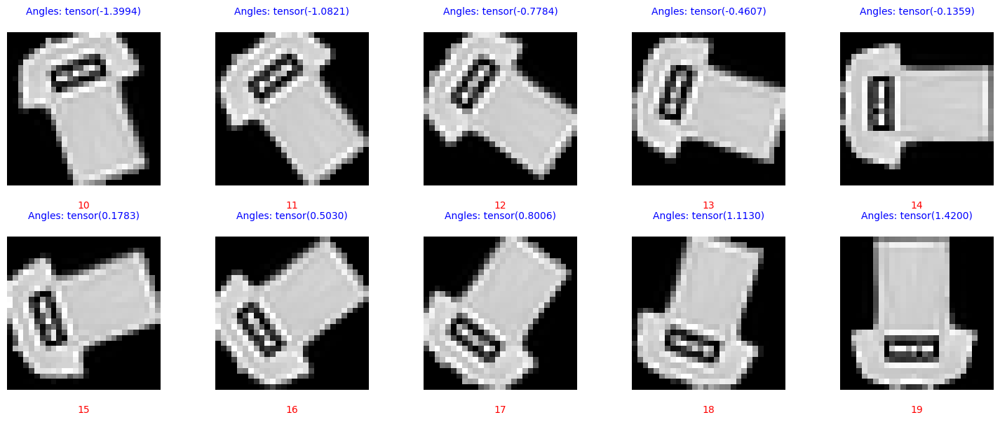

Cluster Label: 2
[20 21 22 23 24 25 26 27 28 29]


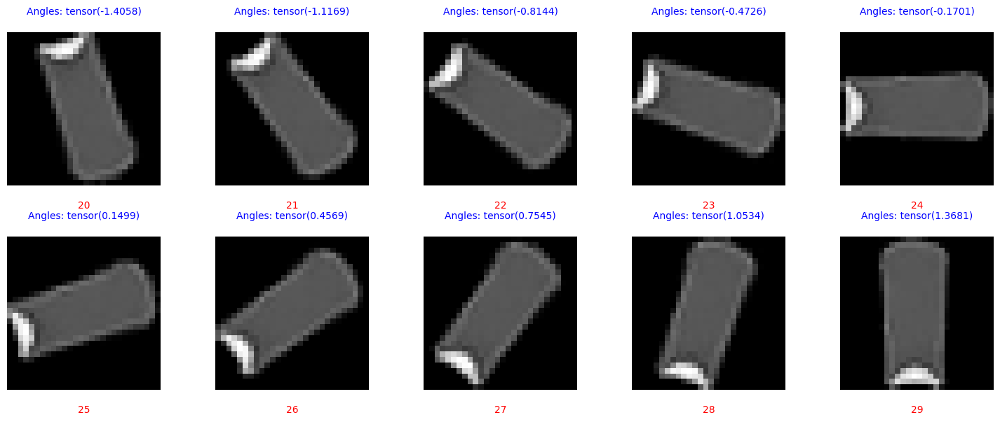

Cluster Label: 3
[30 31 32 33 34 35 36 37 38 39]


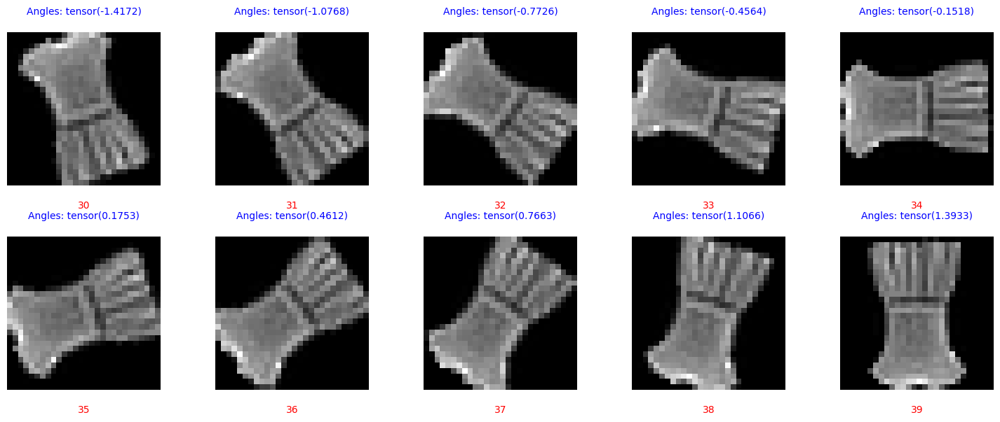

Cluster Label: 4
[40 41 42 43 44 45 46 47 48 49]


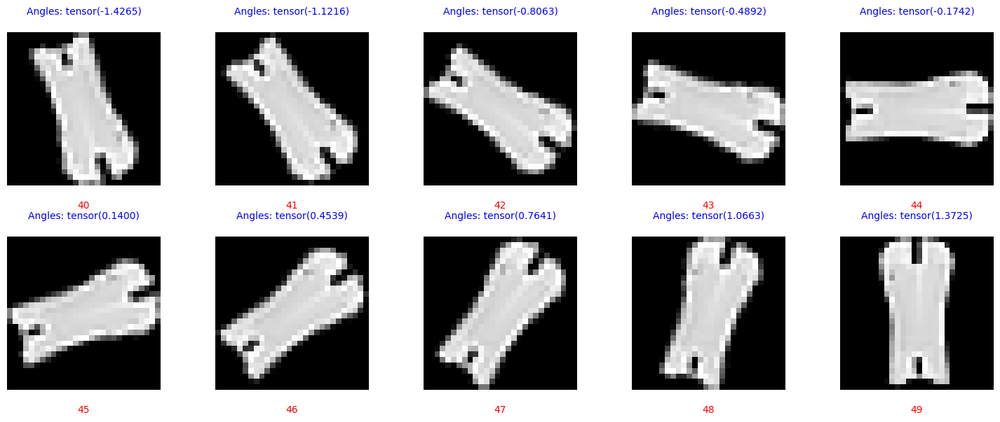

Cluster Label: 5
[50 51 52 53 54 55 56 57 58 59]


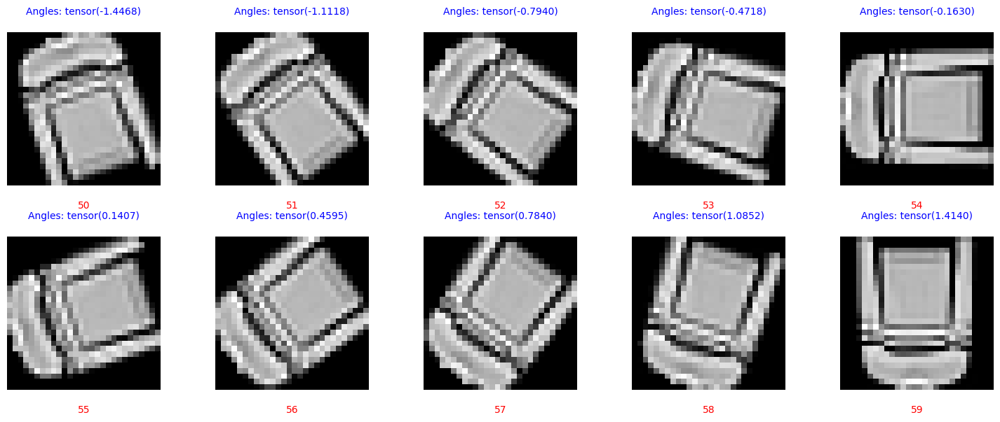

Cluster Label: 6
[60 61 62 63 64 65 66 67 68 69]


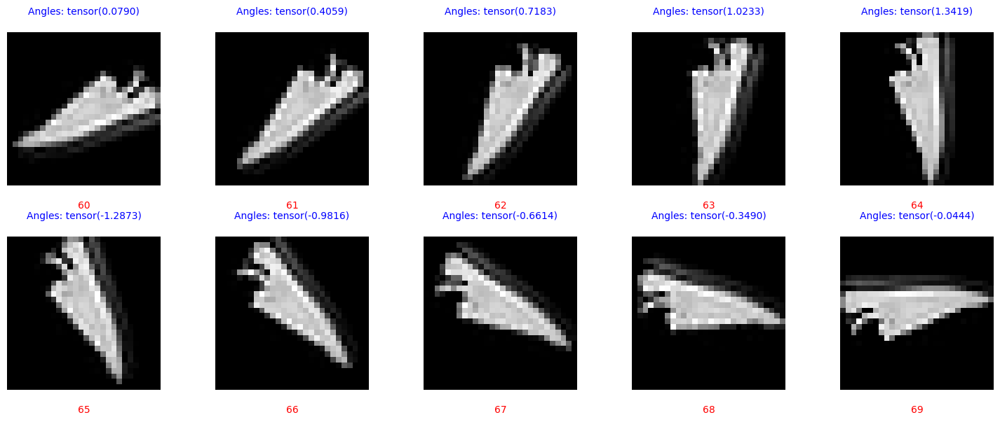

Cluster Label: 7
[70 71 72 73 74 75 76 77 78 79]


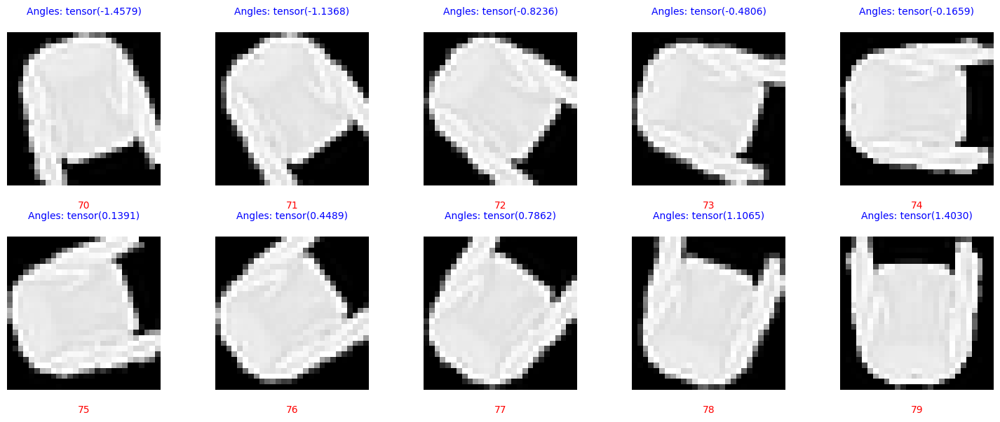

Cluster Label: 8
[80 81 82 83 84 85 86 87 88 89]


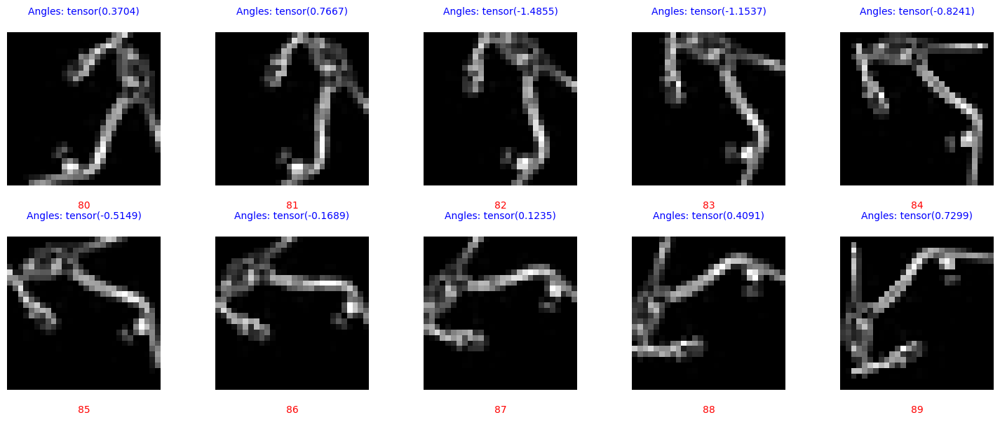

Cluster Label: 9
[90 91 92 93 94 95 96 97 98 99]


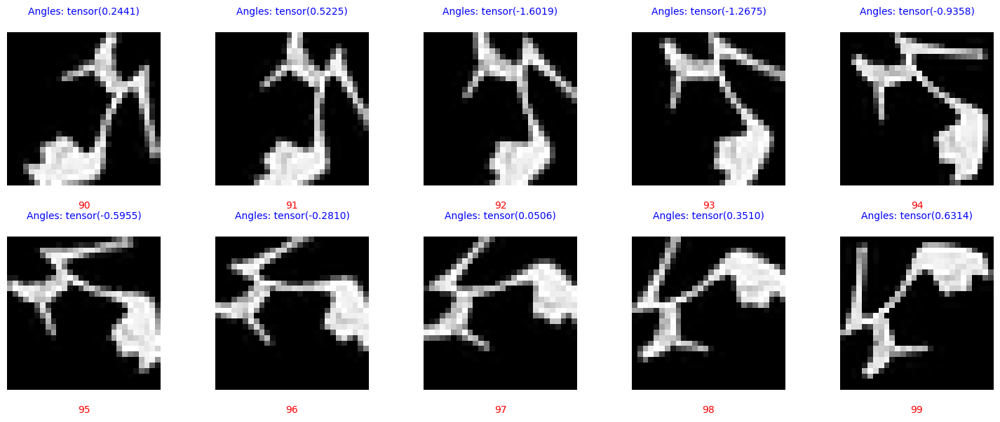

Cluster Label: 10
[100 101 102 103 104 105 106 107 108 109]


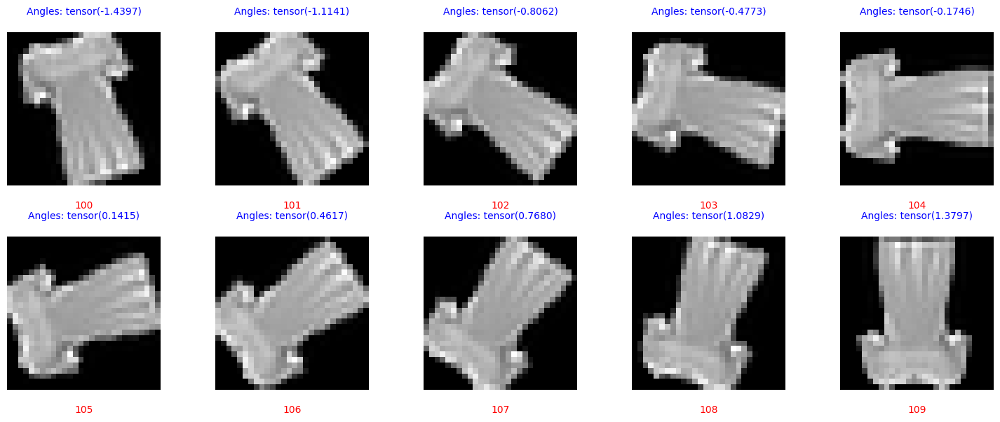

Cluster Label: 11
[110 111 112 113 114 115 116 117 118 119]


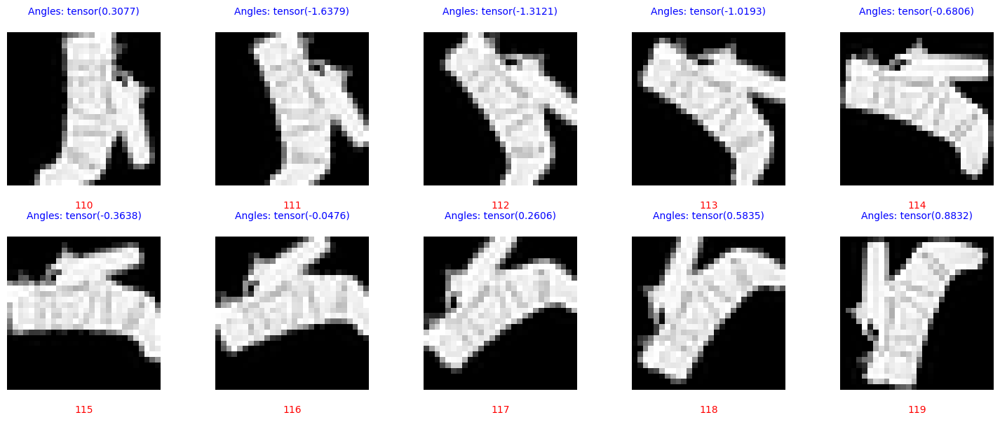

Cluster Label: 12
[120 121 122 123 124 125 126 127 128 129]


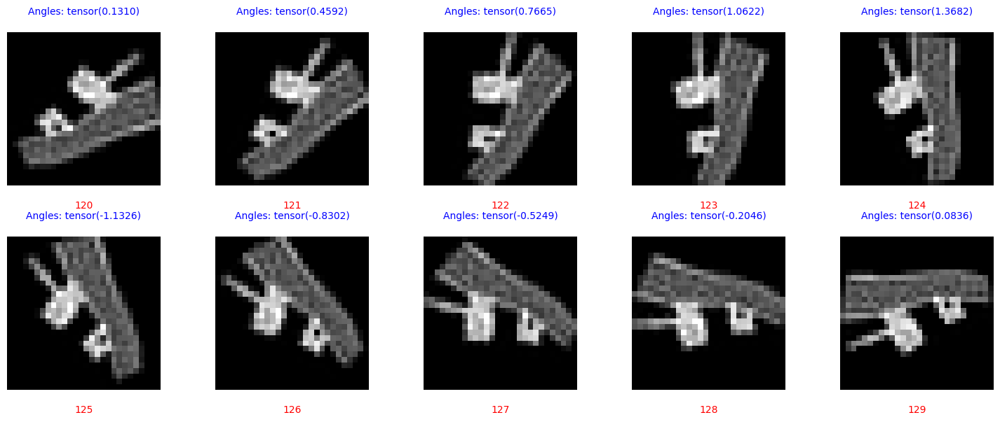

Cluster Label: 13
[130 131 132 133 134 135 136 137 138 139]


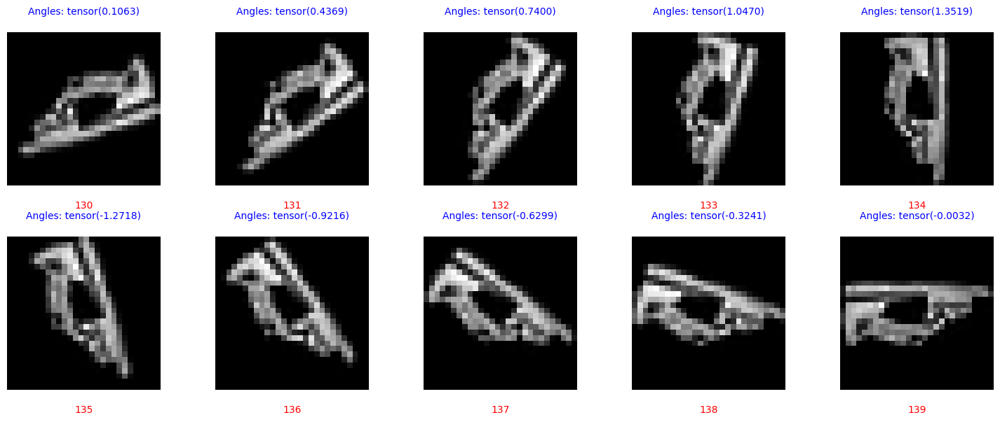

Cluster Label: 14
[140 141 142 143 144 145 146 147 148 149]


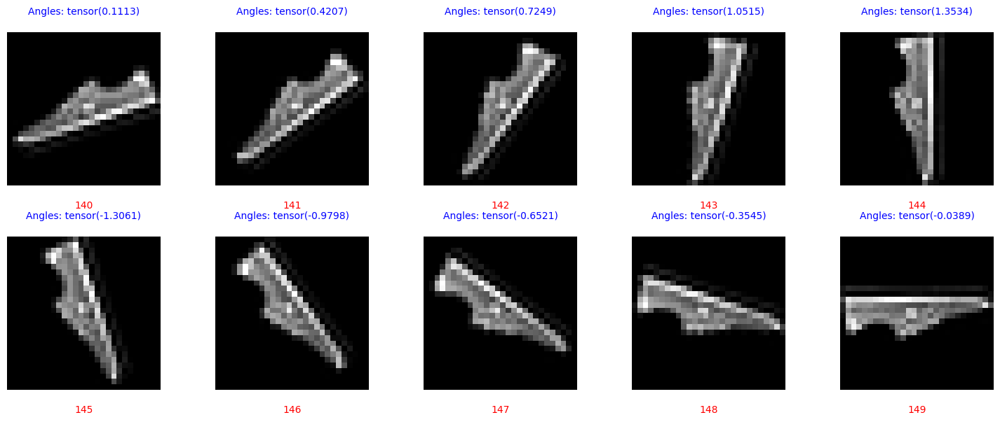

Cluster Label: 15
[150 151 152 153 154 155 156 157 158 159]


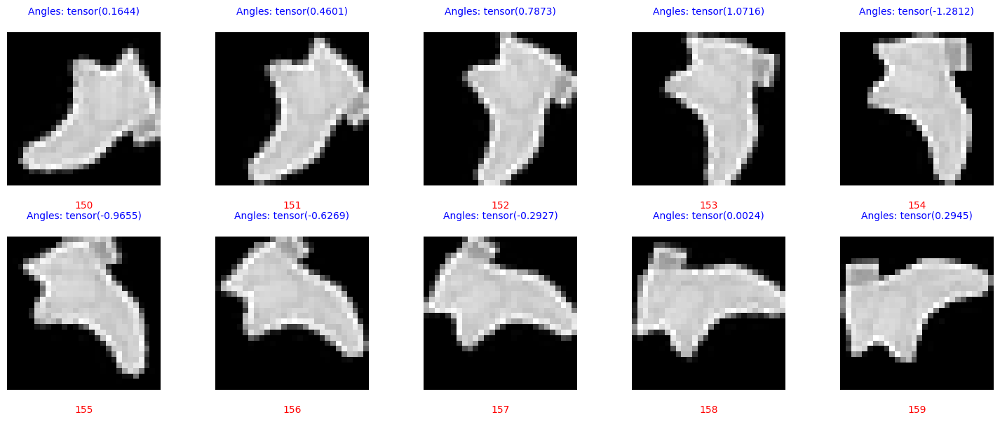

Cluster Label: 16
[160 161 162 163 164 165 166 167 168 169]


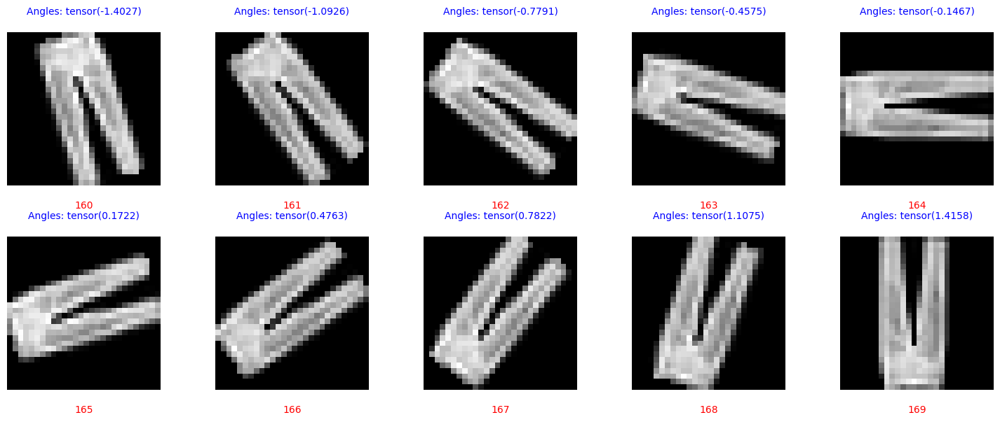

Cluster Label: 17
[170 171 172 173 174 175 176 177 178 179]


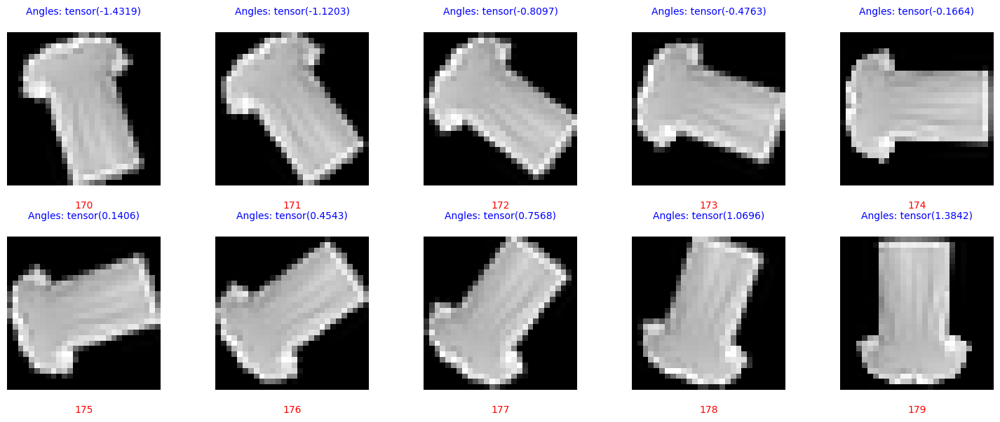

Cluster Label: 18
[180 181 182 183 184 185 186 187 188 189]


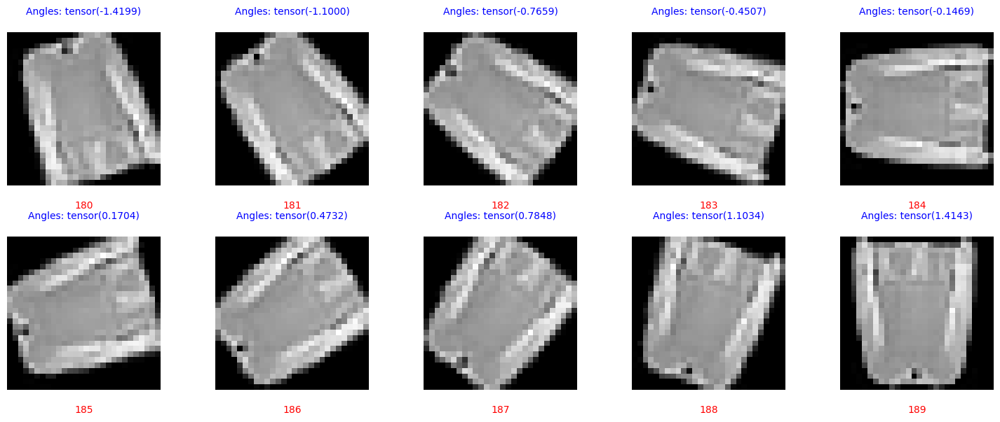

Cluster Label: 19
[190 191 192 193 194 195 196 197 198 199]


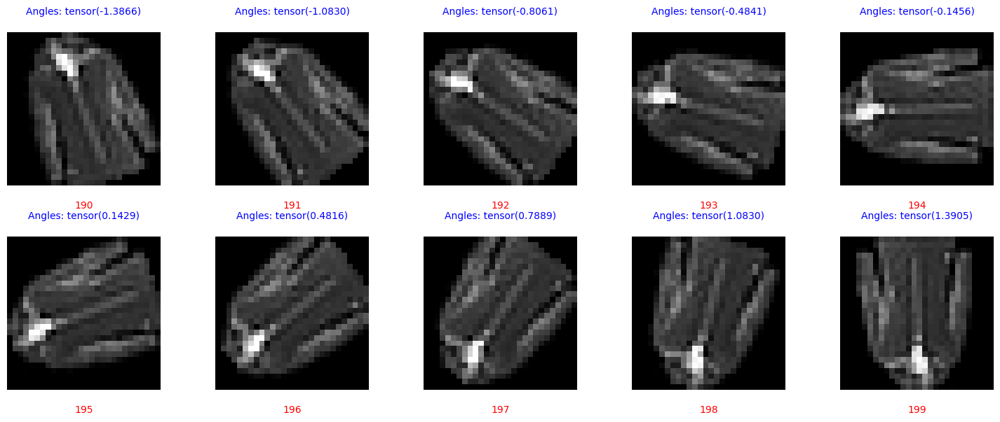

Cluster Label: 20
[200 201 202 203 204 205 206 207 208 209]


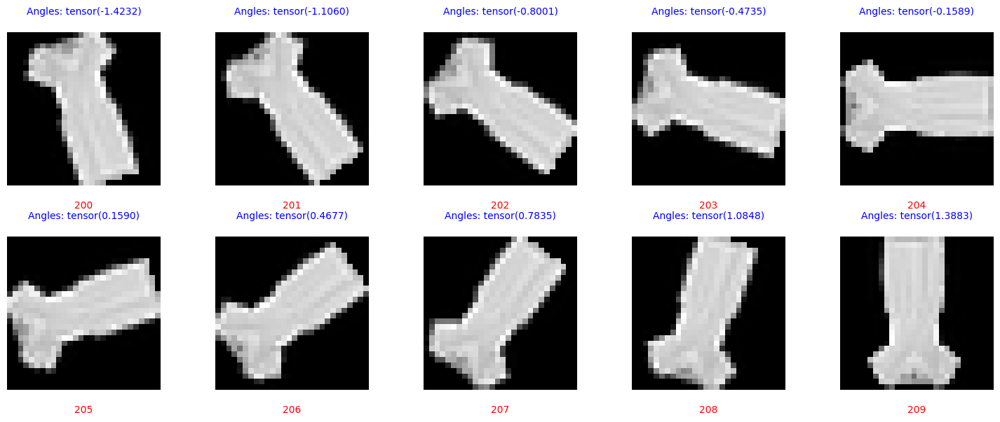

Cluster Label: 21
[210 211 212 213 214 215 216 217 218 219]


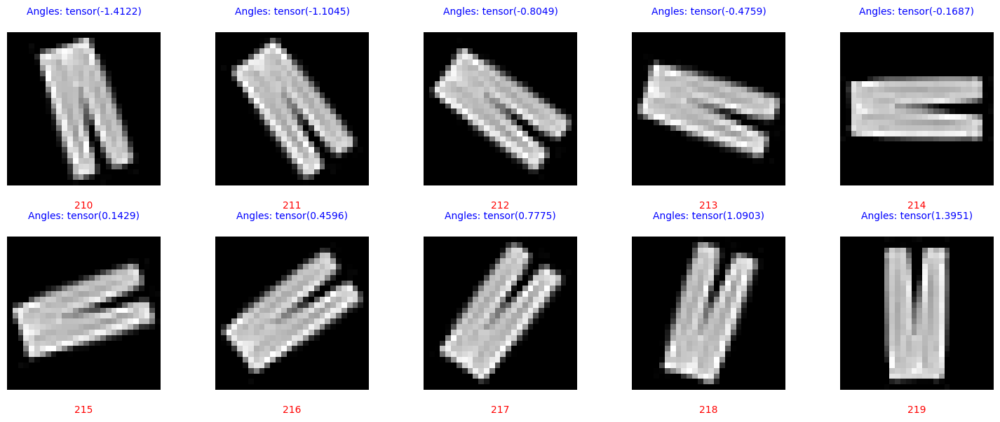

Cluster Label: 22
[220 221 222 223 224 225 226 227 228 229]


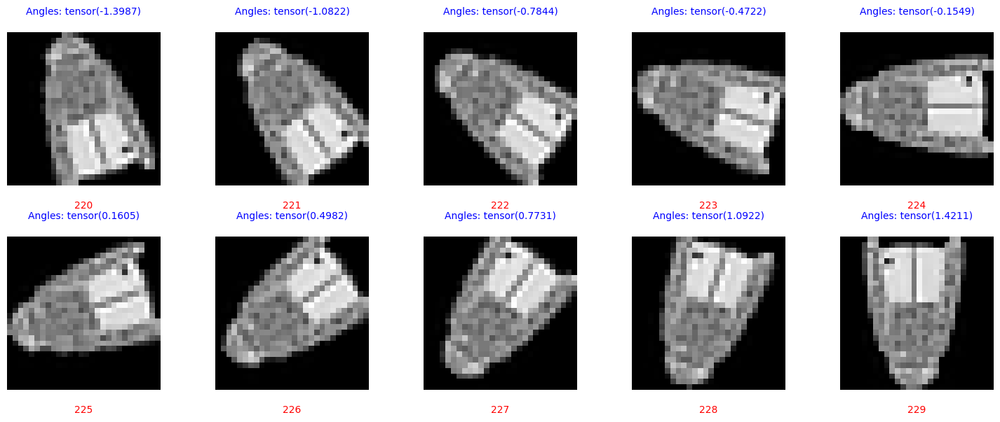

Cluster Label: 23
[230 231 232 233 234 235 236 237 238 239]


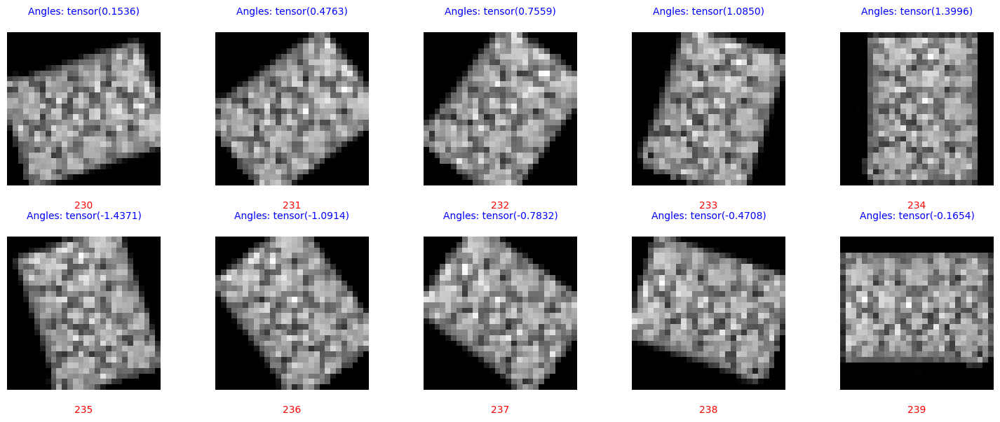

Cluster Label: 24
[240 241 242 243 244 245 246 247 248 249]


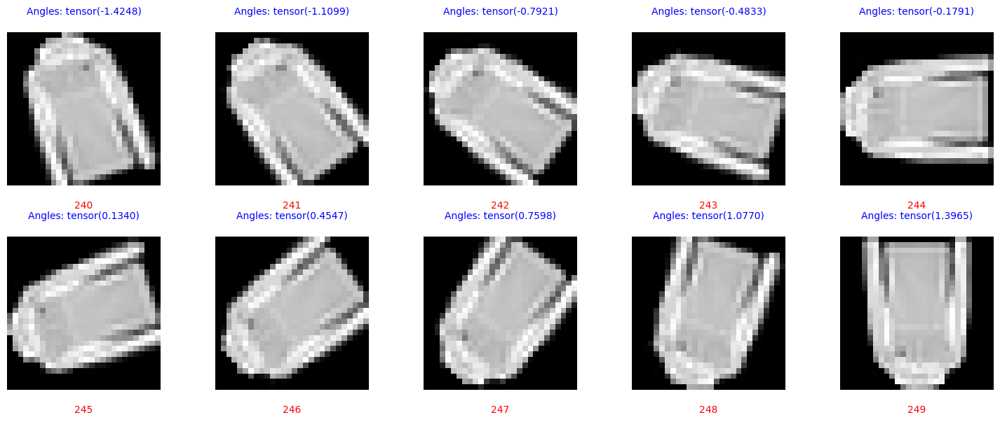

Cluster Label: 25
[250 251 252 253 254 255 256 257 258 259]


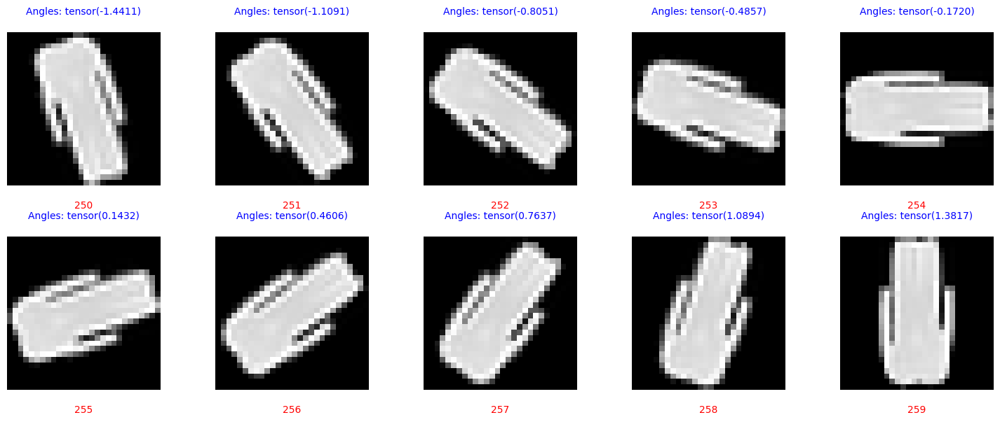

Cluster Label: 26
[260 261 262 263 264 265 266 267 268 269]


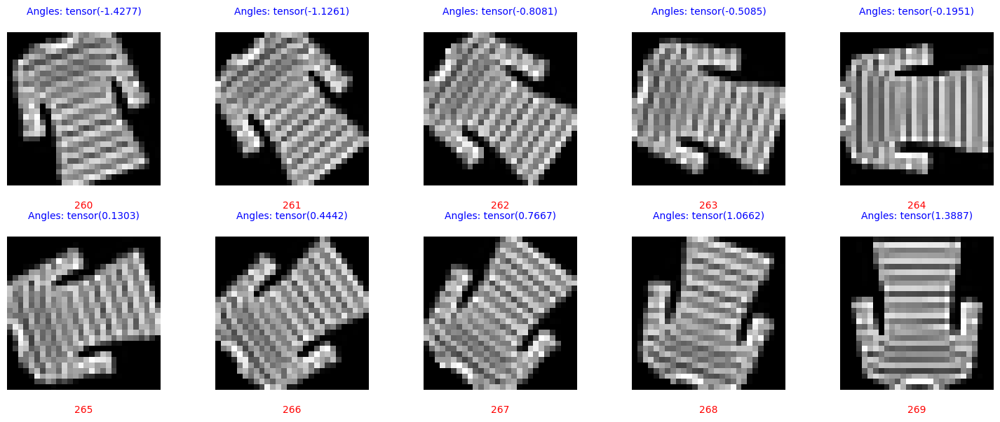

Cluster Label: 27
[270 271 272 273 274 275 276 277 278 279]


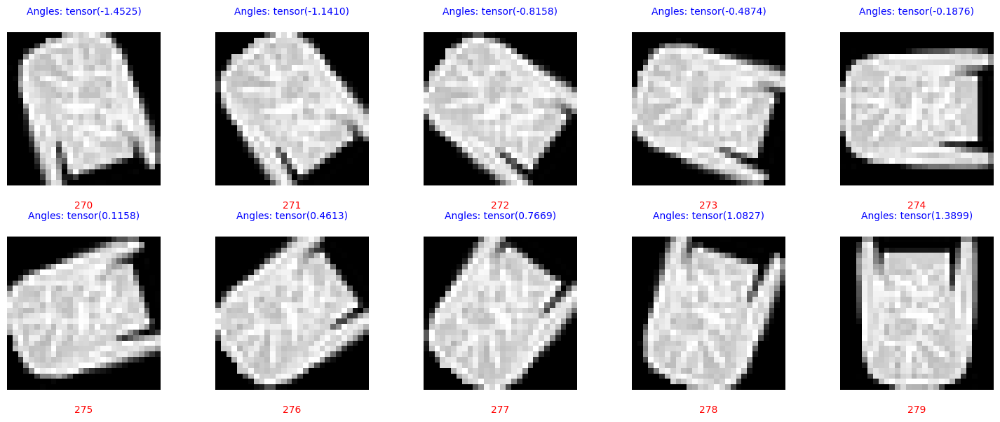

Cluster Label: 28
[280 281 282 283 284 285 286 287 288 289]


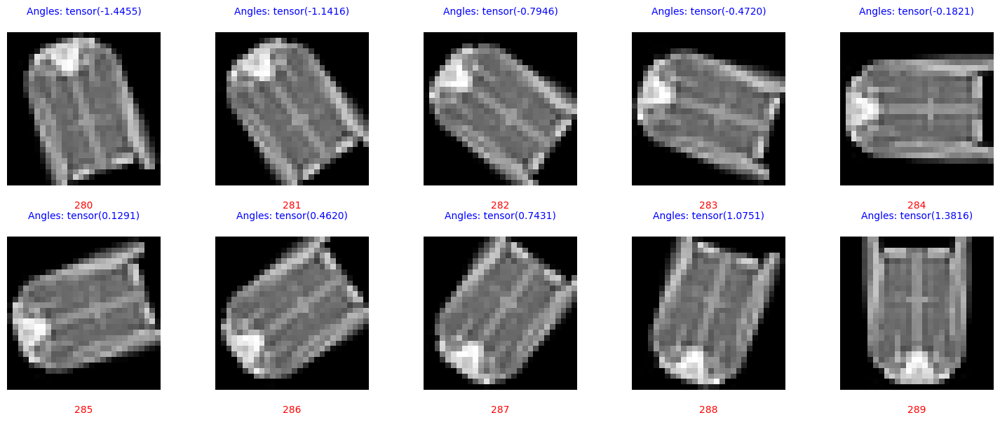

Cluster Label: 29
[290 291 292 293 294 295 296 297 298 299]


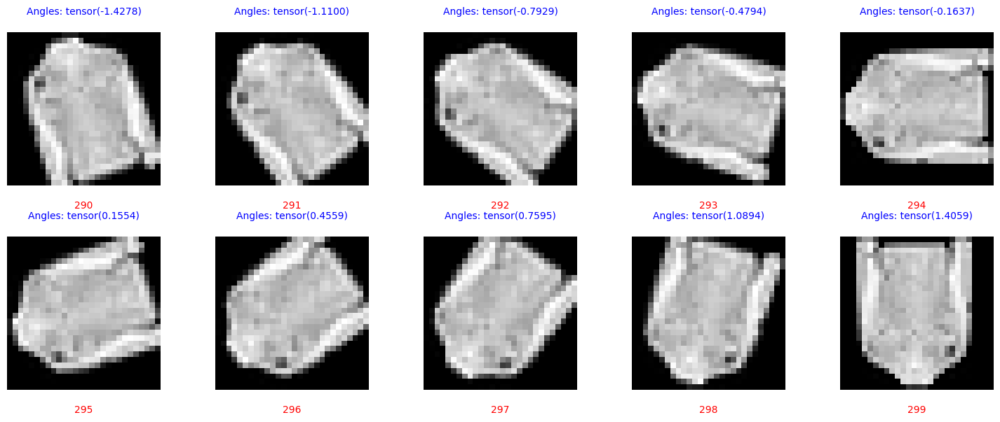

Cluster Label: 30
[300 301 302 303 304 305 306 307 308 309]


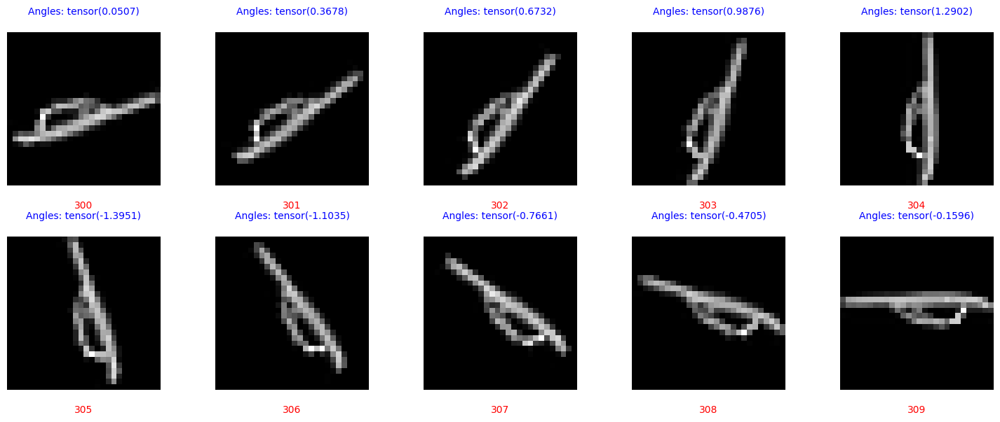

Cluster Label: 31
[310 311 312 313 314 315 316 317 318 319]


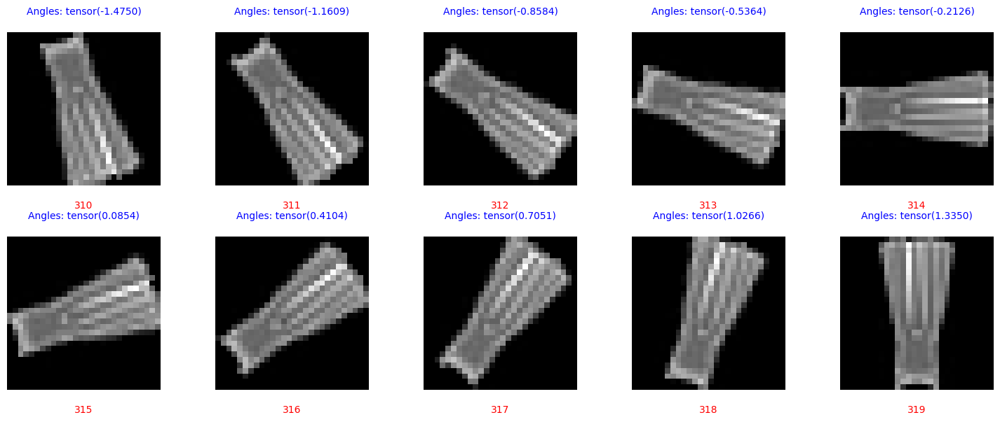

Cluster Label: 32
[320 321 322 323 324 325 326 327 328 329]


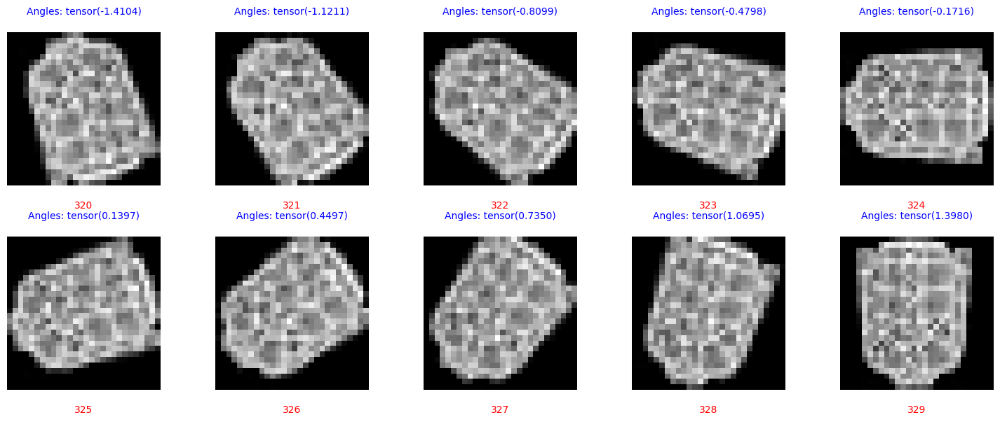

Cluster Label: 33
[330 331 332 333 334 335 336 337 338 339]


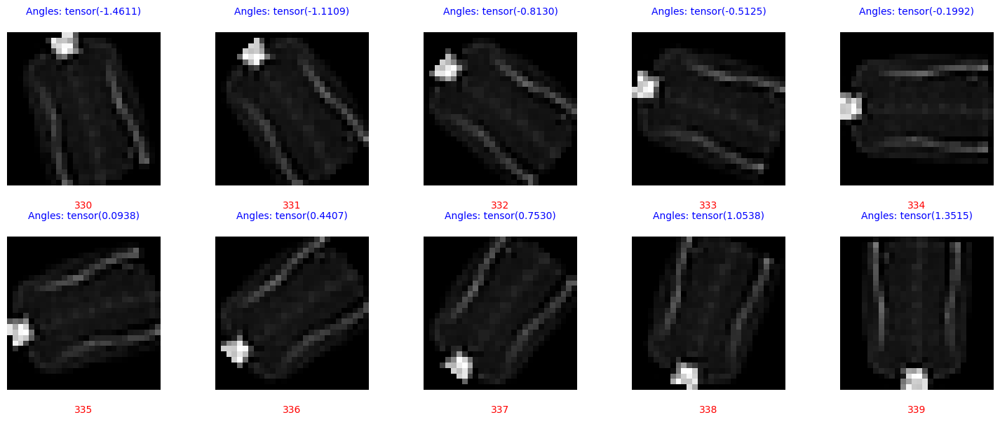

Cluster Label: 34
[340 341 342 343 344 345 346 347 348 349]


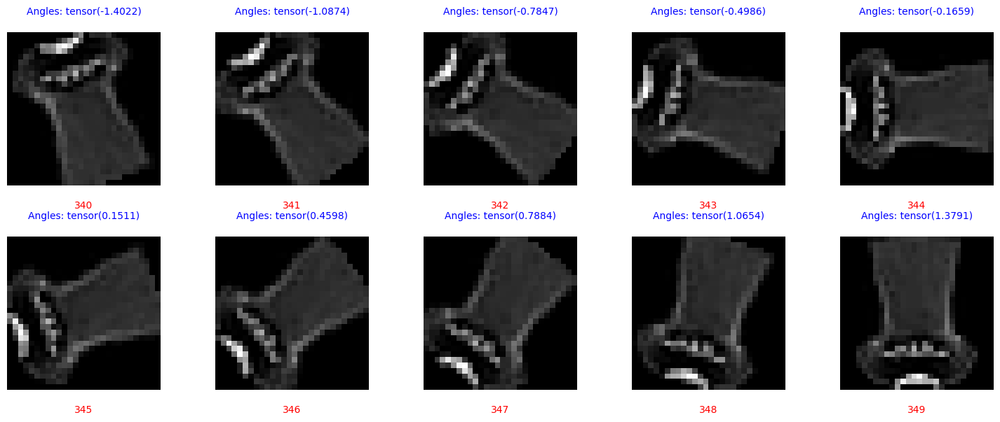

Cluster Label: 35
[350 351 352 353 354 355 356 357 358 359]


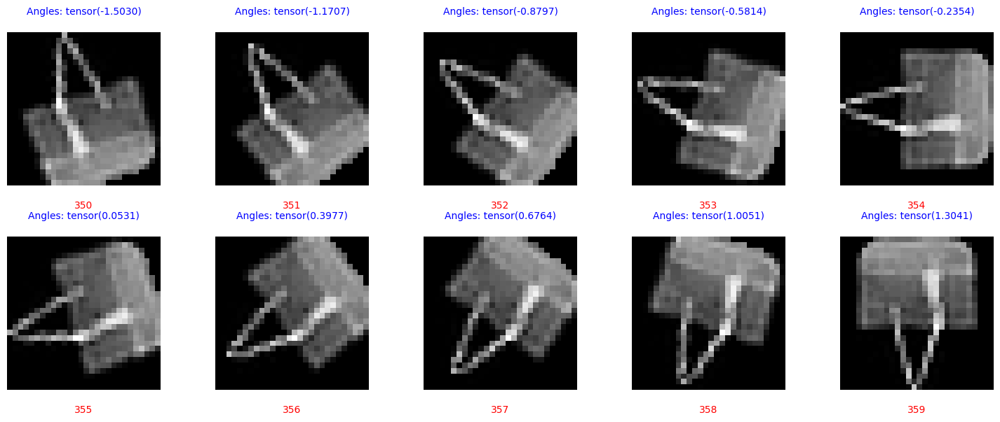

Cluster Label: 36
[360 361 362 363 364 365 366 367 368 369]


KeyboardInterrupt: 

In [31]:
import matplotlib.pyplot as plt
import math
from scipy.spatial.distance import euclidean
from scipy.spatial import distance
tensor_images_few = train_data[0:5000]
N, H, W = train_data.shape

# Lista para armazenar os valores de similaridade de cada cluster
similarities_a = []
labels_list = train_labels.tolist()
print(labels_list)
for cluster_label in set(labels_list):
    print(f"Cluster Label: {cluster_label}")

    # Encontrar os índices das imagens que pertencem a esse cluster
    cluster_indices = np.where(train_labels == cluster_label)[0]

    print(cluster_indices)

    # Selecionar as imagens do tensor original usando os índices encontrados
    selected_images = tensor_images_few[cluster_indices]

    # Calcular a representação central do cluster (aqui, usaremos a média)
    central_representation = torch.mean(selected_images, axis=0)


    # Calcular a similaridade (distância euclidiana) de cada imagem em relação à representação central
    cluster_similarities = [distance.euclidean(image.ravel(), central_representation.ravel()) for image in selected_images]

    # Adicionar a lista de similaridades do cluster à lista geral
    similarities_a.extend(cluster_similarities)

    # Definir quantas imagens por linha e calcular o número necessário de linhas
    images_per_row = 5
    num_images = len(selected_images)
    num_rows = math.ceil(num_images / images_per_row)

    # Criar uma figura com subplots
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 3 * num_rows))

    # Achatar a array de eixos para facilitar o mapeamento da imagem para o subplot
    axes_flat = axes.flatten()

    # Loop para plotar cada imagem no subplot correspondente e adicionar o índice
    for idx, (image, ax) in enumerate(zip(selected_images, axes_flat)):
        ax.imshow(image.reshape(H, W), cmap='gray')
        ax.axis('off')
        # Obter o índice real no tensor principal e colocá-lo abaixo da imagem
        real_index = cluster_indices[idx]
        ax.text(0.5, -0.1, str(real_index), transform=ax.transAxes, ha='center', va='top', fontsize=10, color='red')
        # Mostrar a similaridade da imagem em relação à representação central
        ax.text(0.5, 1.1, f'Angles: {str(z_mean[real_index,0])}', transform=ax.transAxes, ha='center', va='bottom', fontsize=10, color='blue')

    # Se houver menos imagens do que espaços de subplot, esconda os subplots extras
    for j in range(idx + 1, len(axes_flat)):
        axes_flat[j].axis('off')


    plt.tight_layout()
    plt.show()

# A lista "similarities" agora contém as similaridades de todas as imagens de todos os clusters
print("Similaridades de todos os clusters:", similarities_a)

## **Here we unrotate the images using the model**

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18, 18, 18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20, 20, 20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 22, 22, 22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24, 24, 24, 24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26, 26, 26, 26, 27, 27, 27, 27, 27,

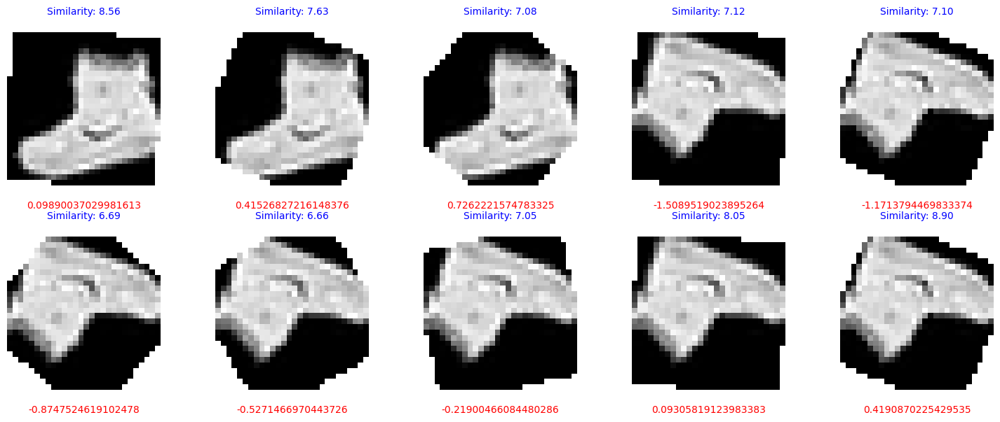

Cluster Label: 1


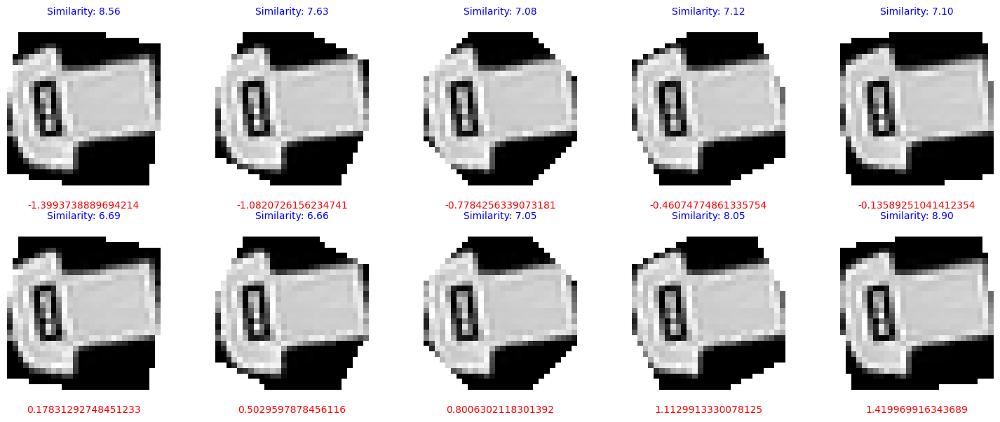

Cluster Label: 2


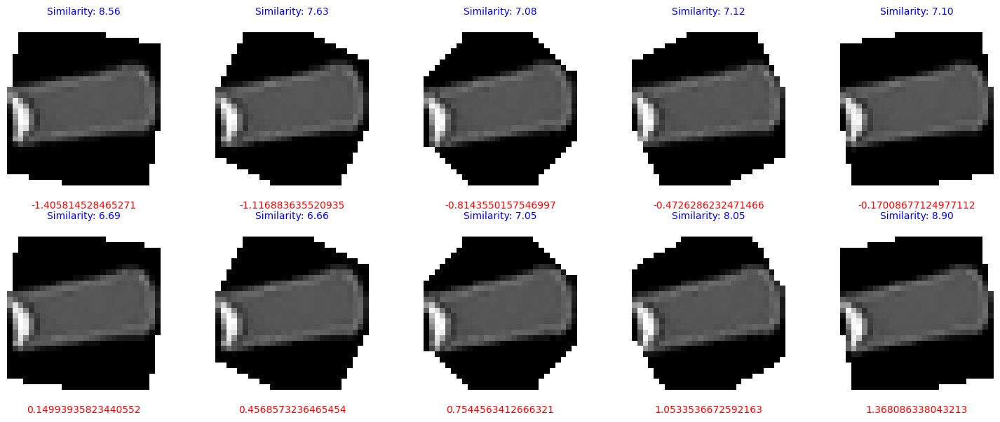

Cluster Label: 3


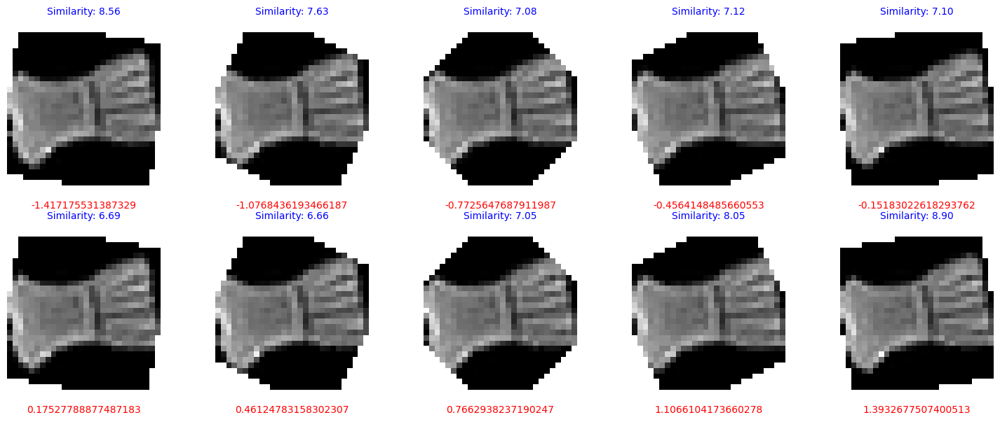

Cluster Label: 4


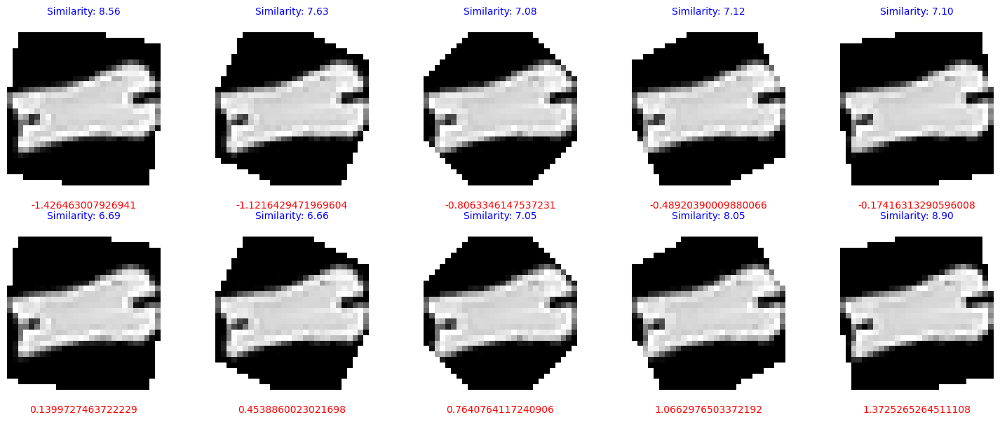

Cluster Label: 5


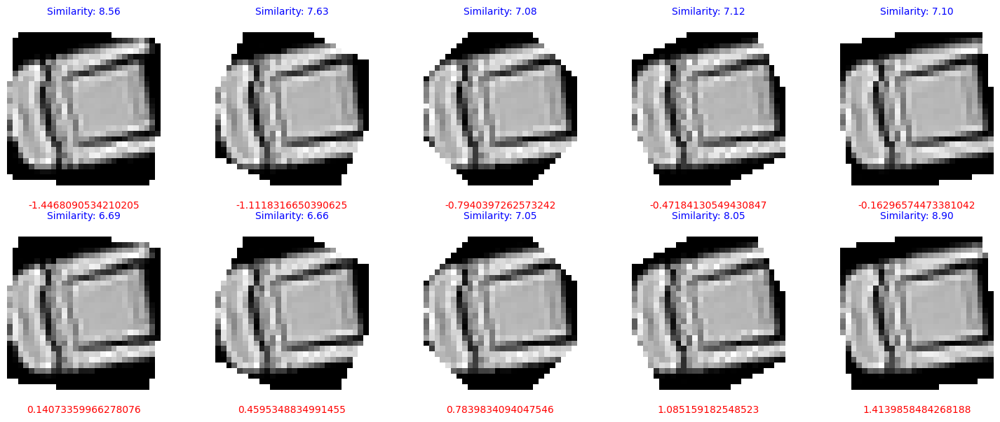

Cluster Label: 6


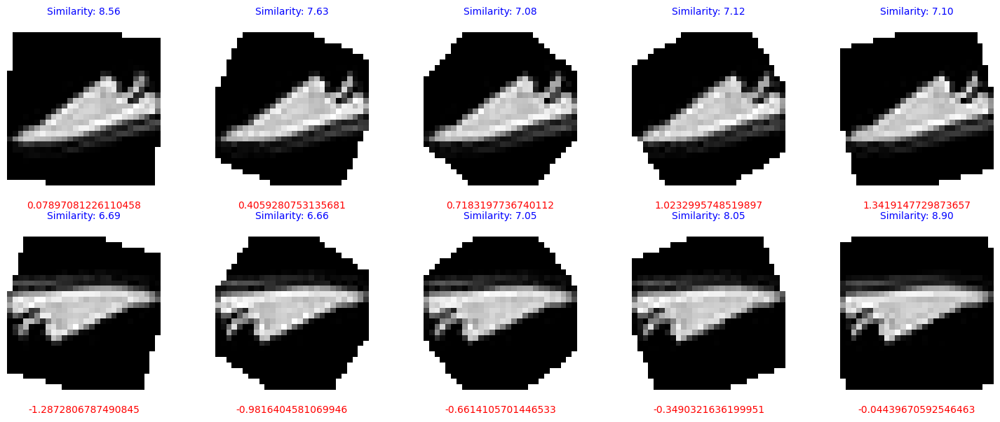

Cluster Label: 7


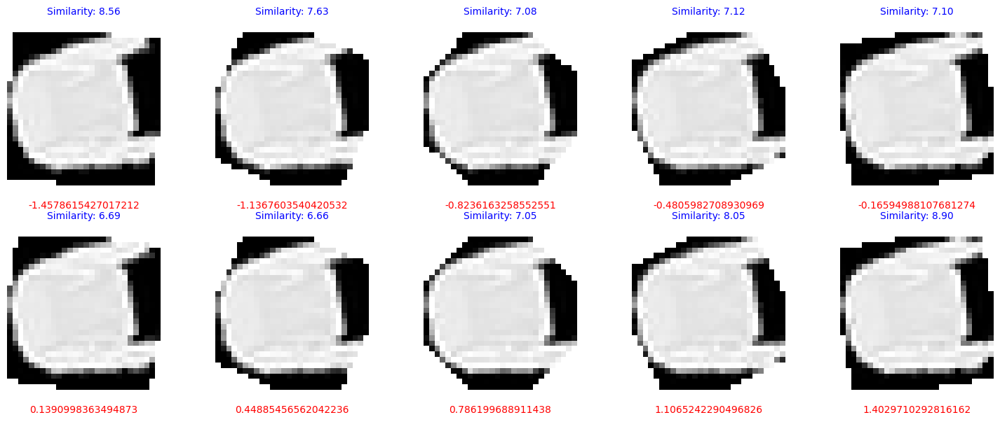

Cluster Label: 8


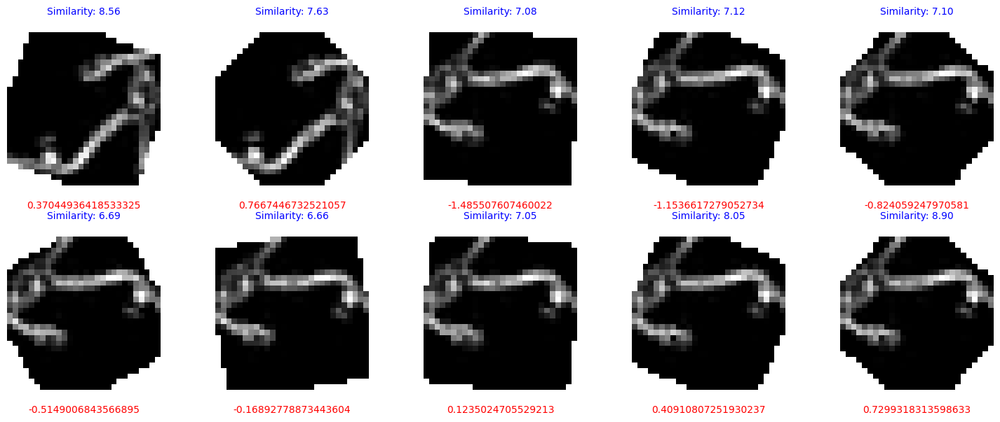

Cluster Label: 9


Exception ignored in: <function _xla_gc_callback at 0x7b75fa2a6050>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 97, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


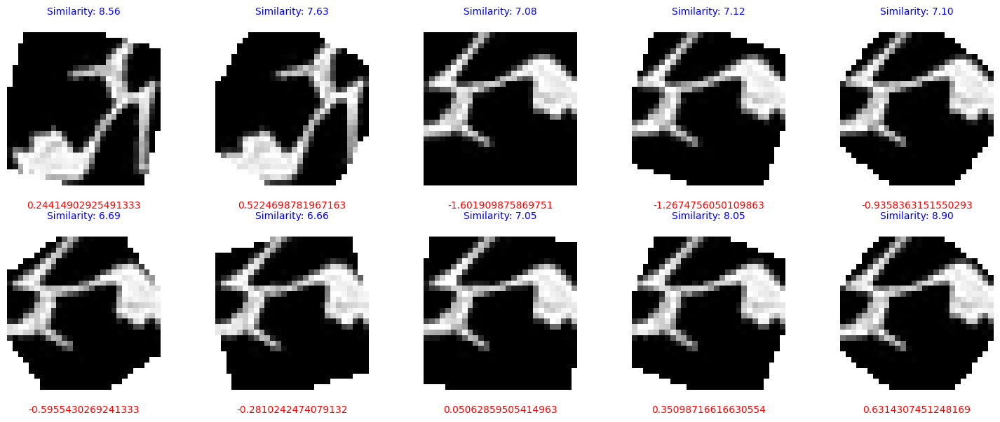

Cluster Label: 10


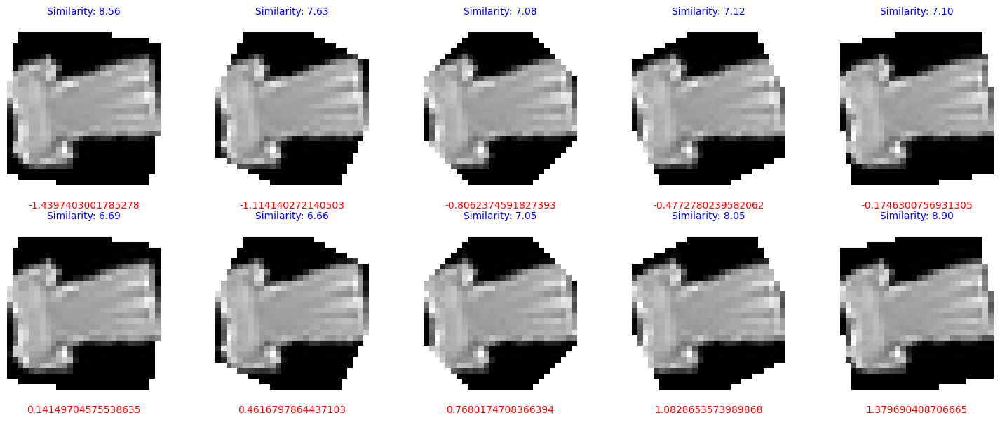

Cluster Label: 11


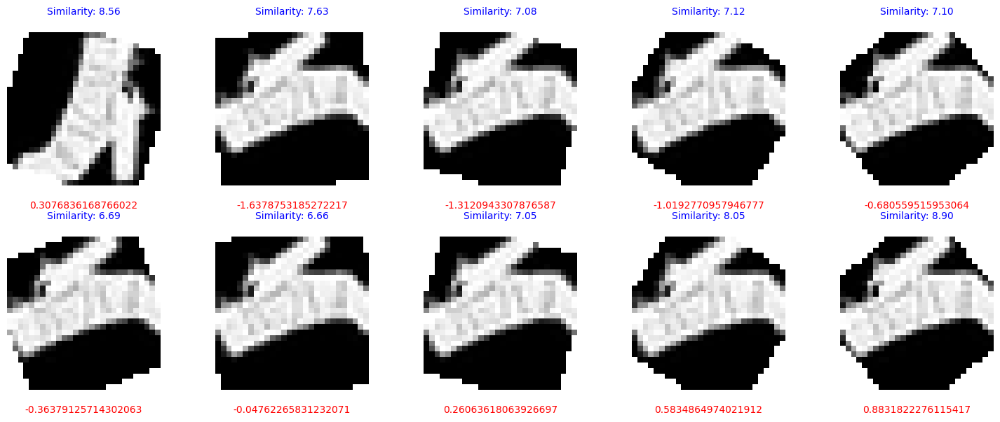

Cluster Label: 12


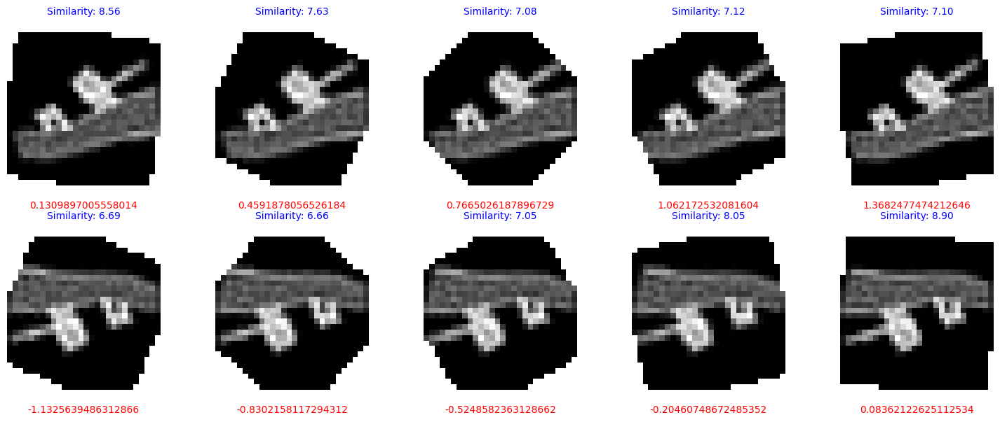

Cluster Label: 13


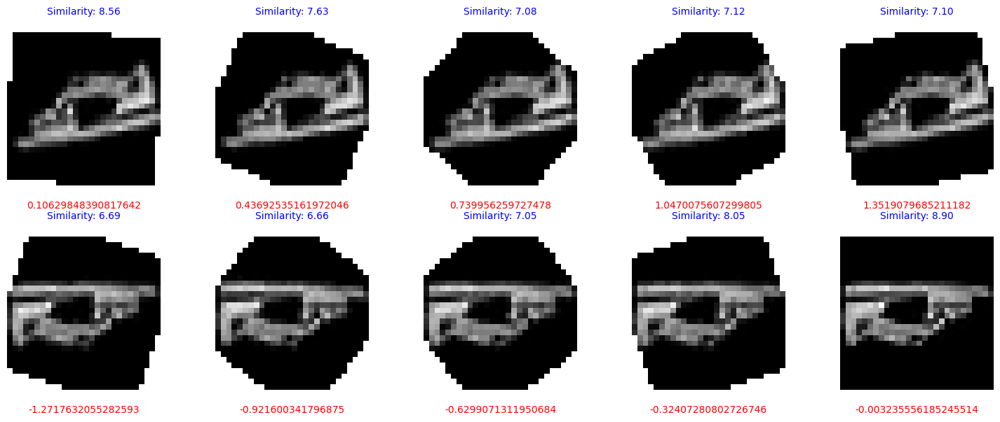

Cluster Label: 14


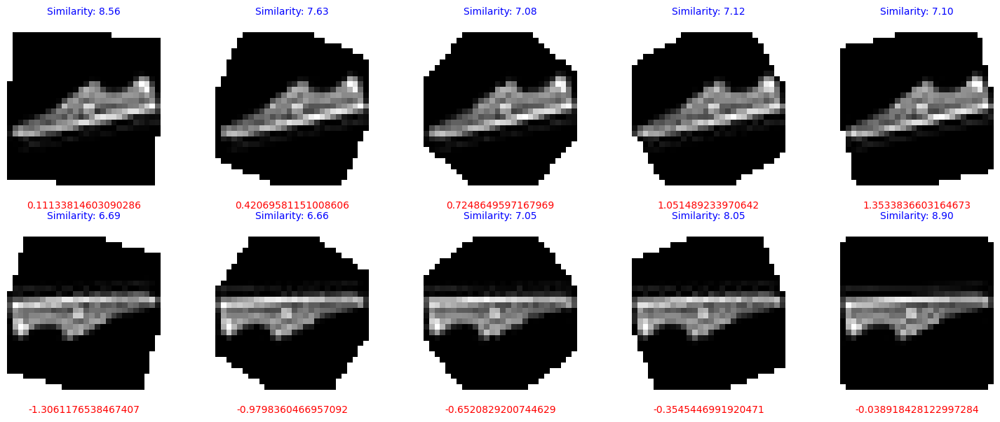

Cluster Label: 15


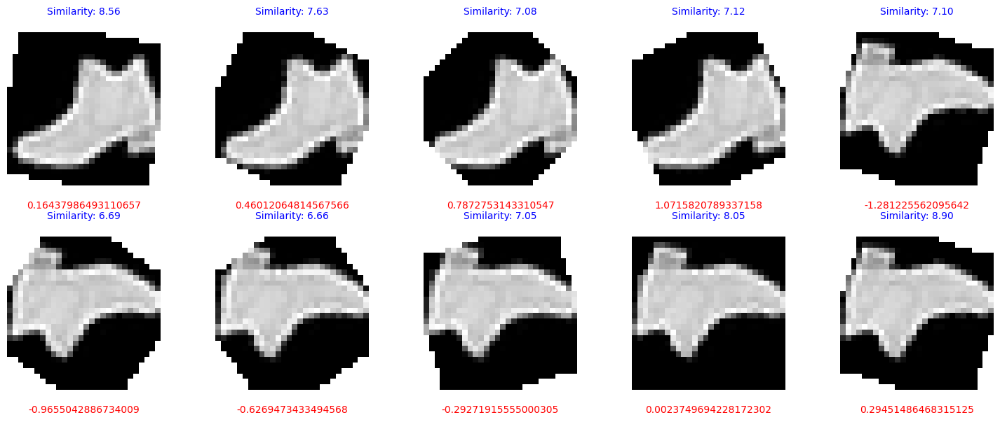

Cluster Label: 16


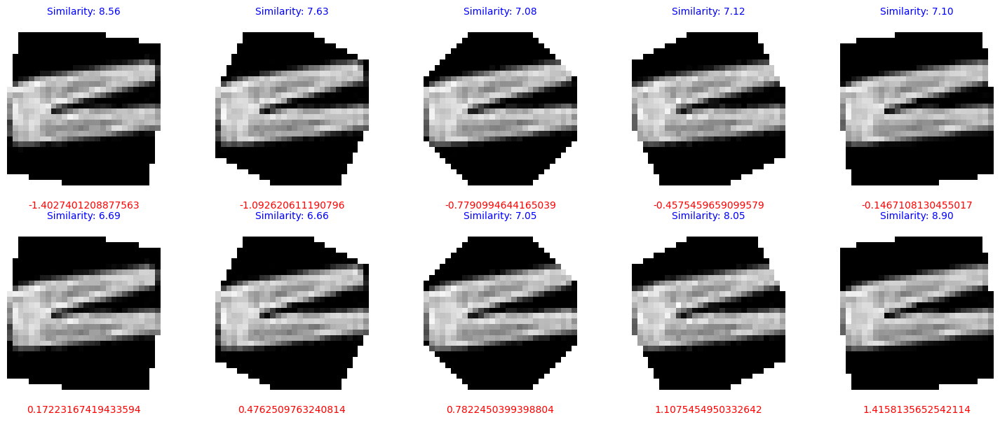

Cluster Label: 17


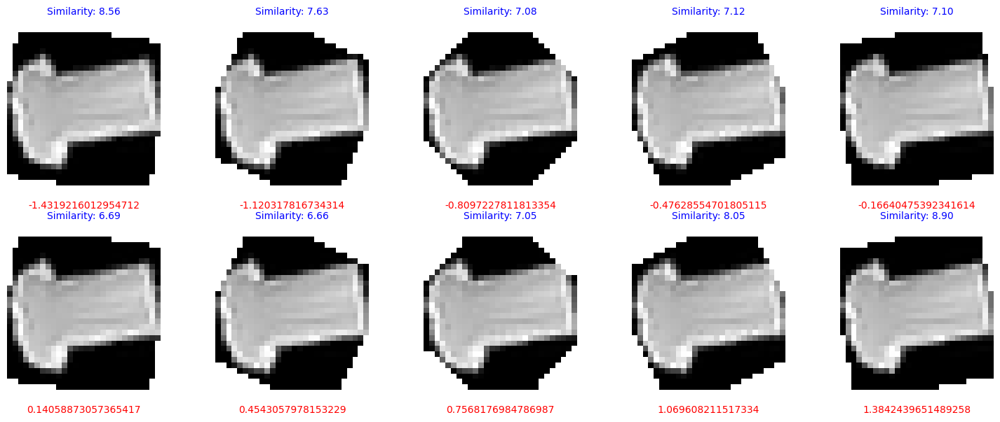

Cluster Label: 18


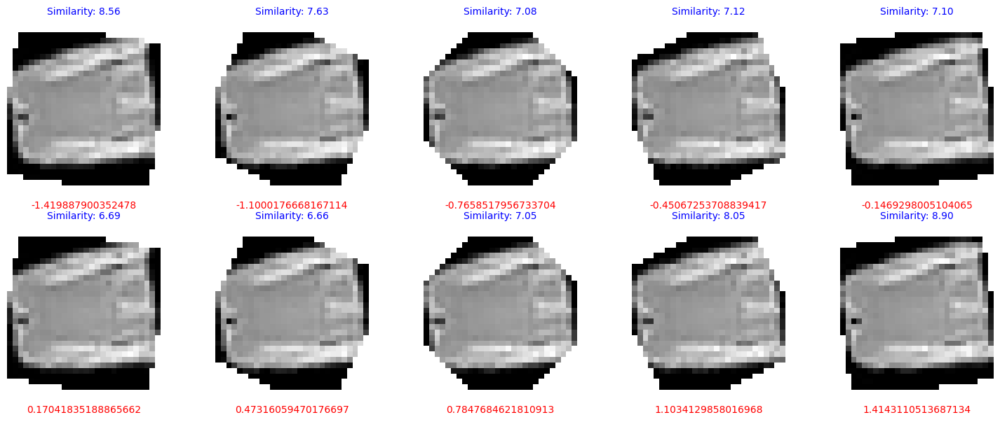

Cluster Label: 19


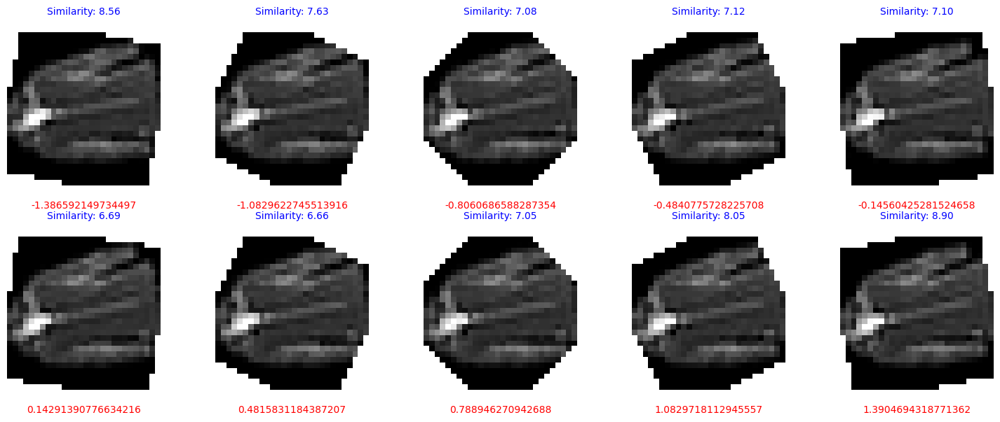

Cluster Label: 20


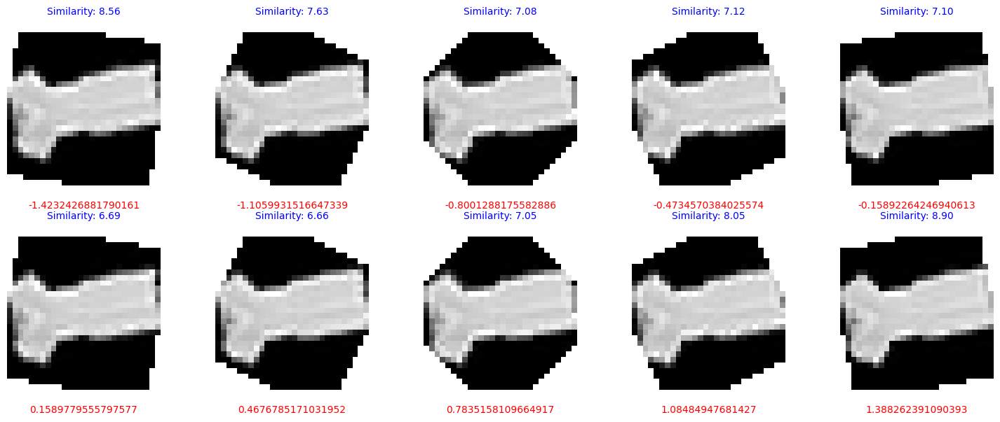

Cluster Label: 21


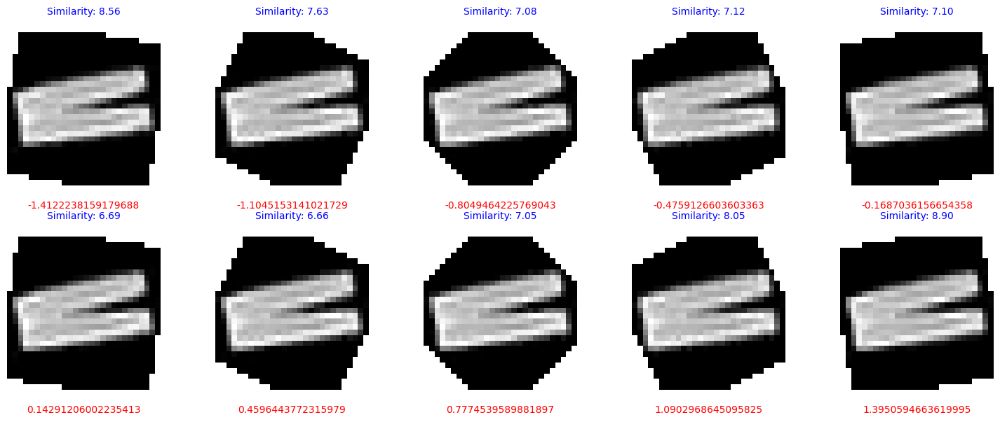

Cluster Label: 22


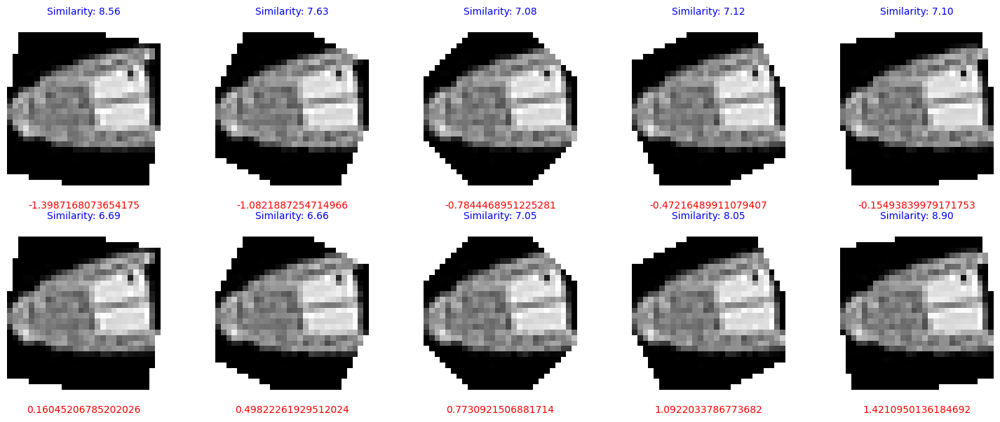

Cluster Label: 23


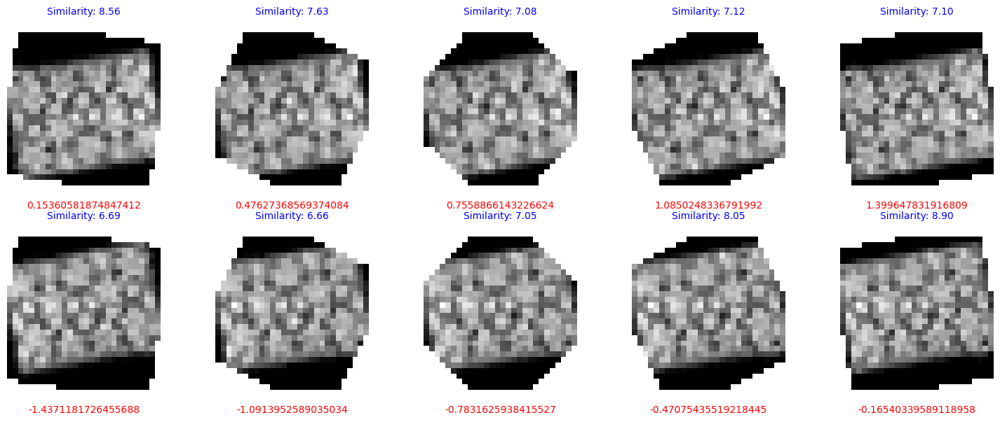

Cluster Label: 24


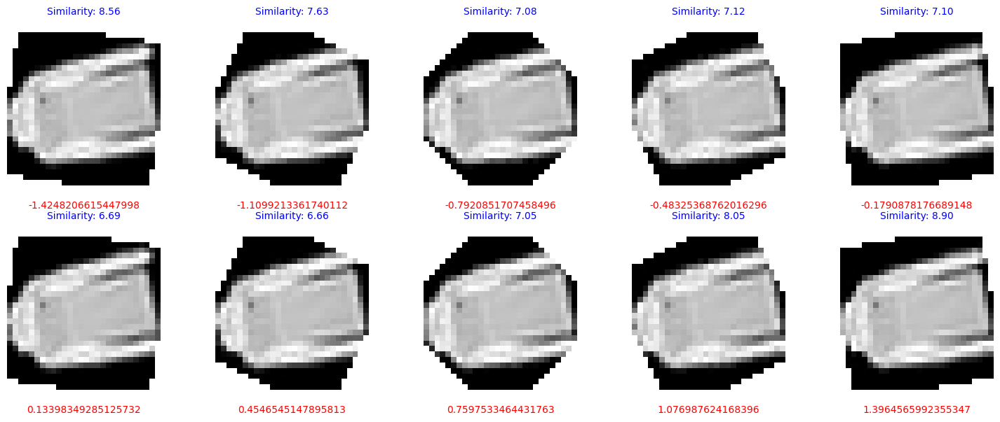

Cluster Label: 25


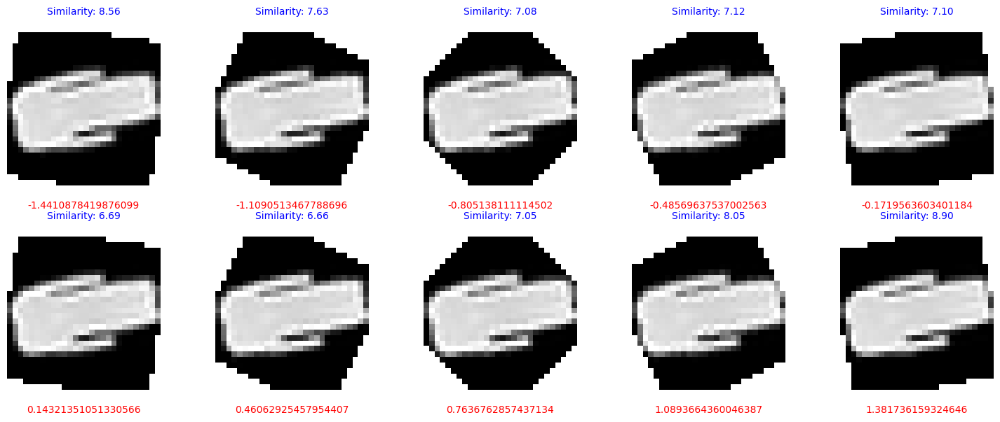

Cluster Label: 26


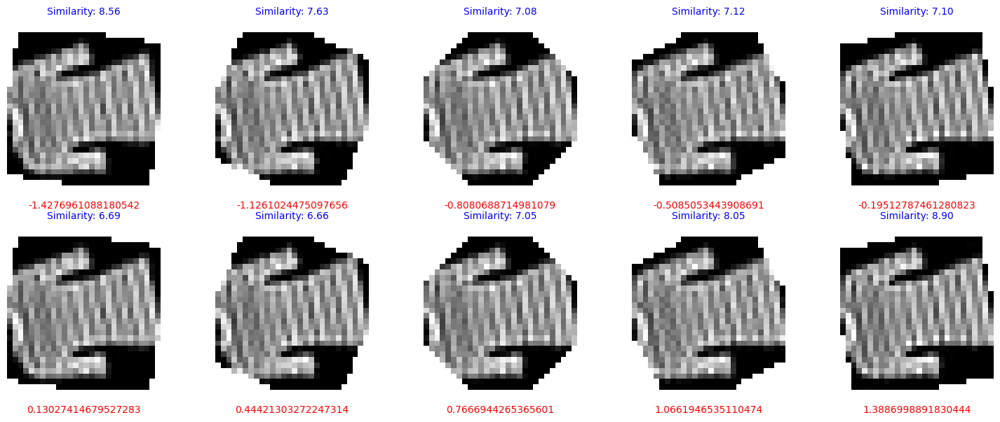

Cluster Label: 27


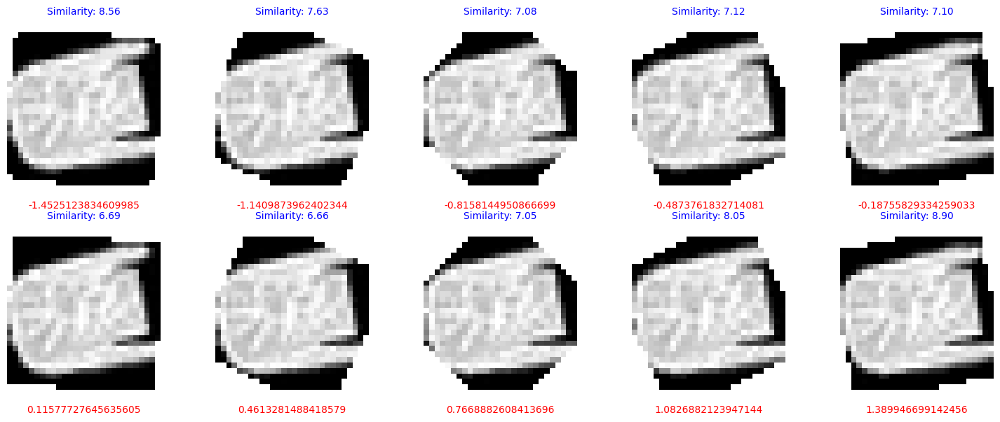

Cluster Label: 28


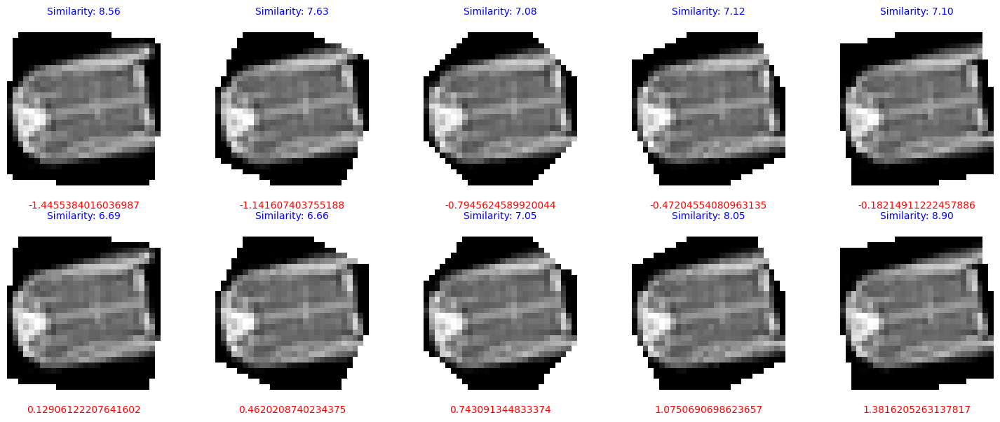

Cluster Label: 29


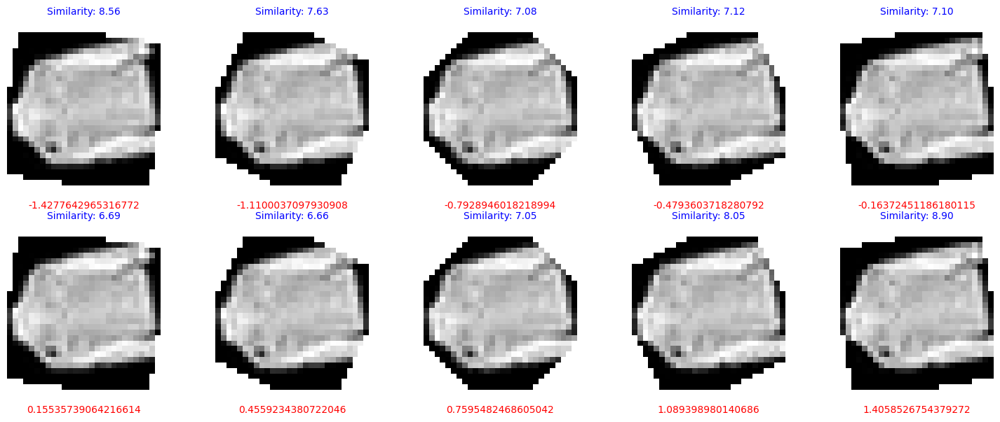

Cluster Label: 30


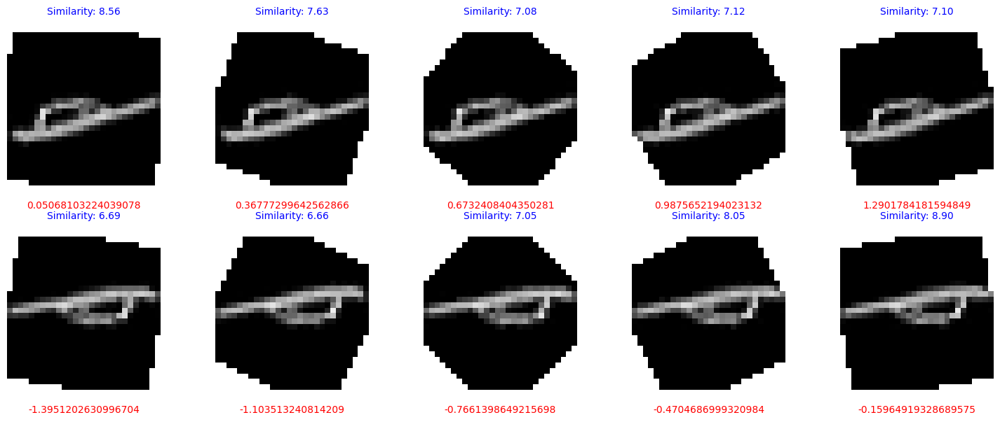

Cluster Label: 31


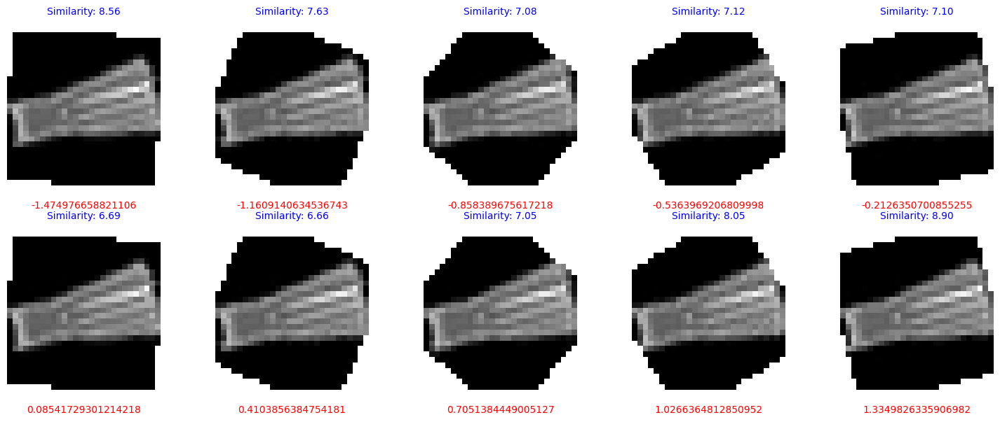

Cluster Label: 32


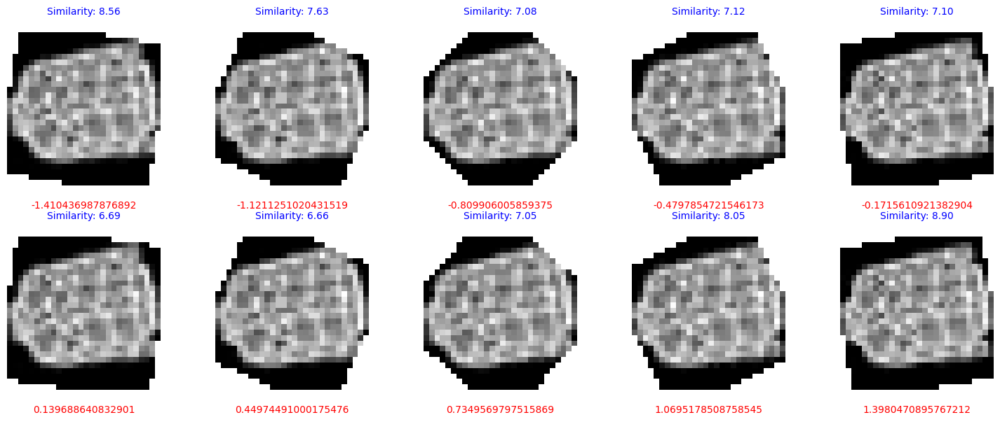

Cluster Label: 33


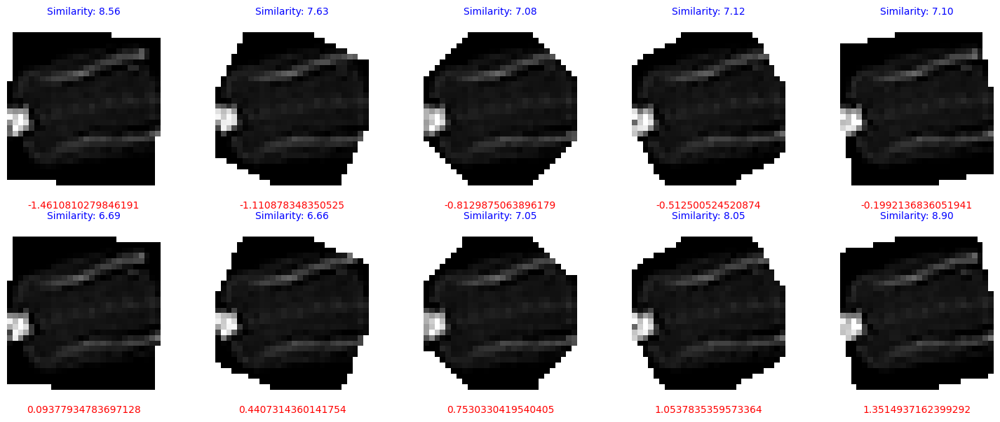

Cluster Label: 34


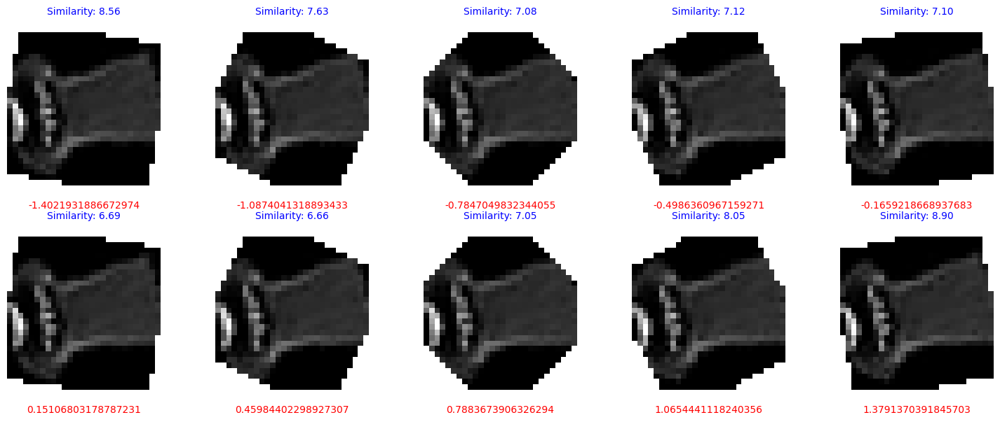

Cluster Label: 35


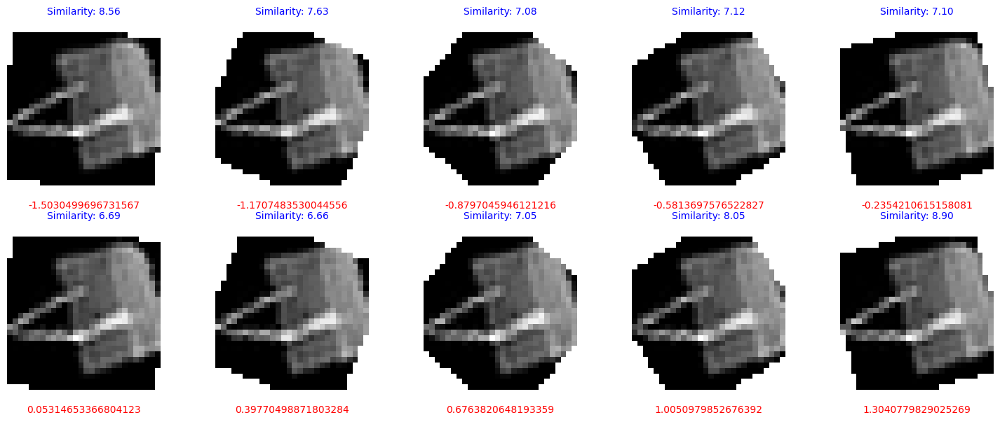

Cluster Label: 36


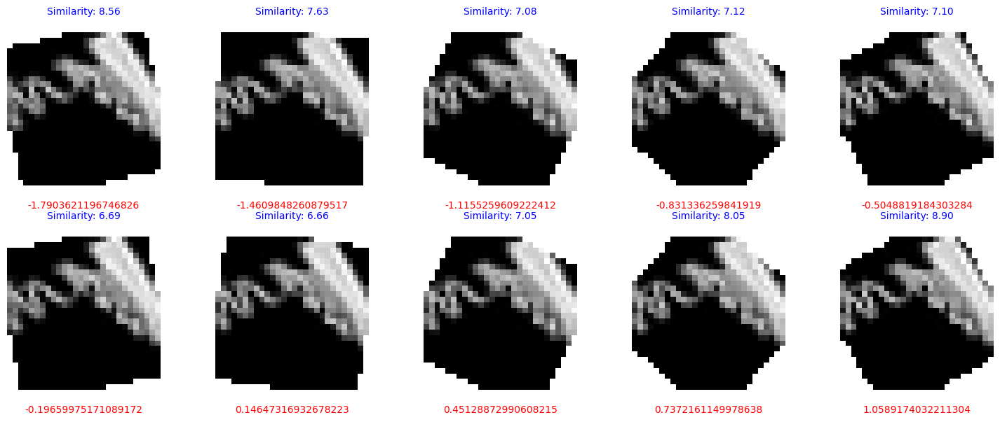

Cluster Label: 37


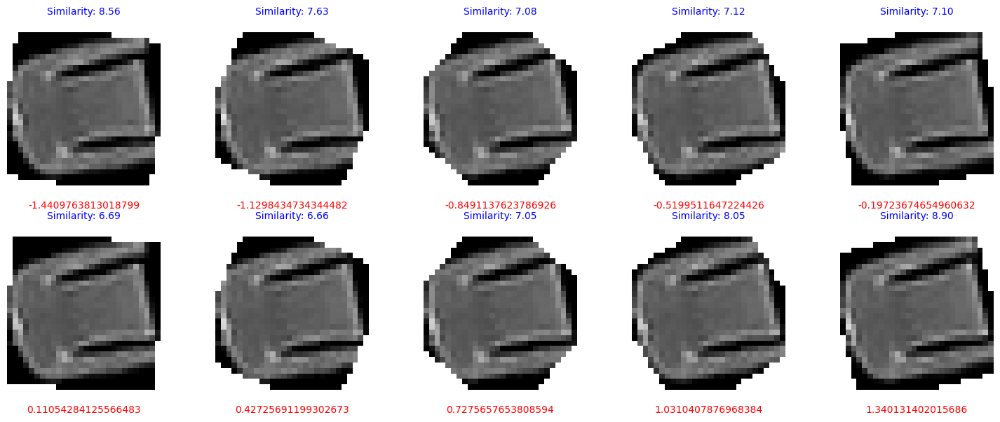

Cluster Label: 38


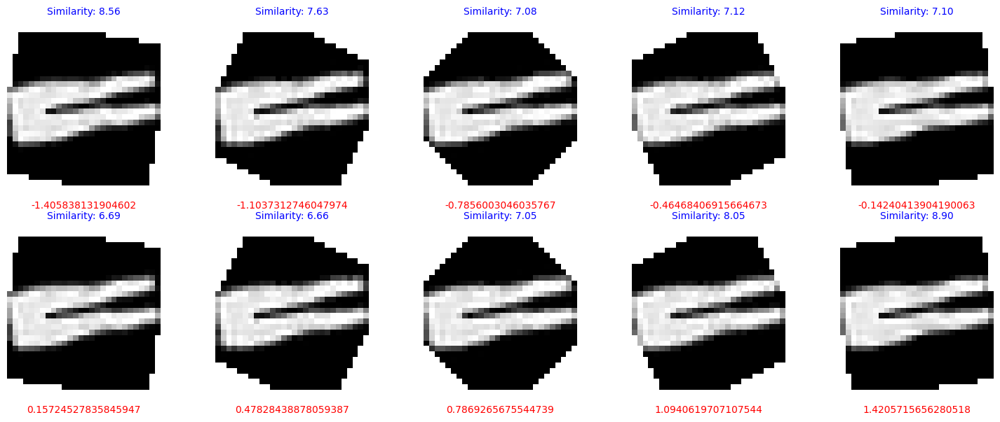

Cluster Label: 39


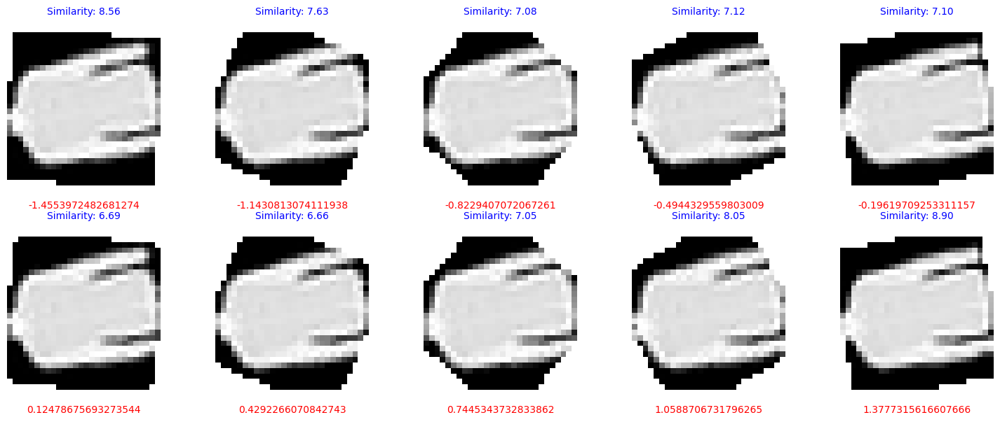

Cluster Label: 40


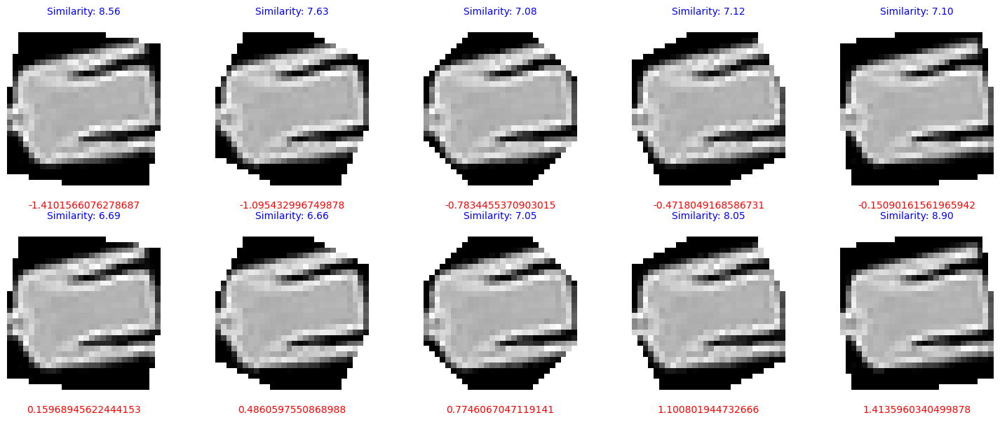

Cluster Label: 41


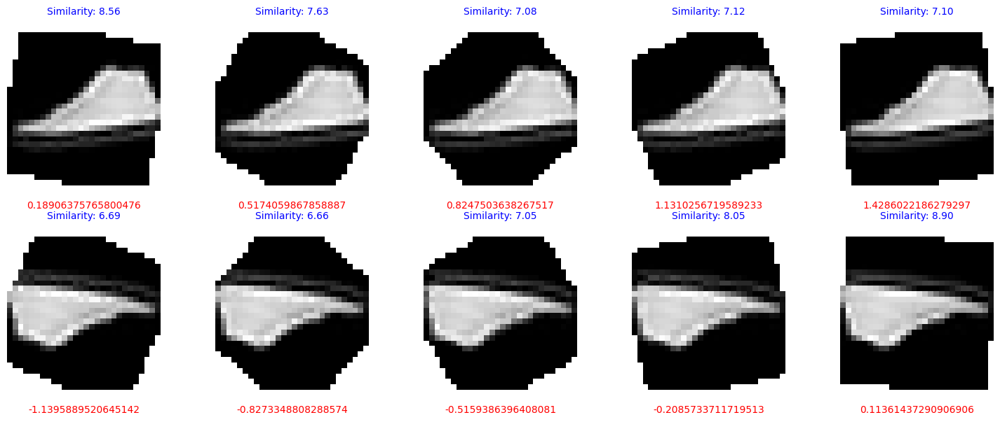

Cluster Label: 42


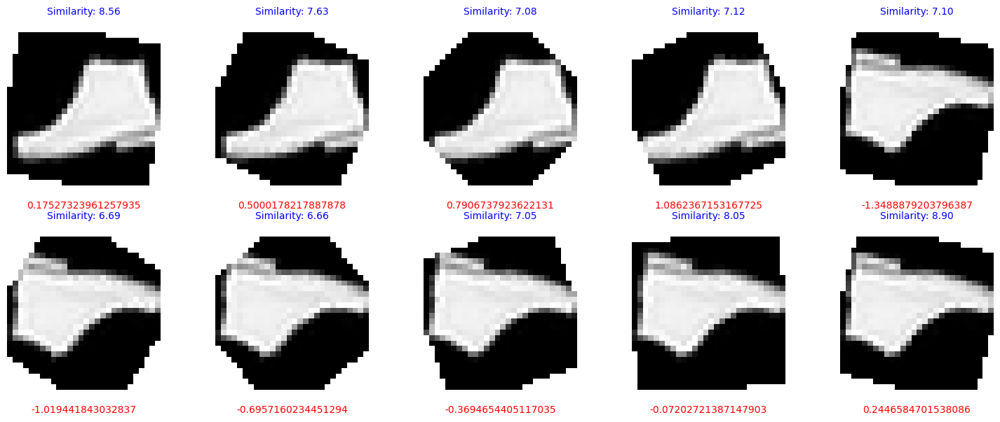

Cluster Label: 43


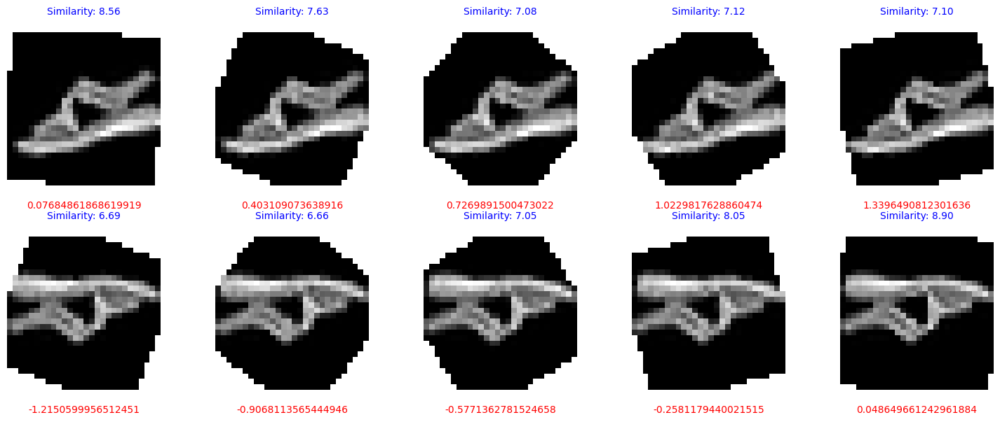

Cluster Label: 44


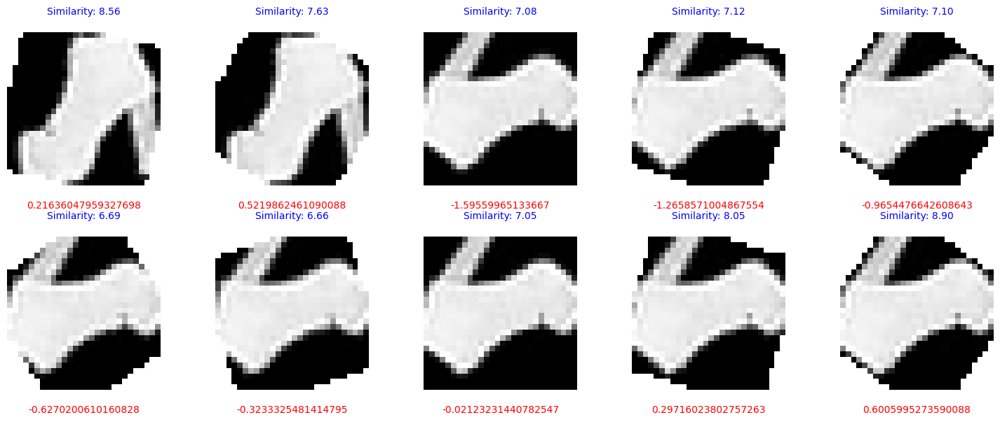

Cluster Label: 45


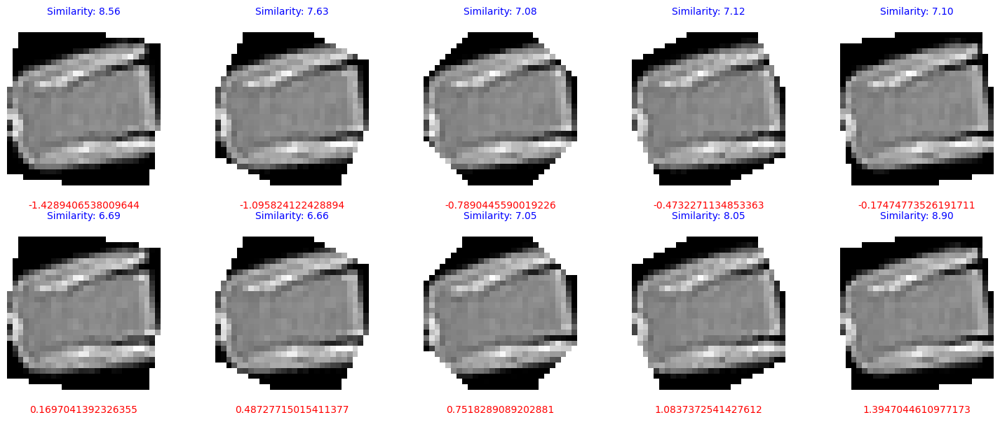

Cluster Label: 46


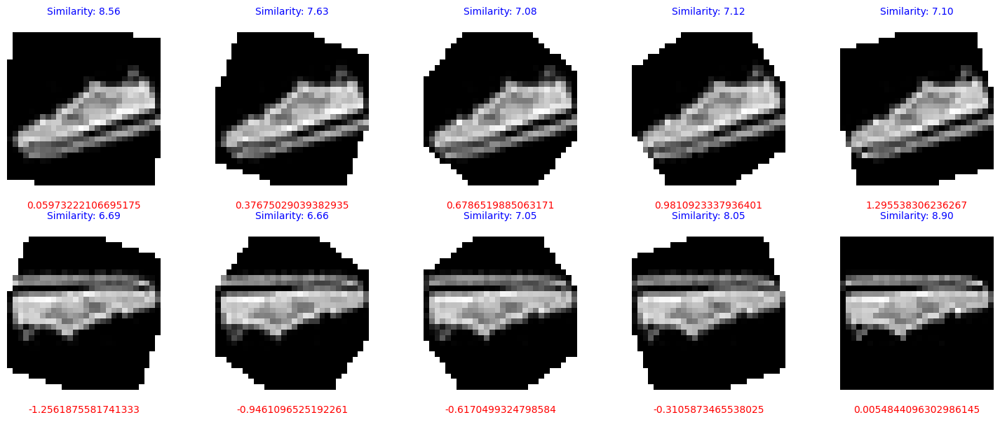

Cluster Label: 47


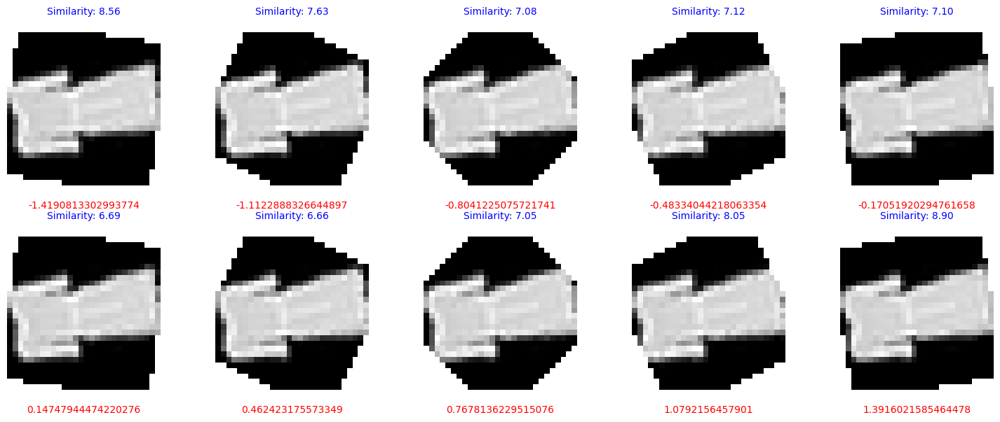

Cluster Label: 48


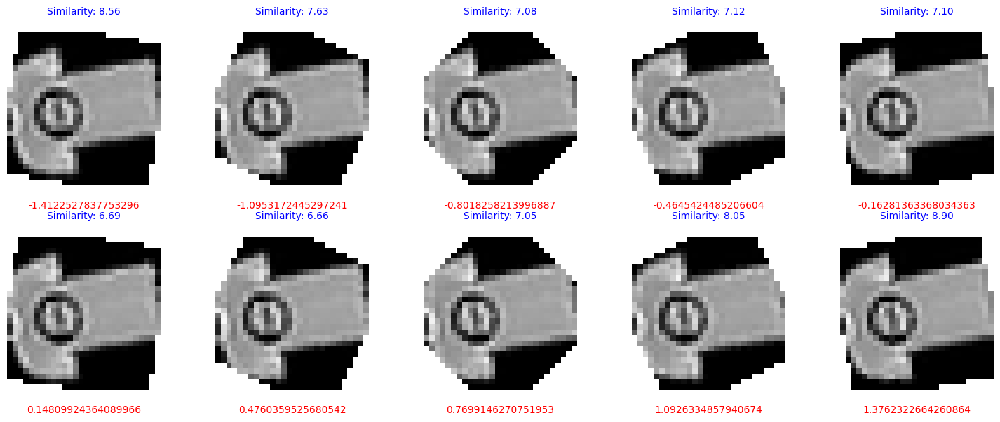

Cluster Label: 49


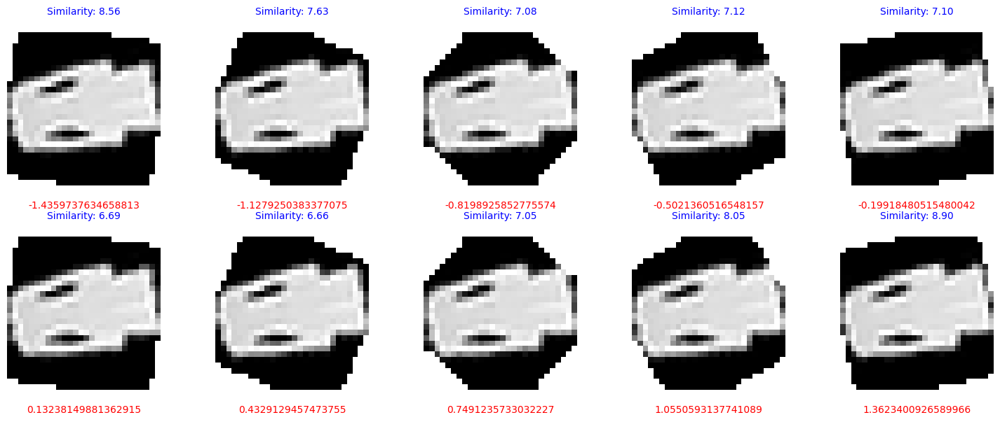

Cluster Label: 50


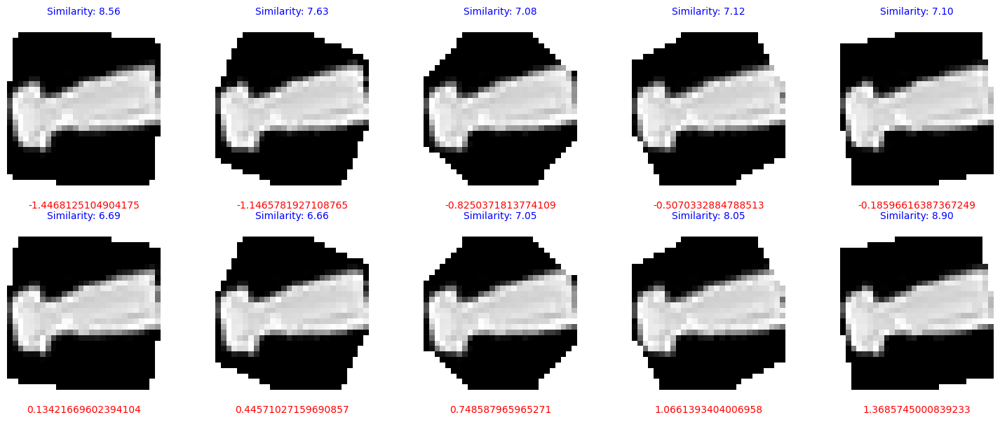

Cluster Label: 51


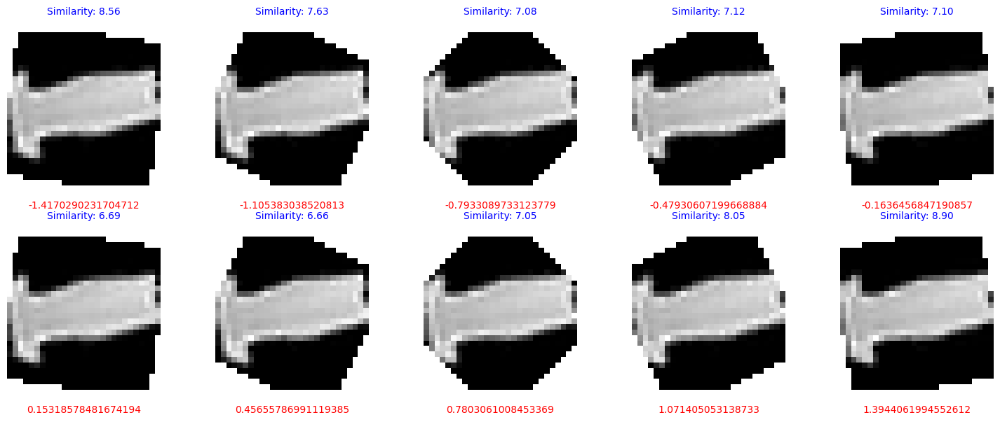

Cluster Label: 52


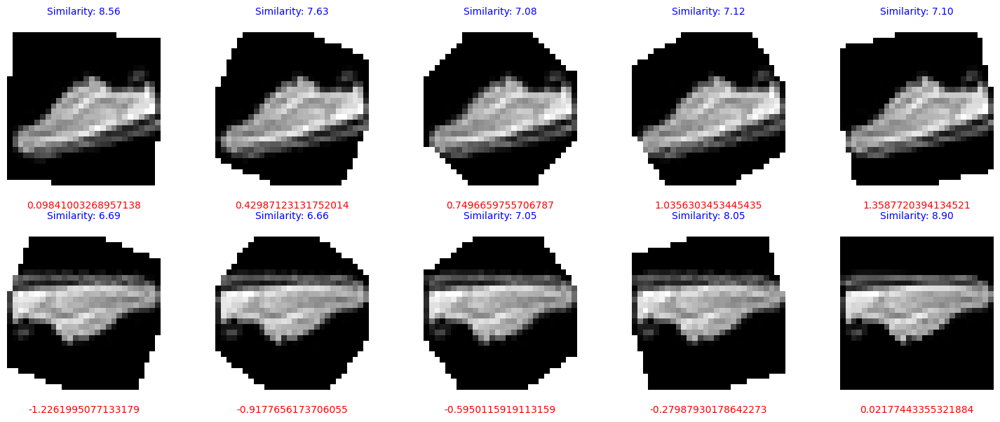

Cluster Label: 53


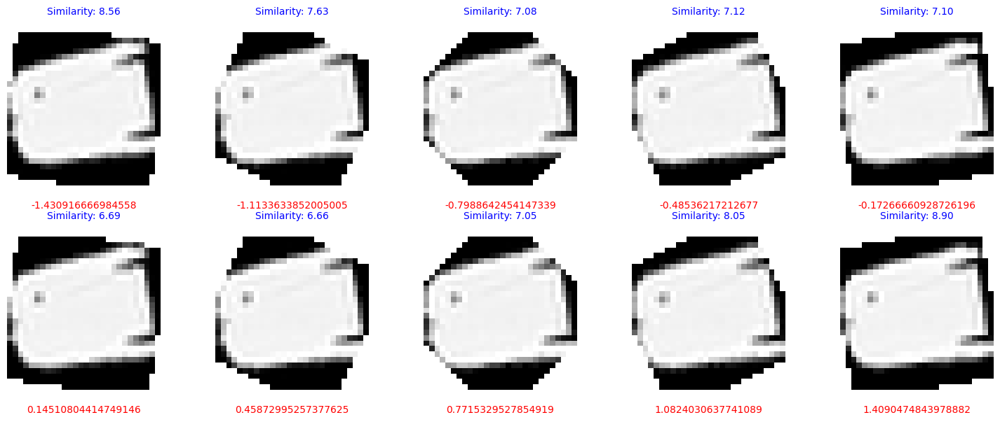

Cluster Label: 54


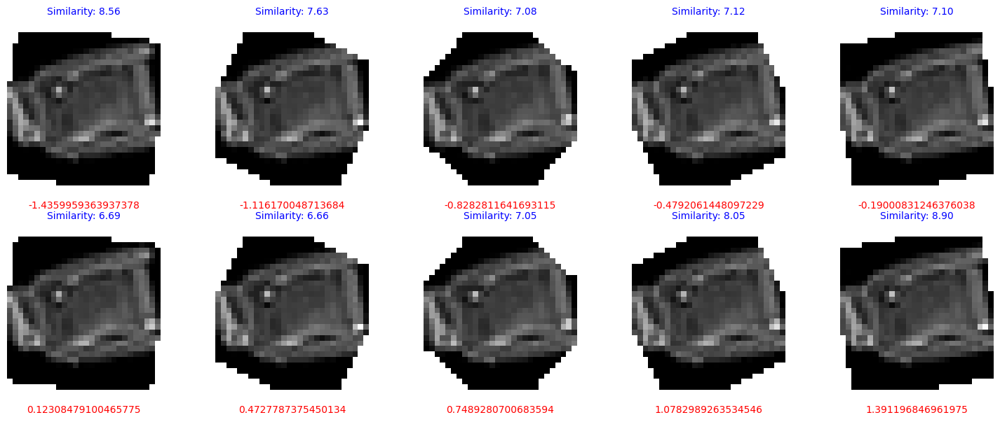

Cluster Label: 55


KeyboardInterrupt: 

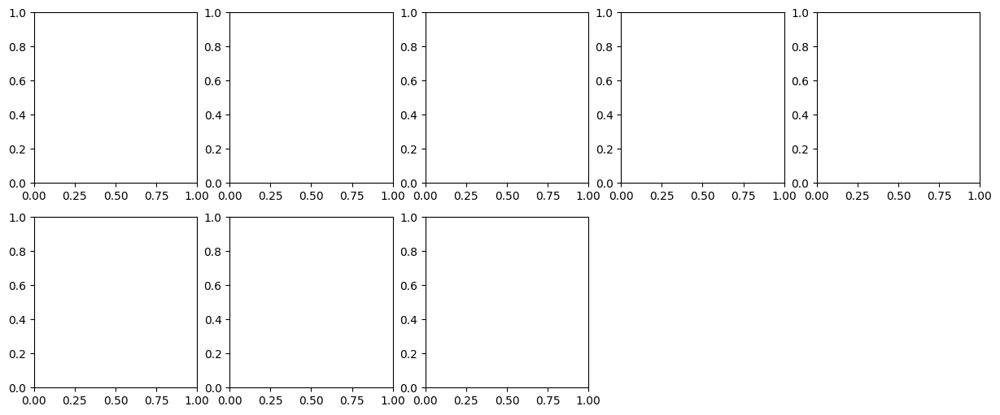

In [32]:
import matplotlib.pyplot as plt
import math
from scipy.spatial.distance import euclidean
from scipy.spatial import distance
from torchvision import transforms
transform = transforms.ToTensor()

tensor_images_few = train_data[0:5000]

# Lista para armazenar os valores de similaridade de cada cluster
similarities_a = []

z_angle = z_mean[:, 0]

labels_list = train_labels.tolist()
print(labels_list)

for cluster_label in set(labels_list):
    print(f"Cluster Label: {cluster_label}")

    # Encontrar os índices das imagens que pertencem a esse cluster
    cluster_indices = np.where(train_labels == cluster_label)[0]


    # Selecionar as imagens do tensor original usando os índices encontrados
    selected_images = tensor_images_few[cluster_indices]

    # Calcular a representação central do cluster (aqui, usaremos a média)
    #central_representation = torch.mean(selected_images, axis=0)


    # Calcular a similaridade (distância euclidiana) de cada imagem em relação à representação central
    #cluster_similarities = [distance.euclidean(image.ravel(), central_representation.ravel()) for image in selected_images]

    # Adicionar a lista de similaridades do cluster à lista geral
    #similarities_a.extend(cluster_similarities)

    # Definir quantas imagens por linha e calcular o número necessário de linhas
    images_per_row = 5
    num_images = len(selected_images)
    num_rows = math.ceil(num_images / images_per_row)

    # Criar uma figura com subplots
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 3 * num_rows))

    # Achatar a array de eixos para facilitar o mapeamento da imagem para o subplot
    axes_flat = axes.flatten()

    # Loop para plotar cada imagem no subplot correspondente e adicionar o índice
    for idx, (image, ax) in enumerate(zip(selected_images, axes_flat)):

        real_index = cluster_indices[idx]

        rot = z_angle[real_index].item()



        # Converter a imagem normalizada para a escala de 0 a 255
        imagem = (image * 255).byte().numpy()

        # Converter de numpy array para imagem PIL
        pil_imagem = Image.fromarray(imagem)

        # Converter ângulo de radianos para graus e rotacionar
        angulo_graus = np.degrees(rot)

        pil_imagem_rotacionada = pil_imagem.rotate(angulo_graus *-1, fillcolor="white", resample=Image.BICUBIC)

        tensor_imagem = transform(pil_imagem_rotacionada)


        ax.imshow(tensor_imagem.reshape(H, W), cmap='gray')
        ax.axis('off')
        # Obter o índice real no tensor principal e colocá-lo abaixo da imagem




        ax.text(0.5, -0.1, str(z_angle[real_index].item()), transform=ax.transAxes, ha='center', va='top', fontsize=10, color='red')
        # Mostrar a similaridade da imagem em relação à representação central
        ax.text(0.5, 1.1, f'Similarity: {cluster_similarities[idx]:.2f}', transform=ax.transAxes, ha='center', va='bottom', fontsize=10, color='blue')

    # Se houver menos imagens do que espaços de subplot, esconda os subplots extras
    for j in range(idx + 1, len(axes_flat)):
        axes_flat[j].axis('off')

    plt.tight_layout()
    plt.show()

# A lista "similarities" agora contém as similaridades de todas as imagens de todos os clusters
print("Similaridades de todos os clusters:", similarities_a)

# **Now, we are going to verigy if it is possible to aplly our trained model to new images and have some benefit in improving classification methods**

## **Prepare the images to next step**

In [ ]:

originl_data.max()




In [33]:
import torch
import torchvision.transforms.functional as TF
import random

# Supondo que tensor_images_resized seja o tensor original com imagens 28x28
num_images = 50  # Número de imagens a serem selecionadas
transformed_images = []
rotation_angles = []  # Lista para armazenar os ângulos de rotação

for i in range(num_images):
    # Seleciona uma imagem aleatória do tensor original
    idx = torch.randint(len(originl_data[0:5000]), (1,)).item()
    image = originl_data[idx]

    # Adiciona uma dimensão de canal para torná-lo [1, H, W]
    image = image.unsqueeze(0)  # Agora a imagem tem forma [1, 28, 28]

    # Escolhe um ângulo de rotação aleatório de 0 a 360 graus
    angle = random.randint(10,10)

    # Registra o ângulo escolhido
    rotation_angles.append(angle)

    # Aplica a rotação à imagem
    rotated_image = TF.rotate(image, angle)

    # Remove a dimensão do canal extra, se a imagem original não tinha dimensão de canal
    rotated_image = rotated_image.squeeze(0)  # Volta para [28, 28]

    # Adiciona a imagem rotacionada à lista
    transformed_images.append(rotated_image)

# Converte a lista de imagens transformadas de volta para um tensor
new_tensor = torch.stack(transformed_images)
new_tensor = new_tensor.float() / 255.0






In [ ]:
new_tensor.shape

<Figure size 200x200 with 0 Axes>

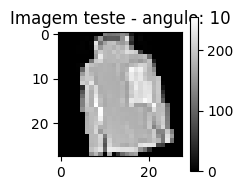

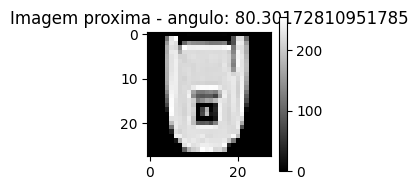

###########################


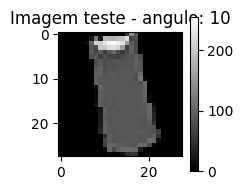

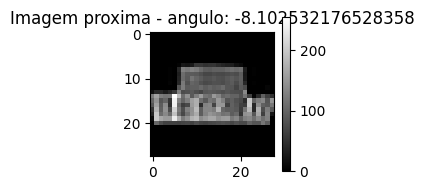

###########################


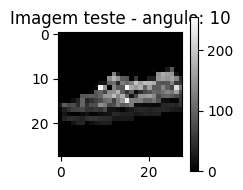

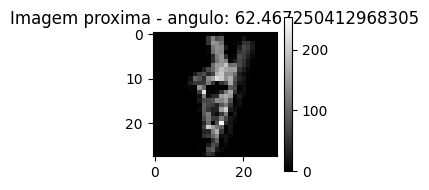

###########################


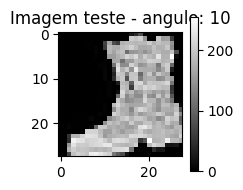

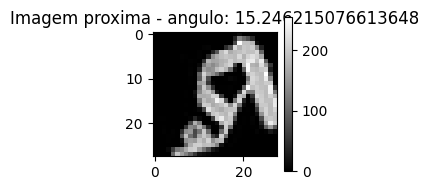

###########################


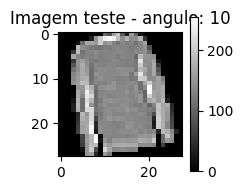

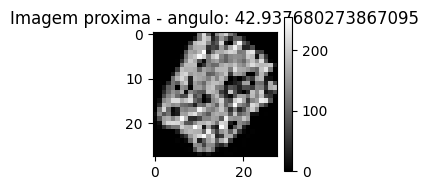

###########################


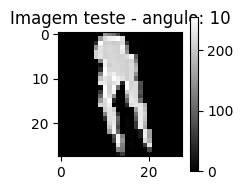

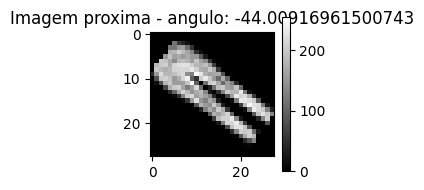

###########################


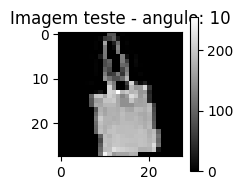

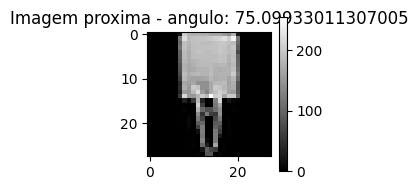

###########################


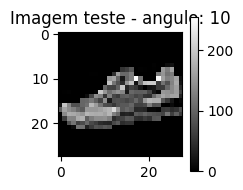

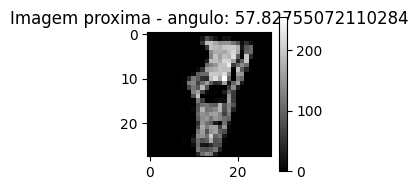

###########################


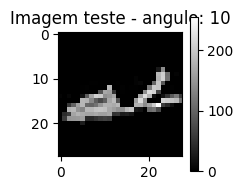

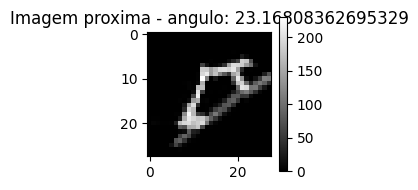

###########################


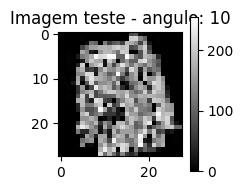

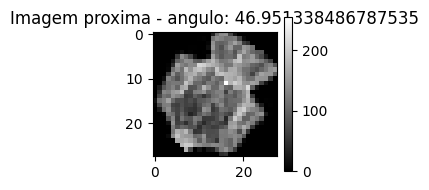

###########################


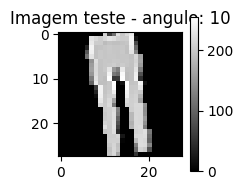

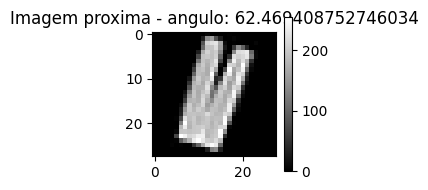

###########################


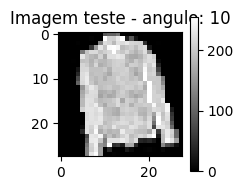

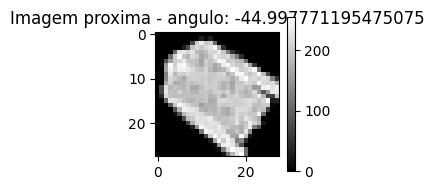

###########################


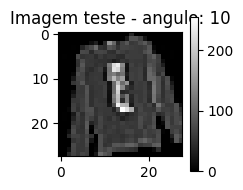

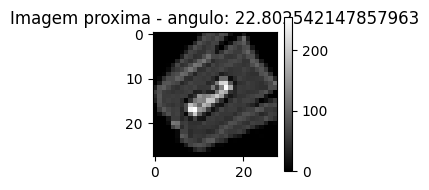

###########################


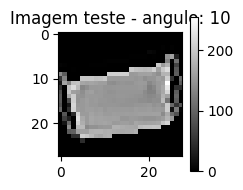

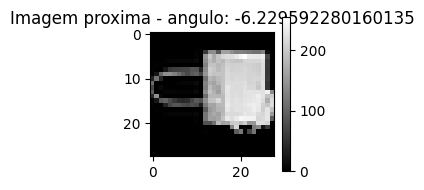

###########################


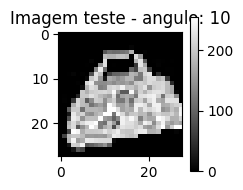

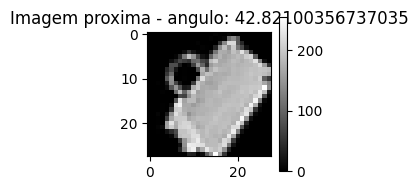

###########################


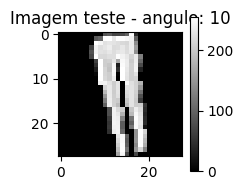

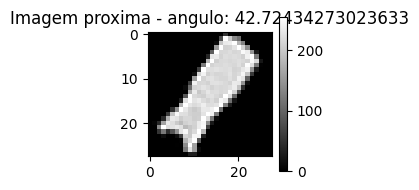

###########################


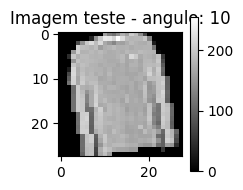

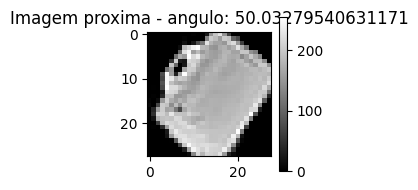

###########################


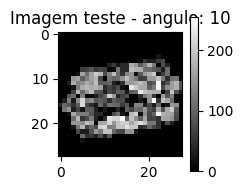

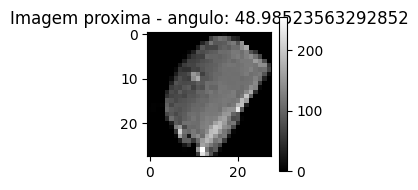

###########################


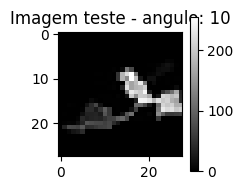

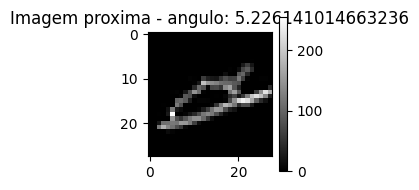

###########################


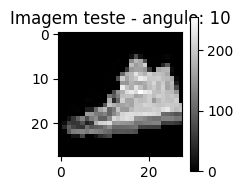

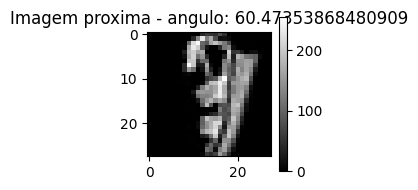

###########################


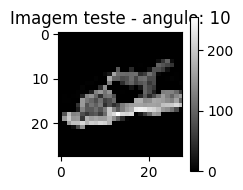

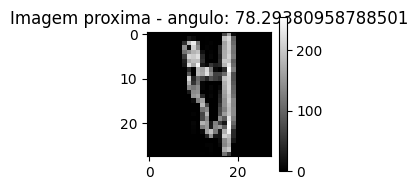

###########################


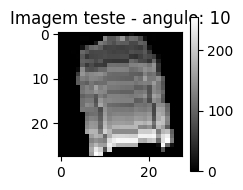

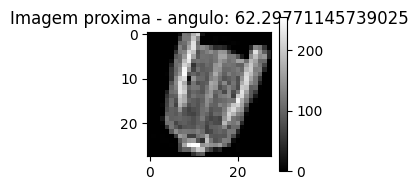

###########################


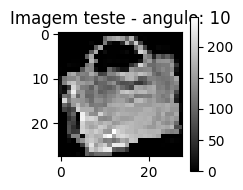

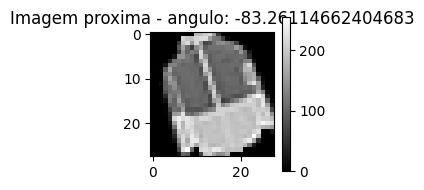

###########################


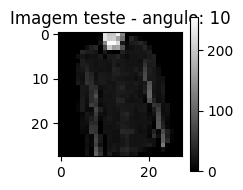

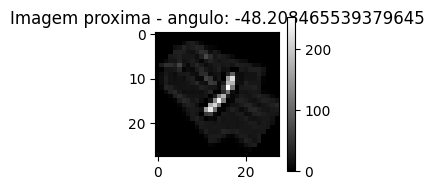

###########################


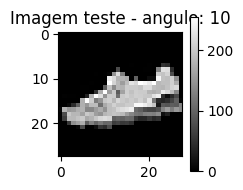

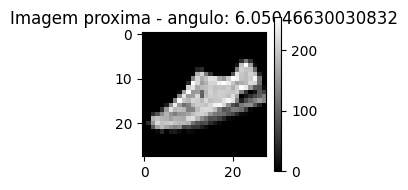

###########################


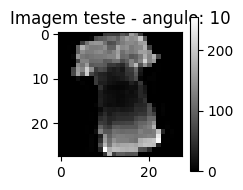

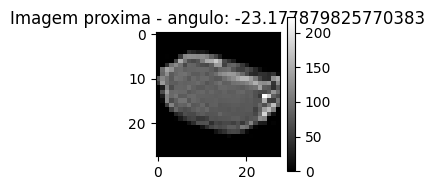

###########################


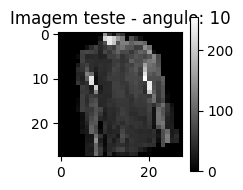

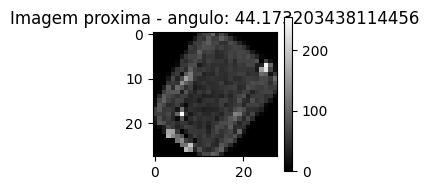

###########################


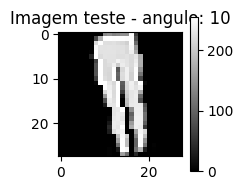

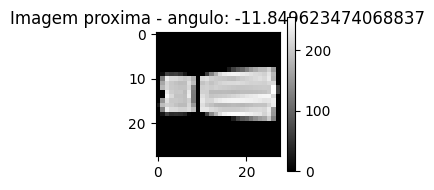

###########################


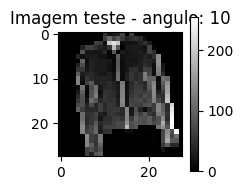

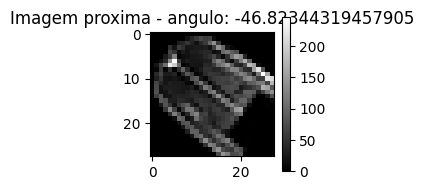

###########################


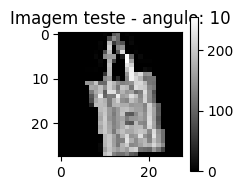

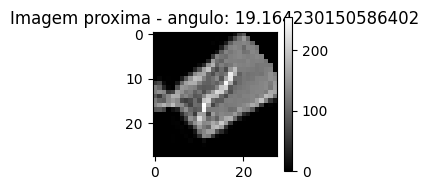

###########################


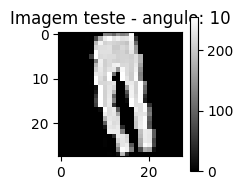

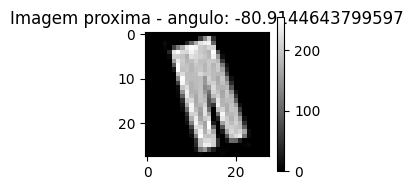

###########################


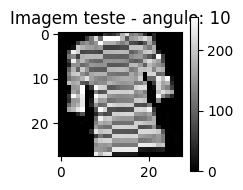

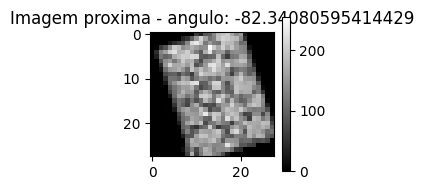

###########################


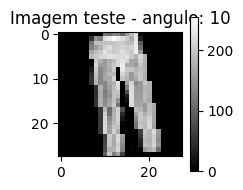

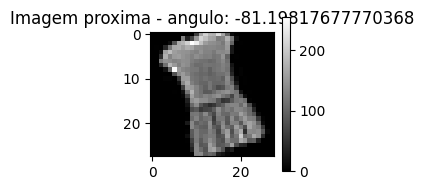

###########################


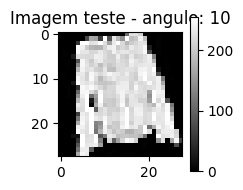

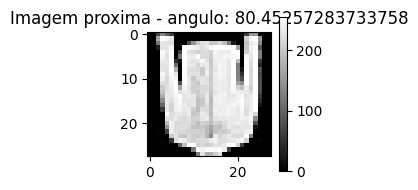

###########################


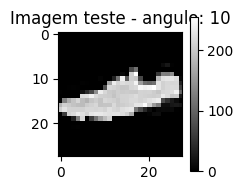

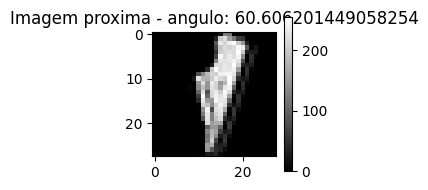

###########################


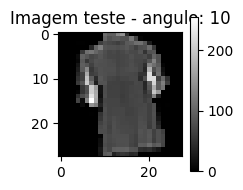

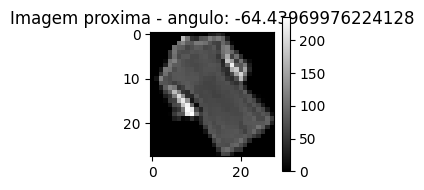

###########################


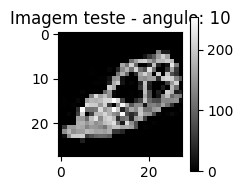

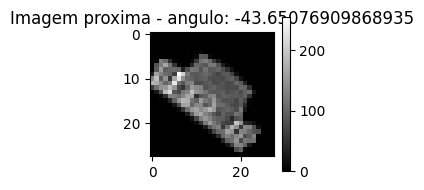

###########################


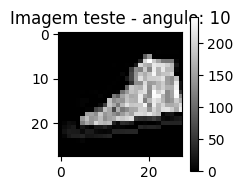

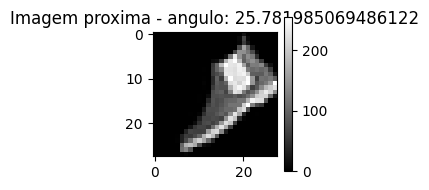

###########################


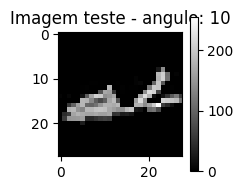

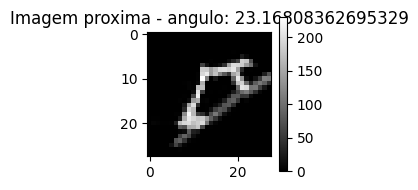

###########################


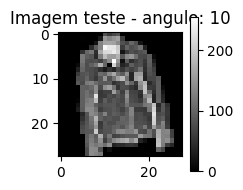

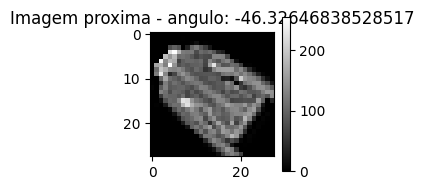

###########################


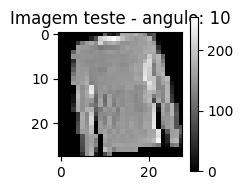

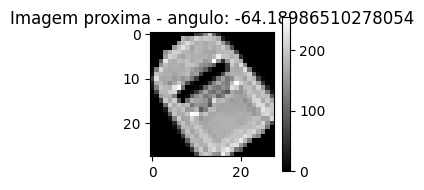

###########################


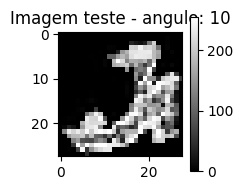

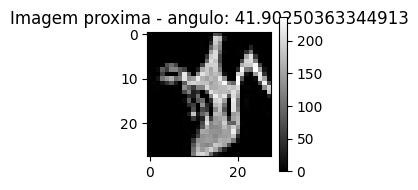

###########################


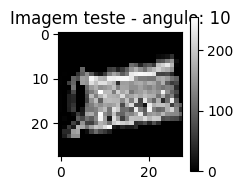

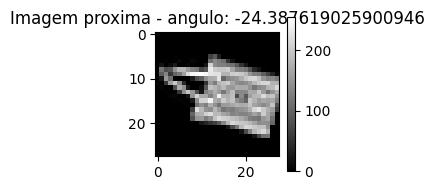

###########################


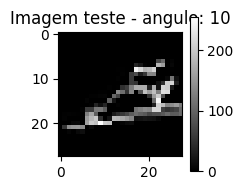

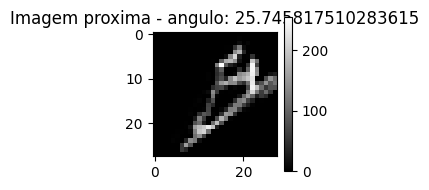

###########################


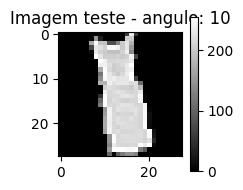

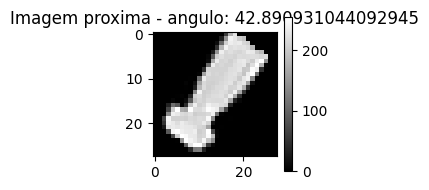

###########################


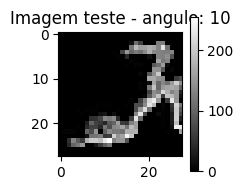

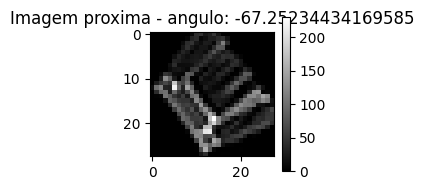

###########################


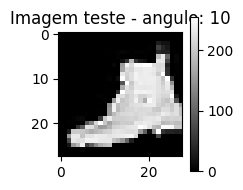

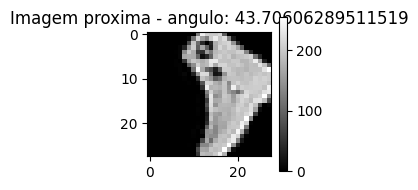

###########################


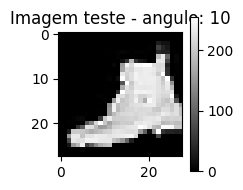

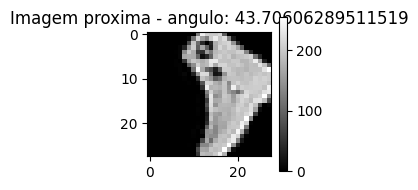

###########################


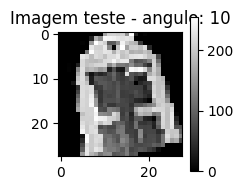

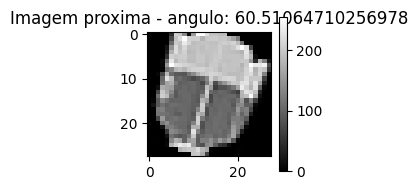

###########################


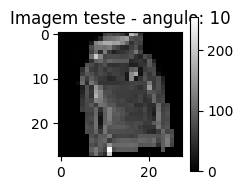

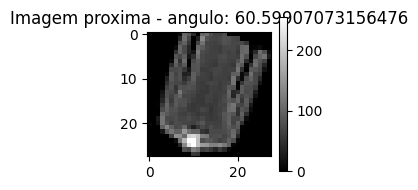

###########################


In [34]:
import torch
import numpy as np
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import torch
plt.figure(figsize=(2, 2))  # Exemplo: define a figura com 8x8 polegadas


#images_few = train_data[100:120]
for i, image in enumerate(new_tensor):
    the_idx = i
    z_mean_test, z_sd_test = rvae.encode(new_tensor[the_idx].unsqueeze(0))

    ang = z_mean_test[0][0].item()

    angulo_graus = np.degrees(ang)

    # Converter a imagem normalizada para a escala de 0 a 255
    imagem = (new_tensor[the_idx] * 255).byte().numpy()

    # Converter de numpy array para imagem PIL
    pil_imagem = Image.fromarray(imagem)

    # Converter ângulo de radianos para graus e rotacionar

    pil_imagem_rotacionada = pil_imagem.rotate(0, fillcolor="white", resample=Image.BICUBIC)
    plt.figure(figsize=(2, 2))  # Exemplo: define a figura com 8x8 polegadas
    plt.imshow(pil_imagem_rotacionada, cmap='gray')  # Usar escala de cinza para a plotagem
    plt.colorbar()  # Mostra a barra de cores ao lado
    plt.title(f"Imagem teste - angulo: {rotation_angles[i]}")  # Título do gráfico


    plt.show()

    # Concatenar os dois tensores ao longo da dimensão 0 (linhas)
    tensor_concatenado = torch.cat((z_mean[:,1:], z_mean_test[:,1:]), dim=0)

    # Função para normalizar cada coluna do tensor pelo range da coluna
    def normalize_columns_by_range(tensor):
        # Encontrar os valores mínimos e máximos ao longo de cada coluna
        min_vals = tensor.min(dim=0, keepdim=True)[0]
        max_vals = tensor.max(dim=0, keepdim=True)[0]

        # Calcular o range de cada coluna
        range_vals = max_vals - min_vals

        # Evitar divisão por zero adicionando um pequeno valor ao range onde ele é 0
        range_vals += (range_vals == 0) * 1e-5

        # Normalizar cada coluna pelo seu range
        normalized_tensor = (tensor - min_vals) / range_vals

        return normalized_tensor

    # Aplicar a normalização ao tensor concatenado
    normalized_tensor = normalize_columns_by_range(tensor_concatenado)

    # Primeiro tensor: todas as linhas exceto a última
    tensor1 = normalized_tensor[:-1]

    # Segundo tensor: apenas a última linha
    tensor2 = normalized_tensor[-1].unsqueeze(0)  #

    # Calculando a diferença ao quadrado entre o tensor de teste e cada linha do tensor modelo
    differences_squared = (tensor1 - tensor2).pow(2)

    # Somando as diferenças ao longo das colunas para obter a soma das diferenças quadradas para cada linha
    sum_of_squares = differences_squared.sum(1)

    # Calculando a raiz quadrada para obter as distâncias euclidianas
    distances = torch.sqrt(sum_of_squares)

    # Encontrando o índice da linha com a menor distância

    valores, indices = distances.topk(4, largest=False)

    # O segundo menor valor e seu índice
    #segundo_min_valor = valores[-1]
    #indice_segundo_min = indices[-1]

    min_distance, index_of_most_similar = distances.min(0)

    ang = z_mean[index_of_most_similar][0].item()

    angulo_graus = np.degrees(ang)
    # Plotar a imagem

    # Converter a imagem normalizada para a escala de 0 a 255
    imagem = (train_data[index_of_most_similar] * 255).byte().numpy()

    # Converter de numpy array para imagem PIL
    pil_imagem = Image.fromarray(imagem)

    # Converter ângulo de radianos para graus e rotacionar

    pil_imagem_rotacionada = pil_imagem.rotate(0, fillcolor="white", resample=Image.BICUBIC)
    plt.figure(figsize=(2, 2))  # Exemplo: define a figura com 8x8 polegadas
    plt.imshow(pil_imagem_rotacionada, cmap='gray')  # Usar escala de cinza para a plotagem
    plt.colorbar()  # Mostra a barra de cores ao lado
    plt.title(f"Imagem proxima - angulo: {angulo_graus}")  # Título do gráfico


    plt.show()  # Exibe a plotagem
    print("###########################")


import plotly.express as px
fig = px.scatter_3d(x=z_mean_test[:, 1], y=z_mean_test[:, 2], z=z_mean_test[:, 3], opacity=0.7, size_max=1)
fig.update_traces(marker=dict(size=3))


